# Time Crystal hamiltonian reproducing

In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
def spines(ax=None):
    if ax is None:
        ax = plt.gca()
    dict(ax.spines.items())["left"].set_position(('outward', 10))
    dict(ax.spines.items())["bottom"].set_position(('outward', 10))
    dict(ax.spines.items())["top"].set_position(('outward', 10))
    dict(ax.spines.items())["right"].set_position(('outward', 10))
    
def annotate_distance(ax, text, point1, point2, linestyle, fontsize, textoffset = (0.1,0)):
    ax.annotate('', point1, point2, \
            arrowprops={'arrowstyle':'<->', 'linestyle':linestyle, "facecolor":"black"}, fontsize=fontsize);
    ax.annotate(text, point1, (0.5*(point1[0]+point2[0])+textoffset[0], 0.5*(point1[1]+point2[1])+textoffset[1]),
                fontsize=fontsize)

In [3]:
#mpl.style.use('classic')
mpl.style.use('seaborn')

In [4]:
from scipy import *
from scipy.constants import e, h, hbar
#from qutip import *
from IPython.display import HTML
import matplotlib as mpl
import matplotlib.pyplot as plt
from numpy import *
import random
import scipy.linalg as la
from scipy.linalg import expm, sinm, cosm
import pandas
import numpy
from mpl_toolkits.mplot3d.axes3d import Axes3D
import numpy as np
import matplotlib

In [5]:
from ipywidgets import IntProgress
from IPython.display import display
import time

In [6]:
font = {"size":15}
matplotlib.rc("font", **font)

In [7]:
def PauliMatrix (n):
    if n == 0:
        return  [[1, 0], [0, 1]]
    if n == 1:
        return  [[0, 1], [1, 0]]
    if n == 2:
        return  [[0, -1j], [1j, 0]]
    if n == 3:
        return  [[1, 0], [0, -1]]
    if n == 4:
        return  [[1, 0], [0, 1]]
    return print ('WRONG Pauli Matrix ID')

In [9]:
def tensorize1SiteMatrixKroneker(nSites, nSite, nPauli):
    A = zeros(nSites - nSite) 
    B = zeros(nSite - 1)
    C = []
    for i in B:
        C.append(int(i))
    C.append(nPauli)
    for i in A:
        C.append(int(i)) 
    D = []    
    for i in C:
        D.append(PauliMatrix(i))   
    D1=D[0]
    for i in range(1, nSites,1):
        D1=kron(D1,D[i])
    return D1

def fixedLineKK(nSites, k):
    E = []
    for i in range(0, nSites - 1,1):
        E.append(np.dot(tensorize1SiteMatrixKroneker(nSites, i+1, k),tensorize1SiteMatrixKroneker(nSites, i+2, k)))
    return E

def fixedLocalK(nSites, k):
    F = []
    for i in range(0, nSites,1):
        F.append(tensorize1SiteMatrixKroneker(nSites, i+1, k))
    return F
def disorderedLocalK(nSites, k):
    G = []
    for i in range(0, nSites,1):
        G.append(random.random()*tensorize1SiteMatrixKroneker(nSites, i+1, k))
    return G
def deltaF (w, sitesN):
    H = []
    for i in range(0, sitesN,1):
        H.append(w*(random.random()*2-1))
    return H

def deltaS (w, sitesN):
    H = []
    H.append(0)
    for i in range(1, sitesN,1):
        H.append(i*w/(sitesN-1))
    return H

def deltaF3D (w, sitesN):
    H = []
    for j in range (0, size(w)-1,1):
        HH=[]
        for i in range(0, sitesN,1):
            HH.append(w[j]*(random.random()*2-1))
        H.append(HH)
    return H

def Ufunc(nSites,alpha,g,T,delta):
    X = tensorize1SiteMatrixKroneker(nSites, 1, 1)                        # spins rotation
    Z = delta[0]*tensorize1SiteMatrixKroneker(nSites, 1, 3)               # spins with disorder
    for i in range(2, nSites+1,1):
        X = X + tensorize1SiteMatrixKroneker(nSites, i, 1)
        Z = Z + delta[i-1]*tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    xxyy = np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 1),tensorize1SiteMatrixKroneker(nSites, 2, 1)) + \
           np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 2),tensorize1SiteMatrixKroneker(nSites, 2, 2))            #interaction
    for i in range(2, nSites,1):
        xxyy = xxyy+np.dot(tensorize1SiteMatrixKroneker(nSites, i, 1),tensorize1SiteMatrixKroneker(nSites, i+1, 1)) + \
                    np.dot(tensorize1SiteMatrixKroneker(nSites, i, 2),tensorize1SiteMatrixKroneker(nSites, i+1, 2))
    
    return np.dot(expm(-1j*alpha*X),expm((-1j*T*(Z+g*xxyy)))) 

def Ufunc_all_to_all(nSites,alpha,g,T,delta):
    X = tensorize1SiteMatrixKroneker(nSites, 1, 1)                        # spins rotation
    Z = delta[0]*tensorize1SiteMatrixKroneker(nSites, 1, 3)               # spins with disorder
    for i in range(2, nSites+1,1):
        X = X + tensorize1SiteMatrixKroneker(nSites, i, 1)
        Z = Z + delta[i-1]*tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    xxyy = np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 1),tensorize1SiteMatrixKroneker(nSites, 2, 1)) - \
           np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 1),tensorize1SiteMatrixKroneker(nSites, 2, 1))            #interaction
    for i in range(1, nSites+1,1):
        for j in range(1,nSites+1,1):
            if i<j:
                #print(i,j)
                xxyy = xxyy + np.dot(tensorize1SiteMatrixKroneker(nSites, i, 1),tensorize1SiteMatrixKroneker(nSites, j, 1)) + \
                    np.dot(tensorize1SiteMatrixKroneker(nSites, i, 2),tensorize1SiteMatrixKroneker(nSites, j, 2))
    
    return np.dot(expm(-1j*alpha*X),expm((-1j*T*(Z+g*xxyy)))) 

def Ufunc_all_to_all_Ising(nSites,alpha,g,T,delta):
    X = tensorize1SiteMatrixKroneker(nSites, 1, 1)                        # spins rotation
    Z = delta[0]*tensorize1SiteMatrixKroneker(nSites, 1, 3)               # spins with disorder
    for i in range(2, nSites+1,1):
        X = X + tensorize1SiteMatrixKroneker(nSites, i, 1)
        Z = Z + delta[i-1]*tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    xxyy = np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 3),tensorize1SiteMatrixKroneker(nSites, 2, 3)) - \
           np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 3),tensorize1SiteMatrixKroneker(nSites, 2, 3))            #interaction
    for i in range(1, nSites+1,1):
        for j in range(1,nSites+1,1):
            if i<j:
                xxyy = xxyy + np.dot(tensorize1SiteMatrixKroneker(nSites, i, 3),tensorize1SiteMatrixKroneker(nSites, j, 3))
    
    return np.dot(expm(-1j*alpha*X),expm((-1j*T*(Z+g*xxyy)))) 


def Ufunc_alpha(nSites,alpha,g,T,delta):
    X = alpha[0]*tensorize1SiteMatrixKroneker(nSites, 1, 1)                        # spins rotation
    Z = delta[0]*tensorize1SiteMatrixKroneker(nSites, 1, 3)               # spins with disorder
    for i in range(2, nSites+1,1):
        X = X + alpha[i-1]*tensorize1SiteMatrixKroneker(nSites, i, 1)
        Z = Z + delta[i-1]*tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    xxyy = np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 1),tensorize1SiteMatrixKroneker(nSites, 2, 1)) + \
           np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 2),tensorize1SiteMatrixKroneker(nSites, 2, 2))            #interaction
    for i in range(2, nSites,1):
        xxyy = xxyy+np.dot(tensorize1SiteMatrixKroneker(nSites, i, 1),tensorize1SiteMatrixKroneker(nSites, i+1, 1)) + \
                    np.dot(tensorize1SiteMatrixKroneker(nSites, i, 2),tensorize1SiteMatrixKroneker(nSites, i+1, 2))
    
    return np.dot(expm(-1j*X),expm((-1j*T*(Z+g*xxyy))))

def Gfunc(nSites,alpha,g,T,delta):
    X = tensorize1SiteMatrixKroneker(nSites, 1, 1)                        # spins rotation
    Z = delta[0]*tensorize1SiteMatrixKroneker(nSites, 1, 3)               # spins with disorder
    for i in range(2, nSites+1,1):
        X = X + tensorize1SiteMatrixKroneker(nSites, i, 1)
        Z = Z + delta[i-1]*tensorize1SiteMatrixKroneker(nSites, 1, 3)
    
    xxyy = np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 1),tensorize1SiteMatrixKroneker(nSites, 2, 1)) + \
           np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 2),tensorize1SiteMatrixKroneker(nSites, 2, 2))            #interaction
    for i in range(2, nSites,1):
        xxyy = xxyy+np.dot(tensorize1SiteMatrixKroneker(nSites, i, 1),tensorize1SiteMatrixKroneker(nSites, i+1, 1)) + \
                    np.dot(tensorize1SiteMatrixKroneker(nSites, i, 2),tensorize1SiteMatrixKroneker(nSites, i+1, 2))
    
    return np.dot(expm(-1j*0*X),expm((-1j*T*(Z+g*xxyy)))) 

def states(phiInitFull, Time):
    A = np.array([phiInitFull])
    for i in range(0, Time-1,1):
        A = np.append(A, [np.dot(U,A[i])], 0)
    return A

def states_crop(phiInitFull, Time, N):
    A = np.array([phiInitFull])
    for i in range(0, Time-2,1):
        A = np.append(A, [np.dot(U,A[i])], 0)
        G = Gfunc(nSites,alpha,g,T/N,delta)
    for i in range(1,N):
        A = np.append(A, [np.dot(G,A[-1])], 0)
    return A

def UfuncZZ(nSites,alpha,g,T,delta):
    X = tensorize1SiteMatrixKroneker(nSites, 1, 1)                        # spins rotation
    Z = delta[0]*tensorize1SiteMatrixKroneker(nSites, 1, 3)               # spins with disorder
    for i in range(2, nSites+1,1):
        X = X + tensorize1SiteMatrixKroneker(nSites, i, 1)
        Z = Z + delta[i-1]*tensorize1SiteMatrixKroneker(nSites, 1, 3)
    
    xxyy = np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 1),tensorize1SiteMatrixKroneker(nSites, 2, 1)) + \
           np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 2),tensorize1SiteMatrixKroneker(nSites, 2, 2)) - \
           np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 3),tensorize1SiteMatrixKroneker(nSites, 2, 3)) #interaction
    for i in range(2, nSites,1):
        xxyy = xxyy+np.dot(tensorize1SiteMatrixKroneker(nSites, i, 1),tensorize1SiteMatrixKroneker(nSites, i+1, 1)) + \
                    np.dot(tensorize1SiteMatrixKroneker(nSites, i, 2),tensorize1SiteMatrixKroneker(nSites, i+1, 2)) - \
                    np.dot(tensorize1SiteMatrixKroneker(nSites, i, 3),tensorize1SiteMatrixKroneker(nSites, i+1, 3))
    
    return np.dot(expm(-1j*alpha*X),expm((-1j*T*(Z+g*xxyy)))) 

def GfuncZZ(nSites,alpha,g,T,delta):
    X = tensorize1SiteMatrixKroneker(nSites, 1, 1)                        # spins rotation
    Z = delta[0]*tensorize1SiteMatrixKroneker(nSites, 1, 3)               # spins with disorder
    for i in range(2, nSites+1,1):
        X = X + tensorize1SiteMatrixKroneker(nSites, i, 1)
        Z = Z + delta[i-1]*tensorize1SiteMatrixKroneker(nSites, 1, 3)
    
    xxyy = np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 1),tensorize1SiteMatrixKroneker(nSites, 2, 1)) + \
           np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 2),tensorize1SiteMatrixKroneker(nSites, 2, 2)) - \
           np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 3),tensorize1SiteMatrixKroneker(nSites, 2, 3))          #interaction
    for i in range(2, nSites,1):
        xxyy = xxyy+np.dot(tensorize1SiteMatrixKroneker(nSites, i, 1),tensorize1SiteMatrixKroneker(nSites, i+1, 1)) + \
                    np.dot(tensorize1SiteMatrixKroneker(nSites, i, 2),tensorize1SiteMatrixKroneker(nSites, i+1, 2)) - \
                    np.dot(tensorize1SiteMatrixKroneker(nSites, i, 3),tensorize1SiteMatrixKroneker(nSites, i+1, 3))
    
    return np.dot(expm(-1j*0*X),expm((-1j*T*(Z+g*xxyy)))) 

def states_cropZZ(phiInitFull, Time, N):
    A = np.array([phiInitFull])
    for i in range(0, Time-2,1):
        A = np.append(A, [np.dot(U,A[i])], 0)
        G = GfuncZZ(nSites,alpha,g,T/N,delta)
    for i in range(1,N):
        A = np.append(A, [np.dot(G,A[-1])], 0)
    return A

def UfuncXX(nSites,alpha,g,T,delta):
    X = tensorize1SiteMatrixKroneker(nSites, 1, 1)                        # spins rotation
    Z = delta[0]*tensorize1SiteMatrixKroneker(nSites, 1, 3)               # spins with disorder
    for i in range(2, nSites+1,1):
        X = X + tensorize1SiteMatrixKroneker(nSites, i, 1)
        Z = Z + delta[i-1]*tensorize1SiteMatrixKroneker(nSites, 1, 3)
    
    xxyy = np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 1),tensorize1SiteMatrixKroneker(nSites, 2, 1))
           
    for i in range(2, nSites,1):
        xxyy = xxyy+np.dot(tensorize1SiteMatrixKroneker(nSites, i, 1),tensorize1SiteMatrixKroneker(nSites, i+1, 1))
                    
    
    return np.dot(expm(-1j*alpha*X),expm((-1j*T*(Z+g*xxyy)))) 

def GfuncXX(nSites,alpha,g,T,delta):
    X = tensorize1SiteMatrixKroneker(nSites, 1, 1)                        # spins rotation
    Z = delta[0]*tensorize1SiteMatrixKroneker(nSites, 1, 3)               # spins with disorder
    for i in range(2, nSites+1,1):
        X = X + tensorize1SiteMatrixKroneker(nSites, i, 1)
        Z = Z + delta[i-1]*tensorize1SiteMatrixKroneker(nSites, 1, 3)
    
    xxyy = np.dot(tensorize1SiteMatrixKroneker(nSites, 1, 1),tensorize1SiteMatrixKroneker(nSites, 2, 1)) 
           
    for i in range(2, nSites,1):
        xxyy = xxyy+np.dot(tensorize1SiteMatrixKroneker(nSites, i, 1),tensorize1SiteMatrixKroneker(nSites, i+1, 1))
    
    return np.dot(expm(-1j*0*X),expm((-1j*T*(Z+g*xxyy)))) 

def states_cropXX(phiInitFull, Time, N):
    A = np.array([phiInitFull])
    for i in range(0, Time-2,1):
        A = np.append(A, [np.dot(U,A[i])], 0)
        G = GfuncXX(nSites,alpha,g,T/N,delta)
    for i in range(1,N):
        A = np.append(A, [np.dot(G,A[-1])], 0)
    return A

def transponiren(vector):
    a = np.zeros((size(vector)), dtype=np.complex)[newaxis, :]
    a = a.T
    a=a-a
    for i in range(0, size(vector),1):
        a[i] = np.complex128(vector[i])
    return a

In [10]:
tensorize1SiteMatrixKroneker(3, 3, 1)

array([[0, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 1, 0]])

In [11]:
def density_Matrix(phiInitFull):
    return np.kron(phiInitFull, conjugate(phiInitFull)).reshape(size(phiInitFull),size(phiInitFull))

def entropy(phiInitFull):
    X=density_Matrix(phiInitFull)
    return -(X*log(X)).trace()

In [12]:
def Partial_Entropy(Vector):
    RHO = density_Matrix(Vector)
    #print(RHO)
    Reduced_matrix = [[RHO[0][0]+RHO[1][1], RHO[0][2]+RHO[1][3]], [RHO[2][0]+RHO[3][1], RHO[2][2]+RHO[3][3]]]
    #print(Reduced_matrix)
    eigvals, eigvecs = la.eig(Reduced_matrix)
    eigvals = real(eigvals)
    nzvals = eigvals[eigvals != 0]
    #print(nzvals)
    logvals = []
    for i in nzvals:
        #print(i)
        logvals.append(log(sqrt(i**2)))
    #print(logvals)
    T = float(real(-sum(nzvals * logvals)))
    return T

In [13]:
def Floquet_eigenvalues(U):
    evals, evecs = la.eig(U)
    eargs = angle(evals)

    eargs += (eargs <= -pi) * (2 * pi) + (eargs > pi) * (-2 * pi)
    e_quasi = -eargs / T

    if sort:
        order = np.argsort(-e_quasi)
    else:
        order = list(range(len(evals)))

    kets_order = [np.matrix(evecs[:, o]).T for o in order]

    return kets_order, e_quasi[order]

In [14]:
def matrix_chop(matrix):
    T = []
    for i in matrix:
        T.append(chop(i))
    return T


In [15]:
def chop(expr, *, max=0.01):
    return [round(i,3) if abs(i) > max else 0 for i in expr]

In [16]:
def concurrence(RHO):
    rhot = np.dot(np.dot(kron(PauliMatrix(2),PauliMatrix(2)),conj(RHO)),kron(PauliMatrix(2),PauliMatrix(2)))
    eigs = la.fractional_matrix_power(np.dot(np.dot(la.fractional_matrix_power(RHO, 1/2),rhot),la.fractional_matrix_power(RHO, 1/2)),1/2)
    evals, evecs = la.eig(eigs) 
    evals = chop(sort(evals))
    return (max(0,evals[3]-evals[2]-evals[1]-evals[0]))

# Stable Picture

In [239]:
nSites = 2

eps=0.964                 #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                   #disorder
delta = deltaF(w, nSites)
g = 0.05                  #Interaction
T = 1                     # Period

timess=101
times = np.linspace(1, timess, timess)

In [240]:
#U=Ufunc(nSites,alpha,g, T, delta)

U=Ufunc_all_to_all_Ising(nSites,alpha,g, T, delta)

phiInitFull = np.full((2**nSites), 0)
phiInitFull[0] = 1
#phiInitFull[3] = 1                                ##initial state
#phiInitFull = Final[50]

#phiInitFull = np.full((2**nSites), 0, dtype = complex)
#phiInitFull[0] = 1-1j
#phiInitFull[3] = -1-1j
#phiInitFull = phiInitFull/2

Final = states(phiInitFull,timess)                ## Evolution of states

f = IntProgress(min=0, max=timess)                # instantiate the bar
display(f)                                        # display the bar

sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
    sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
observablesX = []
observablesY = []
observables = []
for i in Final:
    observablesX.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real)
    observablesY.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real)
    observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    f.value += 1

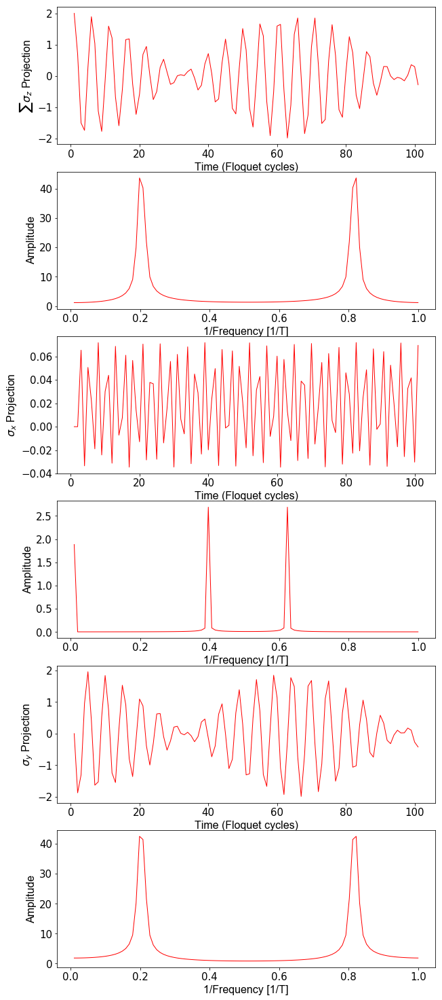

In [19]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(6,1,figsize=(10, 26))

p = axes[0].plot(times,observables, 'r', linewidth=1.0)
p = axes[1].plot(times/timess, np.abs(np.fft.fft(observables)), 'r', linewidth=1.0)
p = axes[2].plot(times,observablesX, 'r', linewidth=1.0)
p = axes[3].plot(times/timess, np.abs(np.fft.fft(observablesX)), 'r', linewidth=1.0)
p = axes[4].plot(times,observablesY, 'r', linewidth=1.0)
p = axes[5].plot(times/timess, np.abs(np.fft.fft(observablesY)), 'r', linewidth=1.0)

#axes[0].axis('tight')
axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[0].set_ylabel(r'$\sum\sigma_z$ Projection', fontsize=16, **hfont)

axes[1].set_xlabel(r'1/Frequency [1/T]', fontsize=16, **hfont)
axes[1].set_ylabel(r'Amplitude', fontsize=16, **hfont)
#axes[1].set_title(r'FFT for the Time Crystal', fontsize=16, **hfont);

#axes[1].set_ylim((0, 500))
#axes[1].set_xlim((0.4, 0.6))

axes[2].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[2].set_ylabel(r'$\sigma_x$ Projection', fontsize=16, **hfont)
axes[3].set_xlabel(r'1/Frequency [1/T]', fontsize=16, **hfont)
axes[3].set_ylabel(r'Amplitude', fontsize=16, **hfont)

axes[4].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[4].set_ylabel(r'$\sigma_y$ Projection', fontsize=16, **hfont)
axes[5].set_xlabel(r'1/Frequency [1/T]', fontsize=16, **hfont)
axes[5].set_ylabel(r'Amplitude', fontsize=16, **hfont)


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(15,5)
#plt.savefig("C:/neon/Simulated TC.pdf", bbox_inches="tight")

In [149]:
nSites = 3

eps=0.6                 #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                   #disorder
delta = deltaF(w, nSites)
g = 0.5                  #Interaction
T = 1                     # Period

timess=101
times = np.linspace(1, timess, timess)

In [152]:
U=Ufunc_all_to_all(nSites,alpha, g, T, delta)

evals, evecs = la.eig(U)
Fl_eig = chop(real(-1j*log(evals)))
Fl_vec = evecs

print(Fl_eig)
#print(matrix_chop(Fl_vec))

U=Ufunc_all_to_all(nSites,alpha,g, T, [0,0.25,0.5])

evals, evecs = la.eig(U)
Fl_eig = chop(real(-1j*log(evals)))
Fl_vec = evecs
print(Fl_eig)
#print(matrix_chop(Fl_vec))

[-1.402, 0.228, 2.113, 1.344, 1.971, 0.029, 1.971, 0.029]
[-1.447, 0.281, -0.134, 0, 1.344, 2.159, 2.003, 2.079]


In [144]:
disorder = arange(0.0, 7.0, 0.01)

eigenvalue1 = []
eigenvalue2 = []
eigenvalue3 = []
eigenvalue4 = []
eigenvalue5 = []
eigenvalue6 = []
eigenvalue7 = []
eigenvalue8 = []
for i in disorder:
    U=Ufunc_all_to_all_Ising(nSites,alpha,g, T, [0,i/2,i])
    evals, evecs = la.eig(U)
    eigenvalue1.append(evals[0]) 
    eigenvalue2.append(evals[1]) 
    eigenvalue3.append(evals[2]) 
    eigenvalue4.append(evals[3]) 
    eigenvalue5.append(evals[4]) 
    eigenvalue6.append(evals[5]) 
    eigenvalue7.append(evals[6]) 
    eigenvalue8.append(evals[7]) 

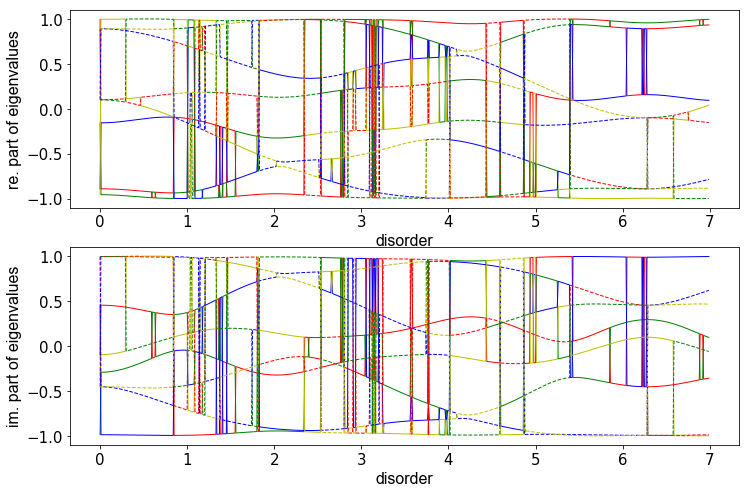

In [148]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(2,1,figsize=(12, 8))

p = axes[0].plot(disorder, real(eigenvalue1), 'r', linewidth=1.0)
p = axes[0].plot(disorder, real(eigenvalue2), 'g', linewidth=1.0)
p = axes[0].plot(disorder, real(eigenvalue3), 'b', linewidth=1.0)
p = axes[0].plot(disorder, real(eigenvalue4), 'y', linewidth=1.0)

p = axes[0].plot(disorder, real(eigenvalue5), 'r--', linewidth=1.0)
p = axes[0].plot(disorder, real(eigenvalue6), 'g--', linewidth=1.0)
p = axes[0].plot(disorder, real(eigenvalue7), 'b--', linewidth=1.0)
p = axes[0].plot(disorder, real(eigenvalue8), 'y--', linewidth=1.0)

axes[0].set_xlabel(r'disorder', fontsize=16, **hfont)
axes[0].set_ylabel(r're. part of eigenvalues', fontsize=16, **hfont)

p = axes[1].plot(disorder, imag(eigenvalue1), 'r', linewidth=1.0)
p = axes[1].plot(disorder, imag(eigenvalue2), 'g', linewidth=1.0)
p = axes[1].plot(disorder, imag(eigenvalue3), 'b', linewidth=1.0)
p = axes[1].plot(disorder, imag(eigenvalue4), 'y', linewidth=1.0)

p = axes[1].plot(disorder, imag(eigenvalue5), 'r--', linewidth=1.0)
p = axes[1].plot(disorder, imag(eigenvalue6), 'g--', linewidth=1.0)
p = axes[1].plot(disorder, imag(eigenvalue7), 'b--', linewidth=1.0)
p = axes[1].plot(disorder, imag(eigenvalue8), 'y--', linewidth=1.0)

axes[1].set_xlabel(r'disorder', fontsize=16, **hfont)
axes[1].set_ylabel(r'im. part of eigenvalues', fontsize=16, **hfont)

In [222]:
eps_steps = 500
eps=np.linspace(0.00, 0.5, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps

eigenvalue = []

for i in alpha:
    U=Ufunc_all_to_all_Ising(nSites,i, g, T, [0,0,0])
    evals, evecs = la.eig(U)
    eigenvalue.append(sort(chop(real(-1j*log(evals)))))

In [223]:
eigenvaluess = np.zeros((2**nSites,eps_steps), dtype=np.float)
for i in arange(0,2**nSites):
    for j in arange(0,eps_steps):
        eigenvaluess[int(i)][int(j)] = eigenvalue[int(j)][int(i)]

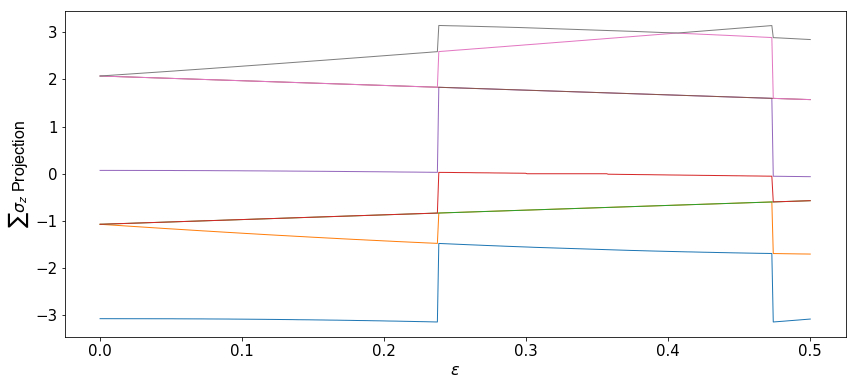

In [224]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(14, 6))

for i in arange(0,2**nSites):
    p = axes.plot(eps,eigenvaluess[int(i)], linewidth=1.0)


#axes[0].axis('tight')
axes.set_xlabel(r'$\epsilon$', fontsize=16, **hfont)
axes.set_ylabel(r'$\sum\sigma_z$ Projection', fontsize=16, **hfont)

#axes[1].set_title(r'FFT for the Time Crystal', fontsize=16, **hfont);

#axes[1].set_ylim((0, 500))


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(15,5)
#plt.savefig("C:/neon/Simulated TC.pdf", bbox_inches="tight")

# Bloch sphere visualization

In [12]:
nSites = 2

eps=0.02                   #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                   #disorder
delta = deltaF(w, nSites)
g = 0.05                #Interaction
T = 1                     # Period
time_steps = 50
times = np.linspace(1, time_steps, time_steps)

In [13]:
#U=UfuncZZ(nSites,alpha,g, T, delta)
U=Ufunc(nSites,alpha,g, T, delta)


#phiInitFull = np.full((2**nSites), 0)
#phiInitFull[0] = 1                             ##initial state
#phiInitFull[3] = 1

phiInitFull = np.full((2**nSites), 0, dtype = complex)
phiInitFull[0] = 1-1j
phiInitFull[3] = -1-1j
phiInitFull = phiInitFull/2

#phiInitFull = Initually_tmp

Final = states(phiInitFull,time_steps)                ## Evolution of states

f = IntProgress(min=0, max=time_steps) # instantiate the bar
display(f) # display the bar

sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
    sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
observables = []
observables_x = []
observables_y = []
for i in Final:
    observables_x.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real/nSites)
    observables_y.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real/nSites)
    observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real/nSites)
    f.value += 1

In [14]:
phiInitFull

array([ 0.5-0.5j,  0. +0.j ,  0. +0.j , -0.5-0.5j])

In [15]:
qubit_number = 1
b = Bloch()
#b.vector_color = ['b']
#b.view = [-40,30]
b.clear()
vec = ([observables_x[0], observables_y[0], observables[0]],[observables_x[1], observables_y[1], observables[1]])
b.add_vectors(vec)

for i in Final:
    b.add_points([observables_x,observables_y,observables],'m')

C:\Anaconda3\lib\site-packages\qutip\bloch.py:570: RuntimeWarning: divide by zero encountered in true_divide
  if any(abs(dist - dist[0]) / dist[0] > 1e-12):
C:\Anaconda3\lib\site-packages\qutip\bloch.py:570: RuntimeWarning: invalid value encountered in true_divide
  if any(abs(dist - dist[0]) / dist[0] > 1e-12):
C:\Anaconda3\lib\site-packages\qutip\bloch.py:570: RuntimeWarning: invalid value encountered in greater
  if any(abs(dist - dist[0]) / dist[0] > 1e-12):


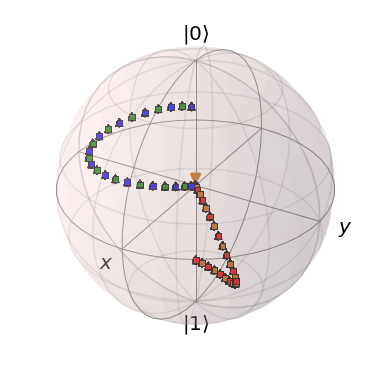

In [16]:
b.show()

# Variable Parameters  - eps

In [81]:
phiInitFull = np.full((2**nSites), 0, dtype = complex)
phiInitFull[0] = 1-1j
phiInitFull[3] = -1-1j
phiInitFull = phiInitFull/2

In [82]:
phiInitFull = np.full((2**nSites), 0, dtype = complex)  #triplet
phiInitFull[1] = 0.5
phiInitFull[2] = 0.5

In [83]:
phiInitFull = np.full((2**nSites), 0, dtype = complex)  #singlet
phiInitFull[1] = 0.5
phiInitFull[2] = -0.5

In [84]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.00                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [85]:
phiInitFull = np.full((2**nSites), 0, dtype = complex)
phiInitFull[0] = 1


In [86]:
Observables0 = np.zeros((eps_steps,time_steps), dtype=np.float)
Vectorrs0 = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    #U=Ufunc(nSites,alpha_value,g,T,delta)
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    #U=Ufunc_all_to_all_Ising(nSites,alpha_value,g,T,delta)
    #U=UfuncZZ(nSites,alpha_value,g,T,delta)
    #U=UfuncXX(nSites,alpha_value,g,T,delta)
    
    #phiInitFull = np.full((2**nSites), 0)
    #phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    observables = []
    vectorrs = []
      
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        vectorrs.append(Partial_Entropy(i))
    f.value += 1
    Observables0[alpha_id] = observables 
    Vectorrs0[alpha_id] = vectorrs

In [87]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [88]:
Observables1 = np.zeros((eps_steps,time_steps), dtype=np.float)
Vectorrs1 = np.zeros((eps_steps,time_steps), dtype=np.float)
f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    #U=Ufunc(nSites,alpha_value,g,T,delta)
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    #U=Ufunc_all_to_all_Ising(nSites,alpha_value,g,T,delta)
    #U=UfuncZZ(nSites,alpha_value,g,T,delta)
    #U=UfuncXX(nSites,alpha_value,g,T,delta)
    
    #phiInitFull = np.full((2**nSites), 0)
    #phiInitFull[0] = 1                             ##initial state

    
    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    observables = []
    vectorrs = []
      
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        vectorrs.append(Partial_Entropy(i))
    f.value += 1
    Observables1[alpha_id] = observables 
    Vectorrs1[alpha_id] = vectorrs

In [89]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                        #disorder
delta = deltaF(w, nSites)
g = 0.3                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [90]:
Observables2 = np.zeros((eps_steps,time_steps), dtype=np.float)
Vectorrs2 = np.zeros((eps_steps,time_steps), dtype=np.float)
f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    #U=Ufunc(nSites,alpha_value,g,T,delta)
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    #U=Ufunc_all_to_all_Ising(nSites,alpha_value,g,T,delta)
    #U=UfuncZZ(nSites,alpha_value,g,T,delta)
    #U=UfuncXX(nSites,alpha_value,g,T,delta)
    
    #phiInitFull = np.full((2**nSites), 0)
    #phiInitFull[0] = 1                             ##initial state
    

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    observables = []
    vectorrs = []  
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        vectorrs.append(Partial_Entropy(i))
    f.value += 1
    Observables2[alpha_id] = observables 
    Vectorrs2[alpha_id] = vectorrs


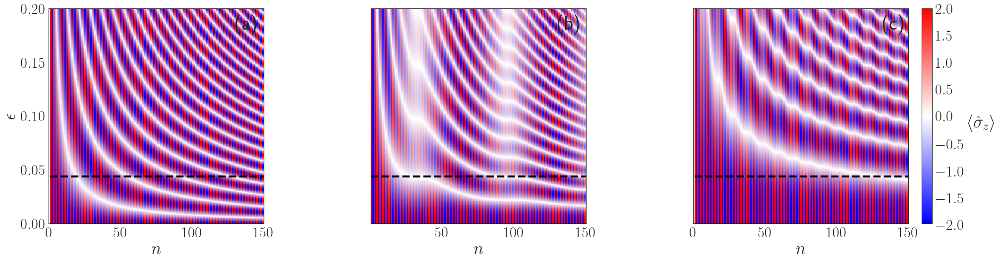

In [101]:
hfont = {'fontname':'Tahoma'}
fig, axes = plt.subplots(1,3,figsize=(33, 8))

plt.rcParams["text.usetex"] =True


p = axes[0].pcolor(times, eps, Observables0, cmap=cm.bwr)

axes[0].axis('tight')
axes[0].set_xlabel(r'$n$', fontsize=35, **hfont)
axes[0].set_ylabel(r'$\epsilon$', fontsize=35, **hfont)


axes[0].tick_params(axis='x', labelsize=30)
axes[0].tick_params(axis='y', labelsize=30)

cb = fig.colorbar(p, ax=axes[0])
#cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

cb.remove()

ymin, ymax = axes[0].get_ylim()
axes[0].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

xmin, xmax = axes[0].get_xlim()
axes[0].set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))

#---------------------------------------------------------------------------

p = axes[1].pcolor(times, eps, Observables1, cmap=cm.bwr)

axes[1].tick_params(axis='x', labelsize=30)
axes[1].tick_params(axis='y', labelsize=30)

axes[1].set_yticklabels([])

axes[1].set_xlabel(r'$n$', fontsize=35, **hfont)
#axes[1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1])
#cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18)

cb.remove()

ymin, ymax = axes[1].get_ylim()
axes[1].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

xmin, xmax = axes[1].get_xlim()
axes[1].set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))

#---------------------------------------------------------------------------
p = axes[2].pcolor(times, eps, Observables2, cmap=cm.bwr)

axes[2].axis('tight')
axes[2].set_xlabel(r'$n$', fontsize=35, **hfont)
#axes[2].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[2].tick_params(axis='x', labelsize=30)
axes[2].tick_params(axis='y', labelsize=30)

axes[2].set_yticklabels([])


cb = fig.colorbar(p, ax=axes[2])
cb.set_label(r'$\langle \hat{\sigma}_z \rangle$', labelpad=35, rotation=0, fontsize=35, **hfont)
cb.ax.tick_params(labelsize=30)

ymin, ymax = axes[2].get_ylim()
axes[2].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

xmin, xmax = axes[2].get_xlim()
axes[2].set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))

#---------------------------------------------------------------------------

axes[0].plot(times,  times-times+0.0436, 'k--', linewidth=4.0)
axes[1].plot(times,  times-times+0.0436, 'k--', linewidth=4.0)
axes[2].plot(times,  times-times+0.0436, 'k--', linewidth=4.0)


matplotlib.pyplot.text(-320, 0.185, '(a)', fontsize=40, weight="black",  verticalalignment='center')
matplotlib.pyplot.text( -95, 0.185, '(b)', fontsize=40, weight="black",  verticalalignment='center')
matplotlib.pyplot.text( 132, 0.185, '(c)', fontsize=40, weight="black",  verticalalignment='center')

plt.gcf().set_size_inches(33,8)
plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/TM_Pic1abc.pdf", bbox_inches="tight")

In [116]:
109/500*0.2

0.0436

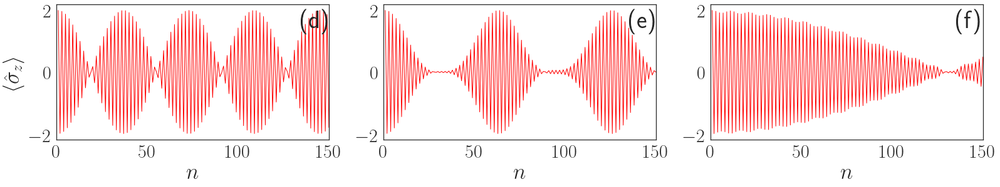

In [104]:
number =   109     #244

hfont = {'fontname':'Tahoma'}
fig, axes = plt.subplots(1,3,figsize=(26.5, 4))

plt.rcParams["text.usetex"] =True

p = axes[0].plot(times, Observables0[number], 'r', linewidth=1.0)

axes[0].set_xlabel(r'$n$', fontsize=35, **hfont)
axes[0].set_ylabel(r'$\langle \hat{\sigma}_z \rangle$', fontsize=35, rotation=90, **hfont)

axes[0].tick_params(axis='x', labelsize=30)
axes[0].tick_params(axis='y', labelsize=30)


p = axes[1].plot(times, Observables1[number], 'r', linewidth=1.0)

axes[1].set_xlabel(r'$n$', fontsize=35, **hfont)
#axes[1].set_ylabel(r'$\sum\sigma_z$  Projection', fontsize=25, **hfont)

axes[1].tick_params(axis='x', labelsize=30)
axes[1].tick_params(axis='y', labelsize=30)

p = axes[2].plot(times, Observables2[number], 'r', linewidth=1.0)

axes[2].set_xlabel(r'$n$', fontsize=35, **hfont)
#axes[2].set_ylabel(r'$\sum\sigma_z$  Projection', fontsize=25, **hfont)

axes[2].tick_params(axis='x', labelsize=30)
axes[2].tick_params(axis='y', labelsize=30)

matplotlib.pyplot.text(-226, 1.65, '(d)', fontsize=40, weight="black",  verticalalignment='center')
matplotlib.pyplot.text( -45, 1.65, '(e)', fontsize=40, weight="black",  verticalalignment='center')
matplotlib.pyplot.text( 135, 1.65, '(f)', fontsize=40, weight="black",  verticalalignment='center')

axes[0].set_xticks(np.round(np.linspace(0, 150, 4), 2))
axes[0].set_xlim(0.0,150)
axes[1].set_xlim(0.0,150)
axes[2].set_xlim(0.0,150)

plt.gcf().set_size_inches(26.5, 4)
plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/TM_Pic1def.pdf", bbox_inches="tight")

#axes[1].set_xlim((0.475, 0.525))

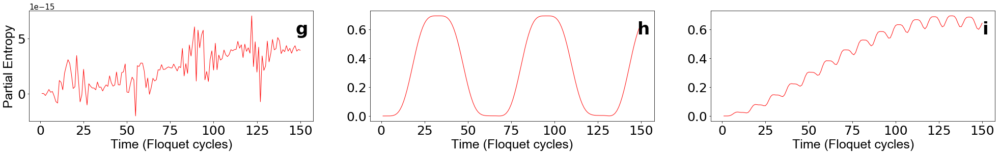

In [43]:
number =   109     #109

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,3,figsize=(34, 4))

p = axes[0].plot(times, Vectorrs0[number], 'r', linewidth=1.0)

axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=25, **hfont)
axes[0].set_ylabel(r'Partial Entropy', fontsize=25, **hfont)

axes[0].tick_params(axis='x', labelsize=25)
axes[0].tick_params(axis='y', labelsize=25)


p = axes[1].plot(times, Vectorrs1[number], 'r', linewidth=1.0)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=25, **hfont)
#axes[1].set_ylabel(r'$\sum\sigma_z$  Projection', fontsize=25, **hfont)

axes[1].tick_params(axis='x', labelsize=25)
axes[1].tick_params(axis='y', labelsize=25)

p = axes[2].plot(times, Vectorrs2[number], 'r', linewidth=1.0)

axes[2].set_xlabel(r'Time (Floquet cycles)', fontsize=25, **hfont)
#axes[2].set_ylabel(r'$\sum\sigma_z$  Projection', fontsize=25, **hfont)

axes[2].tick_params(axis='x', labelsize=25)
axes[2].tick_params(axis='y', labelsize=25)

matplotlib.pyplot.text(-246, 0.6, 'g', fontsize=34, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(-49, 0.6, 'h', fontsize=34, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(150, 0.6, 'i', fontsize=34, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(34, 4)
#plt.savefig("C:/neon/TM_Pic1_g-h-i.pdf", bbox_inches="tight")

#axes[1].set_xlim((0.475, 0.525))

# Entropy

In [105]:
phiInitFull = np.full((2**nSites), 0, dtype = complex)   #triplet
phiInitFull[1] = 0.5
phiInitFull[2] = 0.5

In [106]:
phiInitFull = np.full((2**nSites), 0, dtype = complex)   #singlet
phiInitFull[0] = 0.5
phiInitFull[3] = -0.5

In [107]:
phiInitFull = np.full((2**nSites), 0, dtype = complex)  
phiInitFull[0] = 1
phiInitFull[3] = 0

In [108]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                        #disorder
delta = deltaF(w, nSites)
g = 0.05                           #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [109]:
phiInitFull = np.full((2**nSites), 0, dtype = complex)  
phiInitFull[0] = 1
#phiInitFull[3] = 0
print (phiInitFull)

[1.+0.j 0.+0.j 0.+0.j 0.+0.j]


In [110]:
Observables = np.zeros((eps_steps,time_steps), dtype=np.float)
Vectorrs = np.zeros((eps_steps,time_steps), dtype=np.float)
#Vectorrrs = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar

for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    #phiInitFull = np.full((2**nSites), 0)
    #phiInitFull[0] = 1                             ##initial state
    
    #phiInitFull = np.full((2**nSites), 0, dtype = complex)
    #phiInitFull[0] = 1-1j
    #phiInitFull[3] = -1-1j
    #phiInitFull = phiInitFull/2

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    observables = []
    vectorrs = []
    #vectorrrs = []
      
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        vectorrs.append(Partial_Entropy(i))
        #vectorrrs.append(entropy(i))
    f.value += 1
    Observables[alpha_id] = observables 
    Vectorrs[alpha_id] = vectorrs
    #Vectorrrs[alpha_id] = vectorrrs

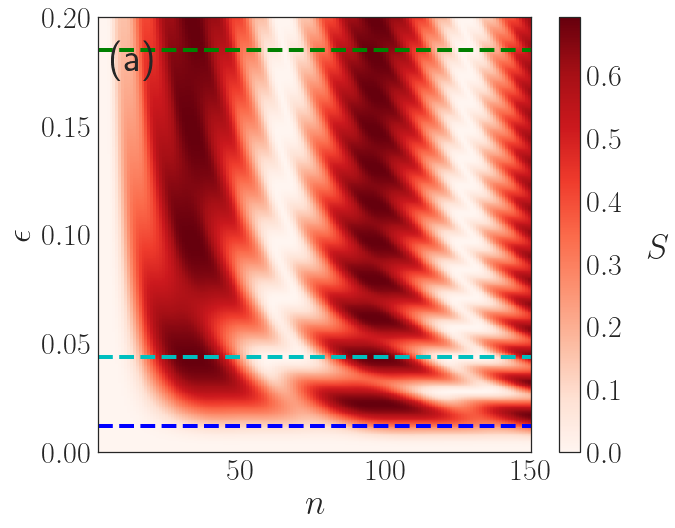

In [122]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

p = axes.pcolor(times, eps, Vectorrs, cmap=cm.Reds)

axes.tick_params(axis='x', labelsize=30)
axes.tick_params(axis='y', labelsize=30)

axes.set_xlabel(r'$n$', fontsize=35, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=35, **hfont)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'$S$', labelpad=35, rotation=0, fontsize=35, **hfont)
cb.ax.tick_params(labelsize=30)

#cb = fig.colorbar(p, ax=axes)
#cb.set_label(r'S', labelpad=35, rotation=270, fontsize=35, **hfont)
#cb.ax.tick_params(labelsize=30) 


ymin, ymax = axes.get_ylim()
axes.set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))

matplotlib.pyplot.text(5, 0.18, '(a)', fontsize=40, weight="black",  verticalalignment='center')

axes.plot(times,  times-times+0.012, 'b--', linewidth=4.0)
axes.plot(times,  times-times+0.0436, 'c--', linewidth=4.0)
axes.plot(times,  times-times+0.185, 'g--', linewidth=4.0)

plt.gcf().set_size_inches(9.7, 8)
plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/TM_Pic3_entropy.pdf", bbox_inches="tight")

In [49]:
0.2/500*109

0.0436

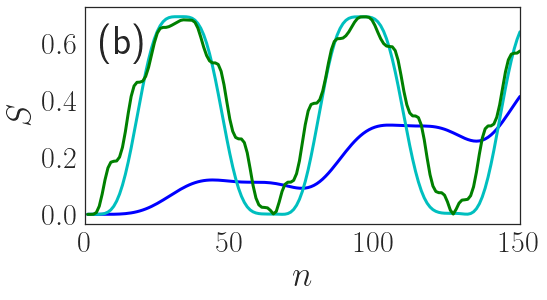

In [127]:
number =   109    #109

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(9.7, 4))

p = axes.plot(times, Vectorrs[30], 'b', linewidth=3.0)

p = axes.plot(times, Vectorrs[109], 'c', linewidth=3.0)

p = axes.plot(times, Vectorrs[450], 'g', linewidth=3.0)

axes.set_xlabel(r'$n$', fontsize=35, **hfont)
axes.set_ylabel(r'$S$', fontsize=35, **hfont)

axes.tick_params(axis='x', labelsize=30)
axes.tick_params(axis='y', labelsize=30)

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(0, 150, 4), 2))

axes.set_yticks(np.round(np.linspace(0, 0.6, 4), 2))
axes.set_xlim(0.0,150)


matplotlib.pyplot.text(5, 0.6, '(b)', fontsize=40, weight="black",  verticalalignment='center')

plt.gcf().set_size_inches(7.8,4)
plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/EntropyCuts.pdf", bbox_inches="tight")

In [ ]:
0.2/500*109

number =   109    #109

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(12, 4))

p = axes.plot(times, Vectorrs[30], 'b', linewidth=3.0)

p = axes.plot(times, Vectorrs[109], 'r', linewidth=3.0)

p = axes.plot(times, Vectorrs[450], 'g', linewidth=3.0)

axes.set_xlabel(r'stroboscopic time', fontsize=28, **hfont)
axes.set_ylabel(r'entanglement entropy', fontsize=28, **hfont)

axes.tick_params(axis='x', labelsize=28)
axes.tick_params(axis='y', labelsize=28)

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(0, 150, 7), 2))

#xmin, xmax = axes.get_xlim()
#axes.set_xticks(np.round(np.linspace(xmin, xmax, 8), 2))

#plt.gcf().set_size_inches(12,5)
#plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/EntropyCuts.pdf", bbox_inches="tight")

In [392]:
500*0.05/0.2

125.0

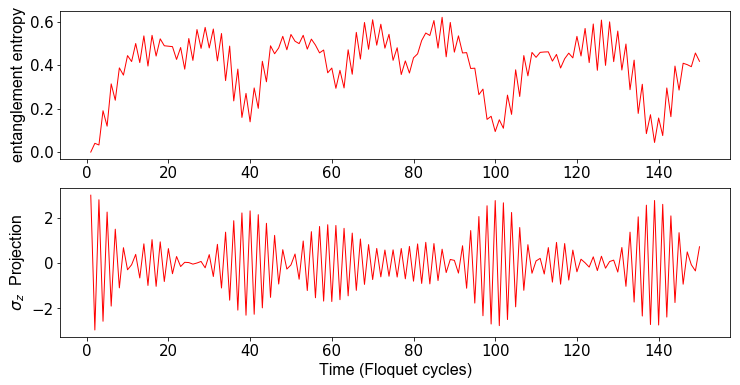

In [124]:
number =   230

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(2,1,figsize=(12, 6))

p = axes[1].plot(times, Observables[number], 'r', linewidth=1.0)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[1].set_ylabel(r'$\sigma_z$  Projection', fontsize=16, **hfont)

p = axes[0].plot(times, Vectorrs[number], 'r', linewidth=1.0)

#axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[0].set_ylabel(r'entanglement entropy', fontsize=16, **hfont)

number =   499


#p = axes.plot(times, Observables[number], 'r', linewidth=1.0)

#axes.set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
#axes.set_ylabel(r'$\sigma_z$  Projection', fontsize=16, **hfont)

#p = axes[1].plot(times, Vectorrs[number], 'r', linewidth=1.0)

#axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
#axes[1].set_ylabel(r'entanglement entropy', fontsize=16, **hfont)

#matplotlib.pyplot.text(0, 1.5, 'a', fontsize=30, weight="black",  verticalalignment='center')
#matplotlib.pyplot.text(0, 0.6, 'b', fontsize=30, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(12, 6)
#plt.savefig("C:/neon/TM_Pic3_entropy_entangled_cut.pdf", bbox_inches="tight")

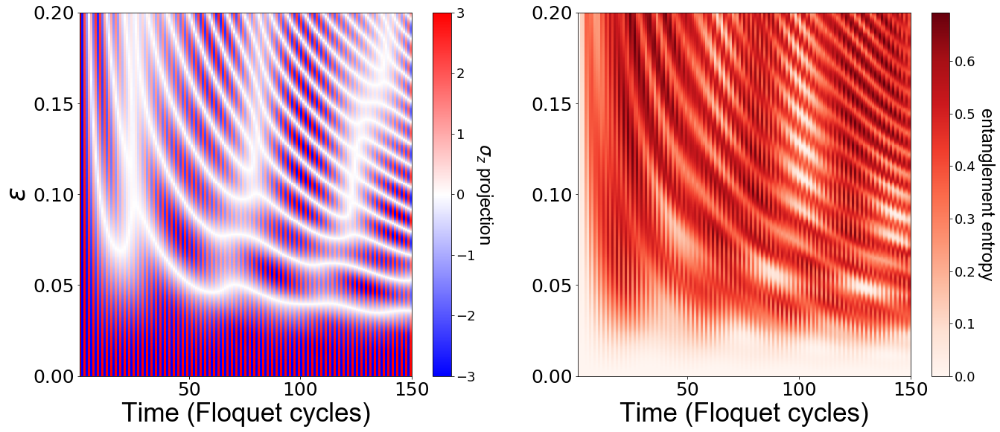

In [125]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,2,figsize=(22, 9))

p = axes[0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0].axis('tight')
axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=35, **hfont)
axes[0].set_ylabel(r'$\epsilon$', fontsize=35, **hfont)


axes[0].tick_params(axis='x', labelsize=25)
axes[0].tick_params(axis='y', labelsize=25)

cb = fig.colorbar(p, ax=axes[0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes[0].get_ylim()
axes[0].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

#---------------------------------------------------------------------------

p = axes[1].pcolor(times, eps, Vectorrs, cmap=cm.Reds)

axes[1].tick_params(axis='x', labelsize=25)
axes[1].tick_params(axis='y', labelsize=25)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=35, **hfont)
#axes[1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1])
cb.set_label(r'entanglement entropy', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes[1].get_ylim()
axes[1].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

#---------------------------------------------------------------------------


#matplotlib.pyplot.text(-85, 0.28, 'a', fontsize=34, weight="black",  verticalalignment='center')
#matplotlib.pyplot.text(138, 0.28, 'b', fontsize=34, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(22, 9)
#plt.savefig("C:/neon/TM_Pic.3_entropy_entangled.pdf", bbox_inches="tight")

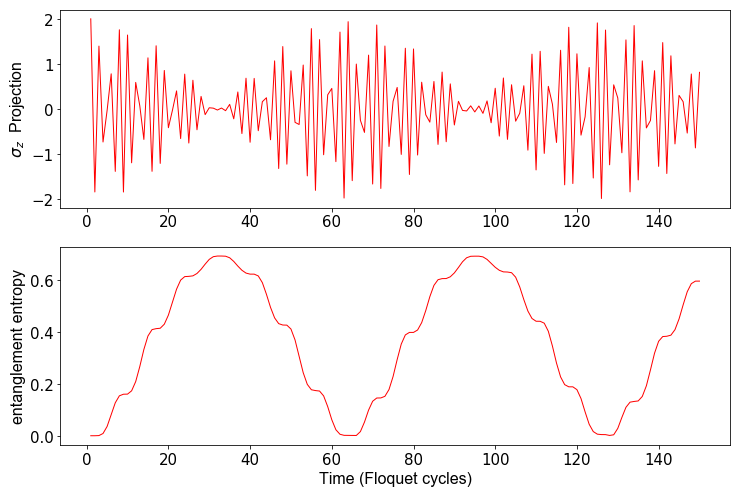

In [411]:
number =   499    #109

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(2,1,figsize=(12, 8))

p = axes[0].plot(times, Observables[number], 'r', linewidth=1.0)

#axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[0].set_ylabel(r'$\sigma_z$  Projection', fontsize=16, **hfont)

p = axes[1].plot(times, Vectorrs[number], 'r', linewidth=1.0)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[1].set_ylabel(r'entanglement entropy', fontsize=16, **hfont)

#matplotlib.pyplot.text(150, 1.55, 'a', fontsize=30, weight="black",  verticalalignment='center')
#matplotlib.pyplot.text(150, 0.6, 'b', fontsize=30, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(12, 8)
#plt.savefig("C:/neon/TM_Pic.3.3_entropy_entangled.pdf", bbox_inches="tight")

In [31]:
Whiteline = []
TIME = []
for i in np.linspace(0, time_steps-1, time_steps):
    for j in np.linspace(0, eps_steps-1, eps_steps):
        if sqrt(Observables[int(j)][int(i)]**2)<0.1:
            Whiteline.append(Vectorrs[int(j)][int(i)])
            TIME.append(i)
            break         

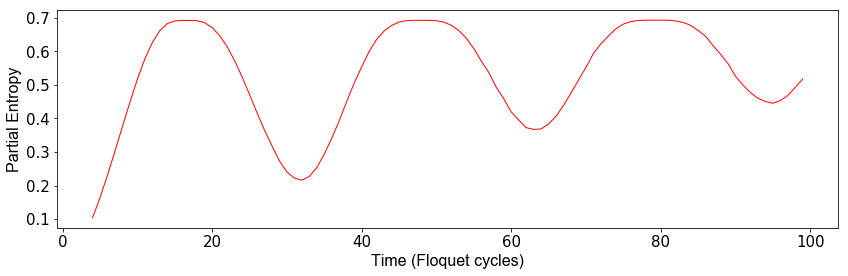

In [32]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(14, 4))

p = axes.plot(TIME, Whiteline, 'r', linewidth=1.0)

axes.set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes.set_ylabel(r'entanglement entropy', fontsize=16, **hfont)

#plt.gcf().set_size_inches(14, 4)
#plt.savefig("C:/neon/TM_Pic.3.Across_white_line.pdf", bbox_inches="tight")

# Floquet

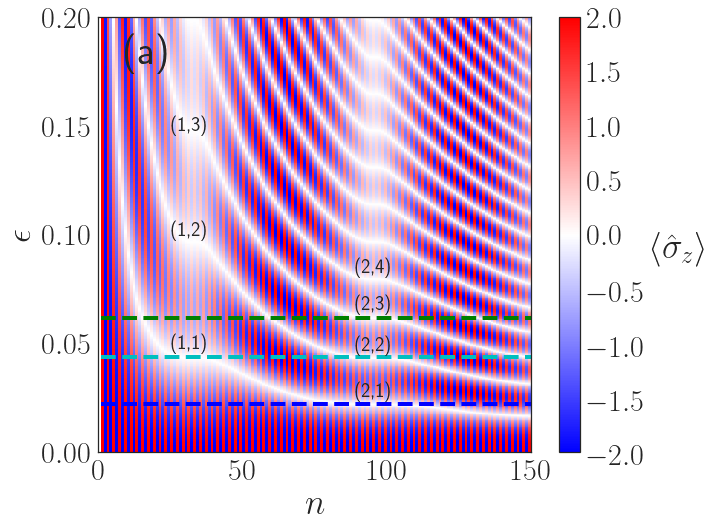

In [142]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(9.7, 8))

p = axes.pcolor(times, eps, Observables, cmap=cm.bwr)

axes.axis('tight')
axes.set_xlabel(r'$n$', fontsize=35, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=35, **hfont)


axes.tick_params(axis='x', labelsize=30)
axes.tick_params(axis='y', labelsize=30)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'$\langle \hat{\sigma}_z \rangle$', labelpad=35, rotation=0, fontsize=35, **hfont)
cb.ax.tick_params(labelsize=30) 

ymin, ymax = axes.get_ylim()
axes.set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))


matplotlib.pyplot.text(9, 0.183, '(a)', fontsize=40, weight="black",  verticalalignment='center')

matplotlib.pyplot.text(25, 0.05,  '(1,1)', fontsize=20, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(25, 0.102, '(1,2)', fontsize=20, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(25, 0.150, '(1,3)', fontsize=20, weight="black",  verticalalignment='center')

matplotlib.pyplot.text(89, 0.028, '(2,1)', fontsize=20, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(89, 0.049, '(2,2)', fontsize=20, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(89, 0.068, '(2,3)', fontsize=20, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(89, 0.085, '(2,4)', fontsize=20, weight="black",  verticalalignment='center')

axes.plot(times,  times-times+0.022, 'b--', linewidth=4.0)
axes.plot(times,  times-times+0.0436, 'c--', linewidth=4.0)
axes.plot(times,  times-times+0.0616, 'g--', linewidth=4.0)

plt.gcf().set_size_inches(9.7, 8)
plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/TM_Pic2_Floquet_points.pdf", bbox_inches="tight")

In [177]:
154/500*0.2

0.0616

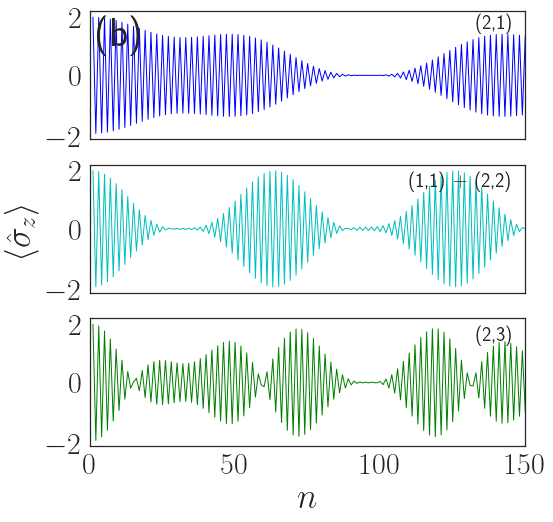

In [145]:
number1 =   55     #214
number2 =   109     #110
number3 =   154     #309

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,1,figsize=(9.7, 8))

p = axes[0].plot(times, Observables[number1], 'b', linewidth=1.0)
p = axes[1].plot(times, Observables[number2], 'c', linewidth=1.0)
p = axes[2].plot(times, Observables[number3], 'g', linewidth=1.0)

#axes[0].set_ylabel(r'$\langle \hat{\sigma}_z \rangle$ projection', fontsize=35, **hfont)
axes[1].set_ylabel(r'$\langle \hat{\sigma}_z \rangle$', fontsize=35, **hfont)
#axes[2].set_ylabel(r'$\langle \hat{\sigma}_z \rangle$ projection', fontsize=35, **hfont)
axes[2].set_xlabel(r'$n$', fontsize=35, **hfont)

axes[0].set_xticklabels([])
axes[1].set_xticklabels([])

xmin, xmax = axes[2].get_xlim()
axes[2].set_xticks(np.round(np.linspace(0, 150, 4), 2))

matplotlib.pyplot.text(110, 6.9, '(1,1) + (2,2)', fontsize=20, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(133, 12.3, '(2,1)', fontsize=20, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(133, 1.6, '(2,3)', fontsize=20, weight="black",  verticalalignment='center')

matplotlib.pyplot.text(2, 11.9, '(b)', fontsize=40, weight="black",  verticalalignment='center')

axes[0].tick_params(axis='x', labelsize=30)
axes[0].tick_params(axis='y', labelsize=30)
axes[1].tick_params(axis='x', labelsize=30)
axes[1].tick_params(axis='y', labelsize=30)
axes[2].tick_params(axis='x', labelsize=30)
axes[2].tick_params(axis='y', labelsize=30)

axes[0].set_xlim(0.0,150)
axes[1].set_xlim(0.0,150)
axes[2].set_xlim(0.0,150)


plt.gcf().set_size_inches(7.8,8)
plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/TM_Pic2_Floquet_points_cut.pdf", bbox_inches="tight")

# Variable Parameters  - eps Fourier

In [267]:
phiInitFull = np.full((2**nSites), 0, dtype = complex)
phiInitFull[1] = 0.5
phiInitFull[2] = -0.5

In [62]:
phiInitFull = np.full((2**nSites), 0, dtype = complex)
phiInitFull[0] = 1


In [64]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.3, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 200
times = np.linspace(1, time_steps, time_steps)

In [65]:
Observables = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

ObservablesX = np.zeros((eps_steps,time_steps), dtype=np.float)
ObservablesX_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

ObservablesY = np.zeros((eps_steps,time_steps), dtype=np.float)
ObservablesY_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    #U=Ufunc(nSites,alpha_value,g,T,delta)
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    evals, evecs = la.eig(U)
    Fl_eig = chop(real(-1j*log(evals)))
    Fl_vec = evecs
    
    #phiInitFull = Fl_vec[3]

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
    sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
        sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
       
    observablesX = []
    observablesY = []
    observables = []
      
    for i in Final:
        observablesX.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real)
        observablesY.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real)
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    ObservablesX_fft[alpha_id] = np.fft.fft(observablesX)
    ObservablesX[alpha_id] = observablesX
    ObservablesY_fft[alpha_id] = np.fft.fft(observablesY)
    ObservablesY[alpha_id] = observablesY

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:44: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:46: ComplexWarning: Casting complex values to real discards the imaginary part


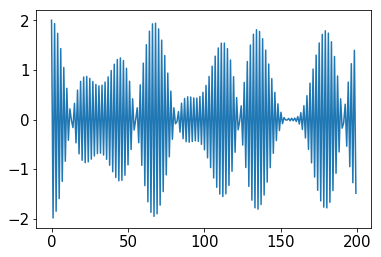

In [66]:
plot(Observables[109])

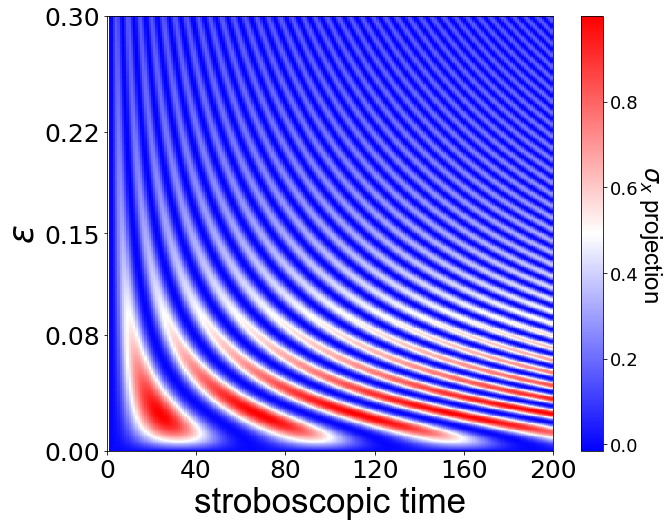

In [70]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

p = axes.pcolor(times, eps, ObservablesX, cmap=cm.bwr)

axes.axis('tight')
axes.set_xlabel(r'stroboscopic time', fontsize=35, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=35, **hfont)

axes.tick_params(axis='x', labelsize=25)
axes.tick_params(axis='y', labelsize=25)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes.get_ylim()
axes.set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(0, time_steps, 6), 2))

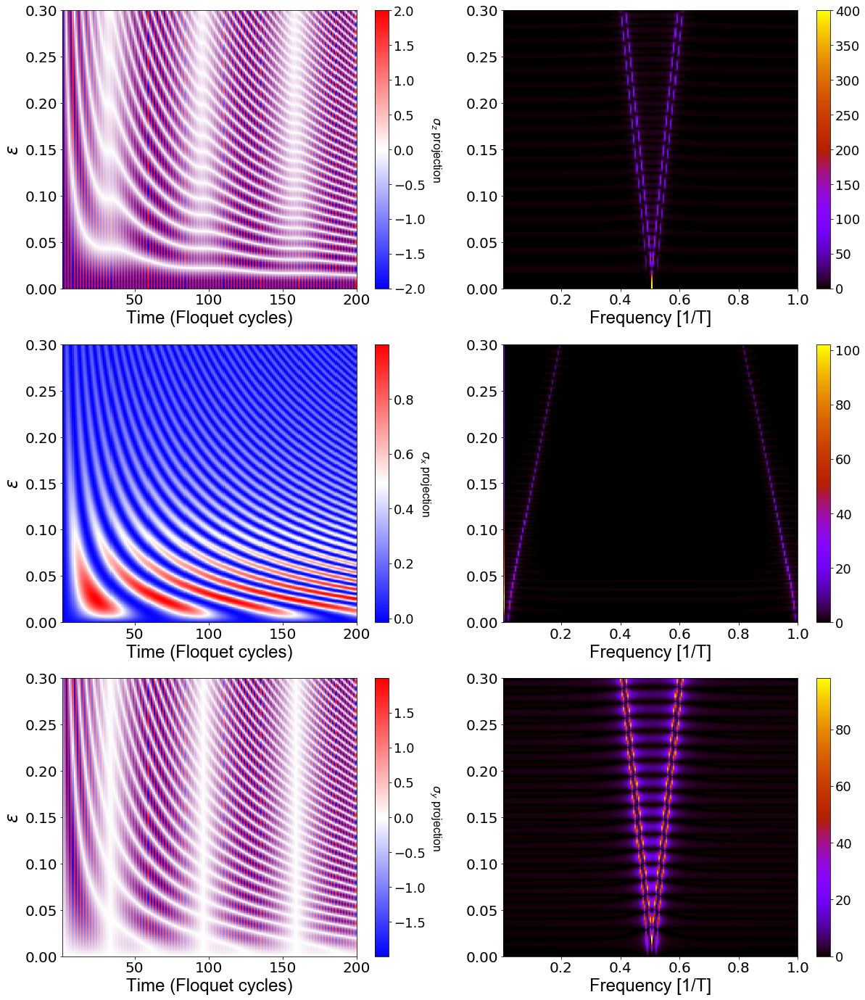

In [69]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/time_steps, eps, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, ObservablesX, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/time_steps, eps, np.abs(ObservablesX_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, eps, ObservablesY, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/time_steps, eps, np.abs(ObservablesY_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_2spins_g=0.1_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

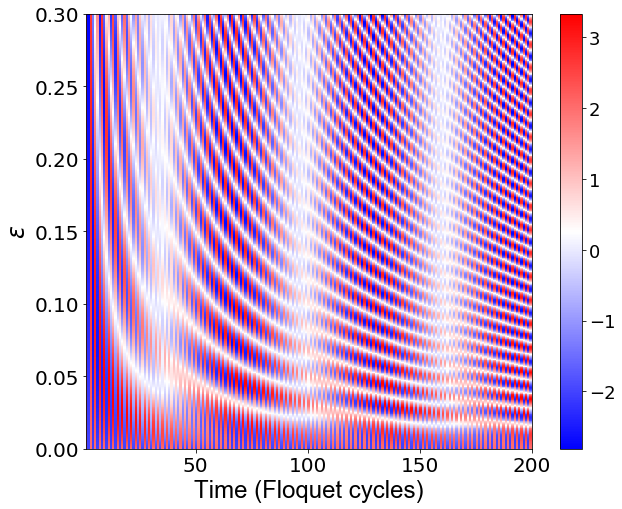

In [68]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

#p = axes.pcolor(times, eps, Observables+ObservablesX+ObservablesY, cmap=cm.bwr,  vmin=-0.1, vmax=0.1)
p = axes.pcolor(times, eps, Observables+ObservablesX+ObservablesY, cmap=cm.bwr)

axes.axis('tight')
axes.set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes.tick_params(axis='x', labelsize=20)
axes.tick_params(axis='y', labelsize=20)


cb = fig.colorbar(p, ax=axes)
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


# Variable Parameters  - g, coupling

In [725]:
nSites = 3

eps =  0.5                             #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                             #disorder
delta = deltaF(w, nSites)
g_steps = 1000
g = np.linspace(0.0, 2.5, g_steps)                     #Interaction
T = 1  
time_steps = 100
times = np.linspace(1, 100, time_steps)

In [726]:
Observables = np.zeros((g_steps,time_steps), dtype=np.float)
f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
for g_id, g_value in enumerate(g): 
    U=Ufunc(nSites,alpha,g_value,T,delta)
    #U=UfuncZZ(nSites,alpha,g_value,T,delta)
    #U=UfuncXX(nSites,alpha,g_value,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    observables = []
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(g_id)
    f.value += 1
    Observables[g_id] = observables

Widget Javascript not detected.  It may not be installed or enabled properly.


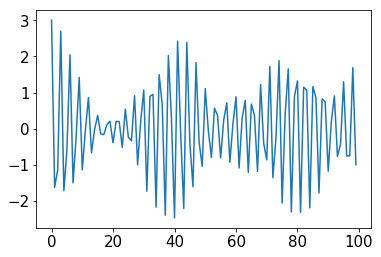

In [727]:
plot(Observables[50])

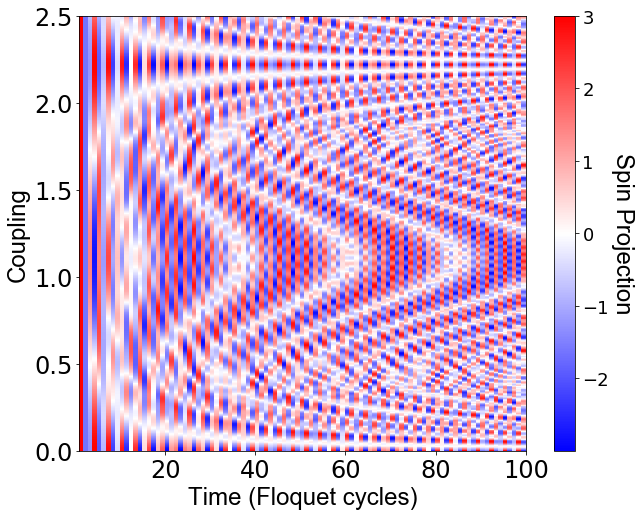

In [728]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

p = axes.pcolor(times, g, Observables, cmap=cm.bwr)
#p = axes[1].plot(times/time_steps, np.abs(np.fft.fft(observables)), 'r', linewidth=1.0)

axes.axis('tight')
axes.set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes.set_ylabel(r'Coupling', fontsize=24, **hfont)


axes.tick_params(axis='x', labelsize=24)
axes.tick_params(axis='y', labelsize=24)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'Spin Projection', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#axes[1].set_xlabel(r'1/Frequency [1/T]', fontsize=16, **hfont)
#axes[1].set_ylabel(r'Amplitude', fontsize=16, **hfont)
#axes[1].set_title(r'FFT for the Time Crystal', fontsize=16, **hfont);

#axes[1].set_ylim((0, 500))
#axes[1].set_xlim((0.4, 0.6))


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(10,8)
#plt.savefig("C:/neon/Simulated TC_3D_6spins_e-1.0_g-variable.pdf", bbox_inches="tight")

# Variable Parameters  - disorder

In [356]:
nSites = 2


eps= 1.0       #unperfection of pulses
alpha = np.pi/2-eps
w_steps = 500
w = np.linspace(0.0, 0.2, w_steps)                              #disorder
delta = deltaF3D(w, nSites)
g = np.pi/2                            #Interaction
T = 1  
time_steps = 200
times = np.linspace(1, 200, time_steps)

In [357]:
Observables_fft = np.zeros((w_steps,time_steps), dtype=np.float)
Observables = np.zeros((w_steps,time_steps), dtype=np.float)
f = IntProgress(min=0, max=w_steps) # instantiate the bar
display(f) # display the bar
for delta_id, delta_value in enumerate(delta): 
    U=Ufunc(nSites,alpha,g,T, delta_value)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    
    observables = []
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(delta_id)
    f.value += 1
    Observables_fft[delta_id] = np.fft.fft(observables)
    Observables[delta_id] = observables

Widget Javascript not detected.  It may not be installed or enabled properly.


C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: ComplexWarning: Casting complex values to real discards the imaginary part


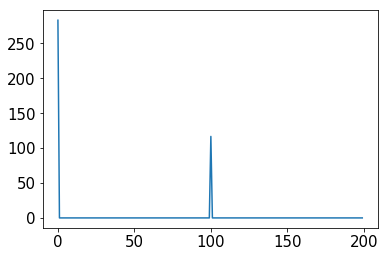

In [358]:
plot(Observables_fft[0])

(0.3, 0.7)

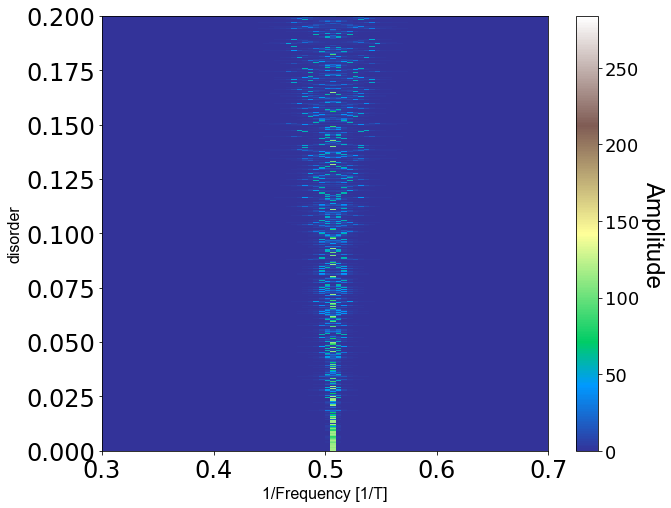

In [359]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

#p = axes.pcolor(times, eps, Observables, cmap=cm.RdBu)
#p = axes[1].plot(times/time_steps, np.abs(np.fft.fft(observables)), 'r', linewidth=1.0)

#axes.axis('tight')
#axes.set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
#axes.set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes.tick_params(axis='x', labelsize=24)
axes.tick_params(axis='y', labelsize=24)

p = axes.pcolor(times/200, w, np.abs(Observables_fft), cmap=cm.terrain)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

axes.set_xlabel(r'1/Frequency [1/T]', fontsize=16, **hfont)
axes.set_ylabel(r'disorder', fontsize=16, **hfont)

axes.set_xlim((0.3, 0.7))
#axes[1].set_xlim((0.4, 0.6))


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(10,8)
#plt.savefig("C:/neon/Simulated TC_3D_Fouriet_disorder_eps=0.1_2spins_flag_w.pdf", bbox_inches="tight")

# Variable Parameters  - epsilons for 2 spins

In [60]:
nSites = 2


eps_steps = 500
eps=np.linspace(0.00, 0.30, eps_steps)        #unperfection of pulses
alpha = []
noise = []
for i in np.linspace(1, nSites, nSites):
    noise.append(random.random())
for i in eps:
    alpha.append([np.pi/2-i*noise[0], np.pi/2-i*noise[1]])
    #alpha.append([np.pi/2-i*noise[0], np.pi/2-i*noise[1], np.pi/2-i*noise[2], np.pi/2-i*noise[3], np.pi/2-i*noise[4]])
#alpha = [np.pi/2-eps, np.pi/2+eps]
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.05                                  #Interaction
T = 1  
time_steps = 200
times = np.linspace(1, time_steps, time_steps)

In [61]:
Observables = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

ObservablesX = np.zeros((eps_steps,time_steps), dtype=np.float)
ObservablesX_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

ObservablesY = np.zeros((eps_steps,time_steps), dtype=np.float)
ObservablesY_fft = np.zeros((eps_steps,time_steps), dtype=np.float)


f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc_alpha(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states
    
    sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
    sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
        sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
        
    observablesX = []
    observablesY = []   
    observables = []
      
    for i in Final:
        observablesX.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real)
        observablesY.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real)
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    ObservablesX_fft[alpha_id] = np.fft.fft(observablesX)
    ObservablesX[alpha_id] = observablesX
    ObservablesY_fft[alpha_id] = np.fft.fft(observablesY)
    ObservablesY[alpha_id] = observablesY

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:43: ComplexWarning: Casting complex values to real discards the imaginary part


In [54]:
print(noise)

[0.3386270537085865, 0.31408958633279416]


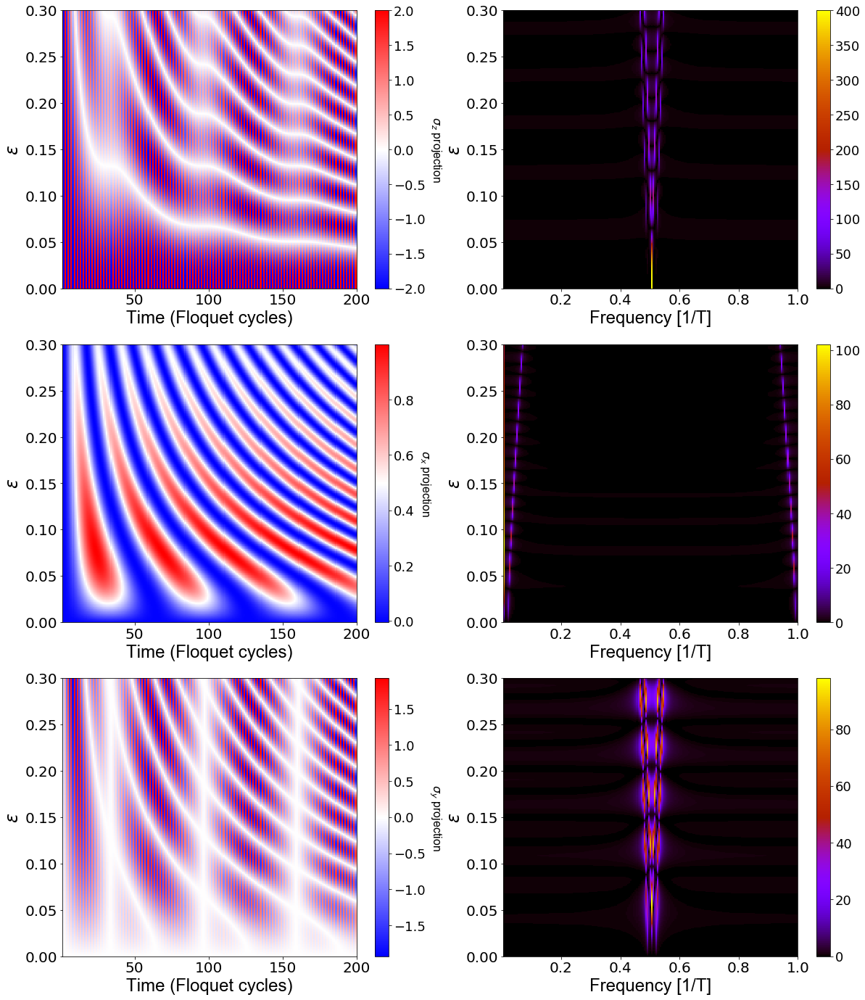

In [55]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/time_steps, eps, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, ObservablesX, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/time_steps, eps, np.abs(ObservablesX_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, eps, ObservablesY, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/time_steps, eps, np.abs(ObservablesY_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[2,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

# Bloch sphere visualization without last pi-pulse with last cycle XY Gate evolution

In [894]:
nSites = 2

eps=0.3   #unperfection of pulses
#alpha = np.pi/2-eps
alpha = [np.pi/2-eps, np.pi/2-eps]
w = 0.0                   #disorder
delta = deltaF(w, nSites)
g = np.pi/2                 #Interaction
T = 1                     # Period
time_steps = 51
times = np.linspace(1, time_steps, time_steps)

In [888]:
Initually_tmp = Final[15]

In [889]:
Initually_tmp

array([ 0.45131284-0.39048156j,  0.26714281-0.15423497j,
        0.26714281-0.15423497j, -0.54868716-0.39048156j])

In [898]:
#U=Ufunc(nSites,alpha,g, T, delta)
#U=UfuncZZ(nSites,alpha,g, T, delta)
#U=UfuncXX(nSites,alpha,g, T, delta)
U=Ufunc_alpha(nSites,alpha,g, T, delta)
phiInitFull = np.full((2**nSites), 0)
phiInitFull[0] = 1                             ##initial state
#phiInitFull[3] = 1/np.sqrt(2)

#phiInitFull = Initually_tmp

N=100

#Final = states_crop(phiInitFull,time_steps,N)                ## Evolution of states
Final = states_crop(phiInitFull,time_steps,N)                ## Evolution of states

f = IntProgress(min=0, max=time_steps) # instantiate the bar
display(f) # display the bar

sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
    sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
observables = []
observables_x = []
observables_y = []
for i in Final:
    observables_x.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real/nSites)
    observables_y.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real/nSites)
    observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real/nSites)
    f.value += 1

Widget Javascript not detected.  It may not be installed or enabled properly.


In [899]:
qubit_number = 1
b = Bloch()
#b.vector_color = ['b']
#b.view = [-40,30]
b.clear()
y=-np.sin(eps*2)
z=-np.cos(eps*2)
vec = ([observables_x[0], observables_y[0], observables[0]],[observables_x[1], observables_y[1], observables[1]],
       [observables_x[-1], observables_y[-1], observables[-1]])
b.add_vectors(vec)

for i in Final:
    b.add_points([observables_x,observables_y,observables],'m')

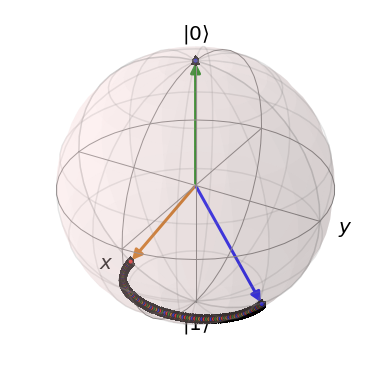

In [900]:
b.show()

# Cutting my dencity matrix

In [214]:
nSites = 2

eps_steps = 100
eps=np.linspace(0.00, 0.15, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                      #disorder
delta = deltaF(w, nSites)
g = 0.1                                #Interaction
T = 1  
time_steps = 100
times = np.linspace(1, time_steps, time_steps)

In [230]:
projection = 2

Observables = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

Observables1 = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables1_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

Observables2 = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables2_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc(nSites,alpha_value,g,T,delta)
    #U=UfuncZZ(nSites,alpha_value,g,T,delta)
    #U=UfuncXX(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, projection)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, projection)
       
    observables1 = []
    observables2 = []
    observables = []
      
    for i in Final:
        observables1.append(np.dot(np.dot(np.conjugate(i).T,tensorize1SiteMatrixKroneker(nSites, 1, projection)),i).real)
        observables2.append(np.dot(np.dot(np.conjugate(i).T,tensorize1SiteMatrixKroneker(nSites, 2, projection)),i).real)
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    Observables1_fft[alpha_id] = np.fft.fft(observables1)
    Observables1[alpha_id] = observables1
    Observables2_fft[alpha_id] = np.fft.fft(observables2)
    Observables2[alpha_id] = observables2

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:38: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:40: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: ComplexWarning: Casting complex values to real discards the imaginary part


In [231]:
plot(Observables[int(1000/0.15*0.0625)])

IndexError: index 416 is out of bounds for axis 0 with size 100

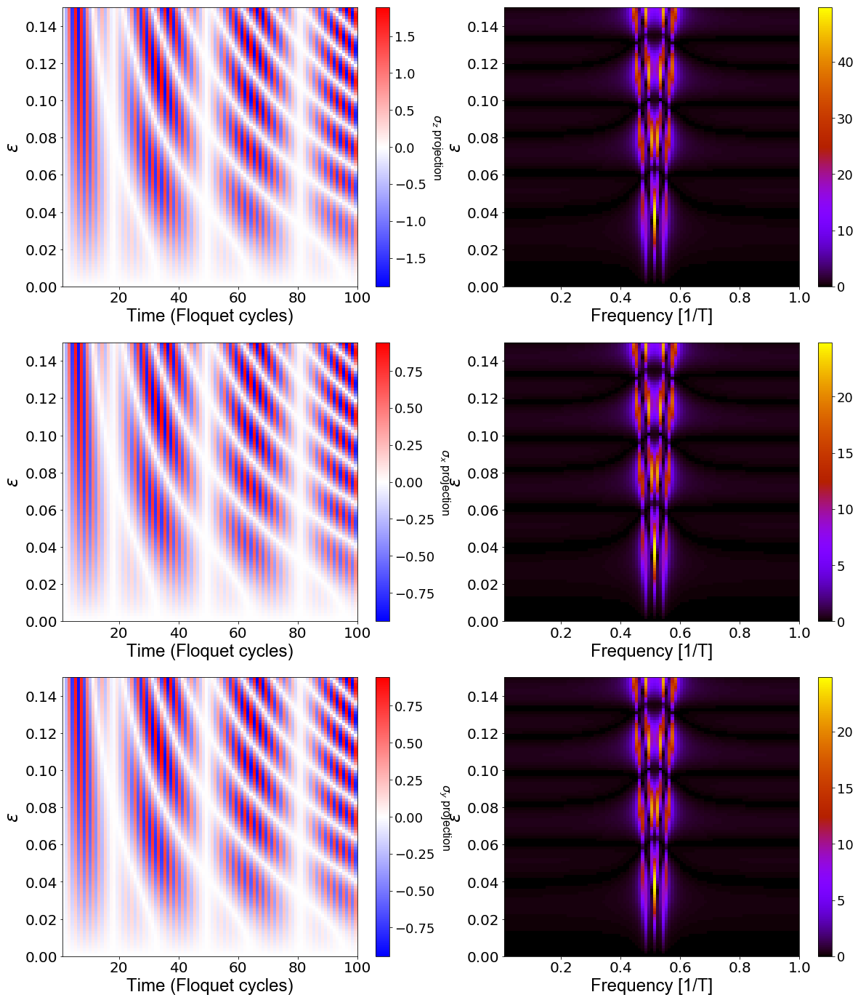

In [232]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/100, eps, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, Observables1, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/100, eps, np.abs(Observables1_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, eps, Observables2, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/100, eps, np.abs(Observables2_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[2,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

# Localization in time Zimuliren

In [43]:
nSites = 2


eps_steps = 100
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.05                                #Interaction
T = 1  
T_d = 3.0
time_steps = 100


nDeffects = 10
deffects = np.linspace(1,nDeffects,nDeffects)
grand_period = int(time_steps/nDeffects)

times = np.linspace(1, time_steps+nDeffects, time_steps+nDeffects)

In [40]:
Observables = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)
Observables_fft = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)

ObservablesX = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)
ObservablesX_fft = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)

ObservablesY = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)
ObservablesY_fft = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar


sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)                              #projection matrixes
sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)

for i in range(2, nSites+1,1):
    sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
    sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
         
for alpha_id, alpha_value in enumerate(alpha): 
    
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    observablesX = []
    observablesY = []
    observables = []
    
    Final = states(phiInitFull,1)                ## first step of evolution
    for j in deffects:
        U=Ufunc(nSites,alpha_value,g,T,delta)
        Final = states(Final[-1],grand_period)                ## Evolution of states between two deffects
      
        for i in Final:
            observablesX.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real)
            observablesY.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real)
            observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)

        U=Ufunc(nSites,alpha_value,g,T_d,delta)
        Final = states(Final[-1],2)
        observablesX.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigXOp),i).real)
        observablesY.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigYOp),i).real)
        observables.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigZOp),i).real)
    
    f.value += 1
    
    Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    ObservablesX_fft[alpha_id] = np.fft.fft(observablesX)
    ObservablesX[alpha_id] = observablesX
    ObservablesY_fft[alpha_id] = np.fft.fft(observablesY)
    ObservablesY[alpha_id] = observablesY

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:50: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:52: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: ComplexWarning: Casting complex values to real discards the imaginary part


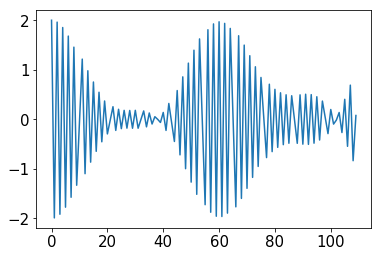

In [41]:
plot(Observables[int(100/0.2*0.048)])

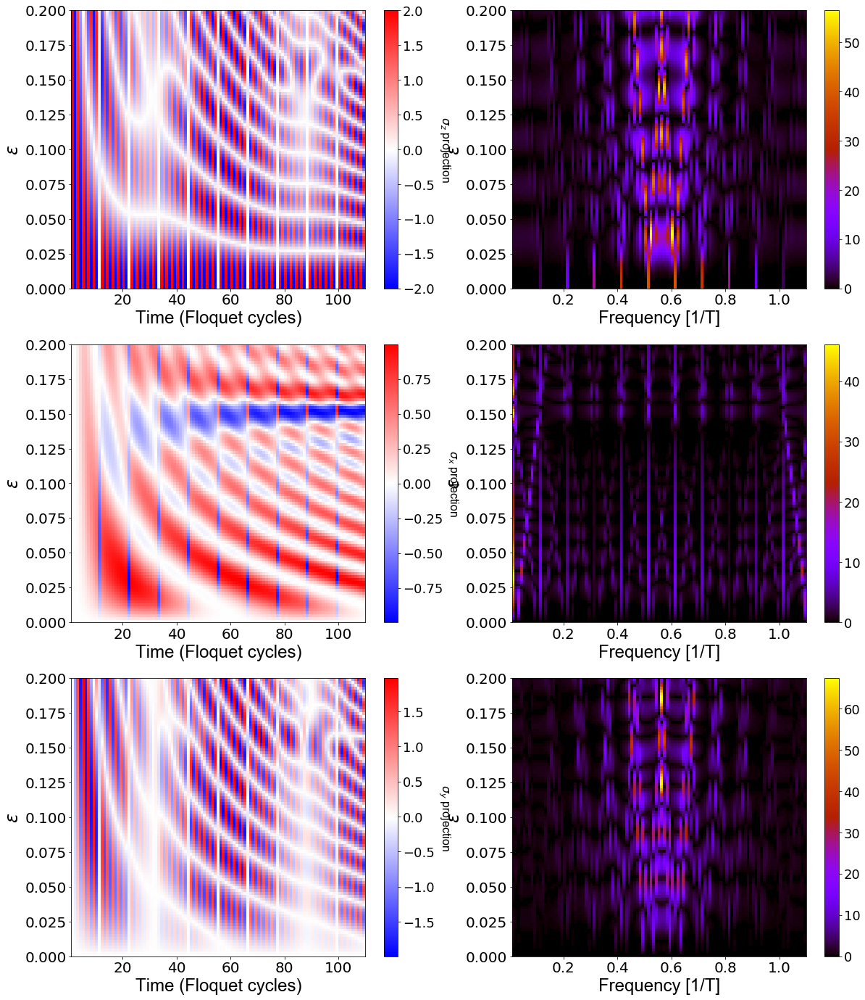

In [42]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/100, eps, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, ObservablesX, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/100, eps, np.abs(ObservablesX_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, eps, ObservablesY, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/100, eps, np.abs(ObservablesY_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[2,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

# Looking for an interesting deffect properties

In [687]:
nSites = 2

deffect_steps = 100
eps=0.045                          #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                        #disorder
delta = deltaF(w, nSites)
g = 0.1                                #Interaction
T = 1  
T_d = np.linspace(0.0, 6, deffect_steps)
time_steps = 100


nDeffects = 5
deffects = np.linspace(1,nDeffects,nDeffects)
grand_period = int(time_steps/nDeffects)

times = np.linspace(1, time_steps+nDeffects, time_steps+nDeffects)

In [688]:
Observables = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)
Observables_fft = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)

ObservablesX = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)
ObservablesX_fft = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)

ObservablesY = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)
ObservablesY_fft = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)

f = IntProgress(min=0, max=deffect_steps) # instantiate the bar
display(f) # display the bar

sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
    sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
for T_d_id, T_d_value in enumerate(T_d): 
    U=Ufunc(nSites,alpha,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    observablesX = []
    observablesY = []
    observables = []
    
    Final = states(phiInitFull,1)                ## Evolution of states
    for j in deffects:
        Final = states(Final[-1],grand_period)                ## Evolution of states
      
        for i in Final:
            observablesX.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real)
            observablesY.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real)
            observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        #print(alpha_id)
        U=Ufunc(nSites,alpha_value,g,T_d_value,delta)
        Final = states(Final[-1],2)
        observablesX.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigXOp),i).real)
        observablesY.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigYOp),i).real)
        observables.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigZOp),i).real)
    
    f.value += 1
    
    Observables_fft[T_d_id] = np.fft.fft(observables)
    Observables[T_d_id] = observables
    ObservablesX_fft[T_d_id] = np.fft.fft(observablesX)
    ObservablesX[T_d_id] = observablesX
    ObservablesY_fft[T_d_id] = np.fft.fft(observablesY)
    ObservablesY[T_d_id] = observablesY

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:47: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:51: ComplexWarning: Casting complex values to real discards the imaginary part


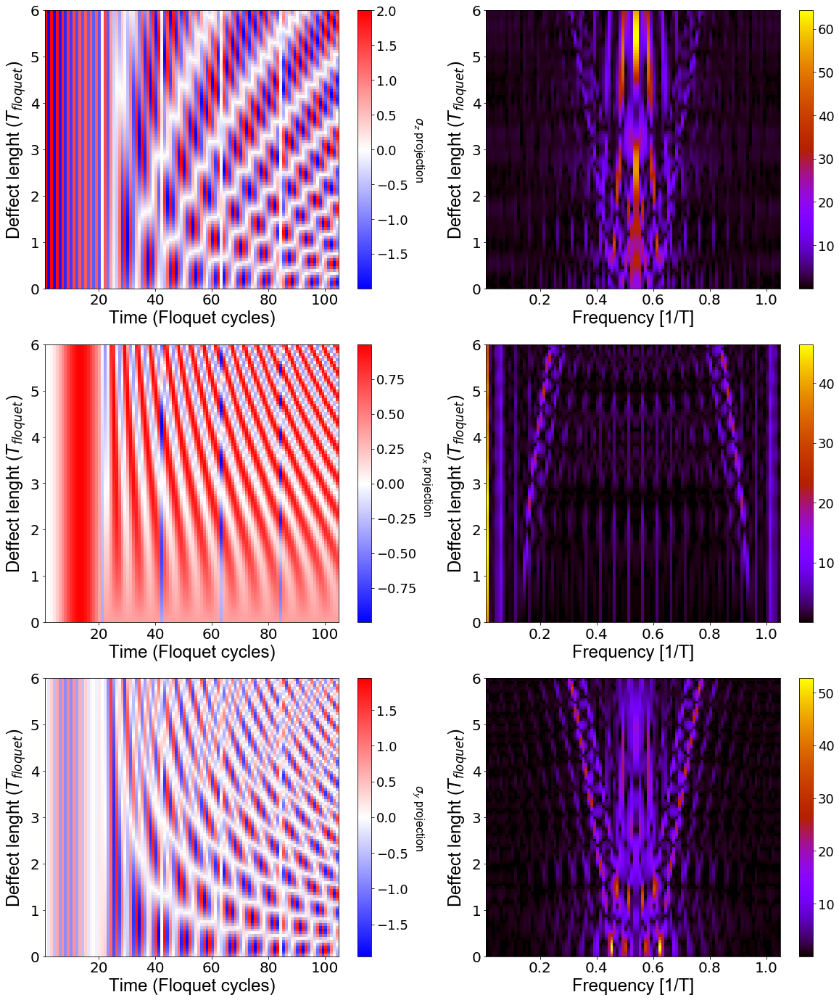

In [689]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, T_d, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/time_steps, T_d, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, T_d, ObservablesX, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/time_steps, T_d, np.abs(ObservablesX_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, T_d, ObservablesY, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/time_steps, T_d, np.abs(ObservablesY_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[2,1].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

# Epsilon dependence for different N

In [134]:
N_steps = 2
#nSites = np.linspace(2, N_steps, N_steps-1)
nSites=[3,5]

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                        #disorder
g = 0.05                                #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [135]:
nSites

[3, 5]

In [136]:
Observables = np.zeros((N_steps,eps_steps,time_steps), dtype=np.float)

for N_id, N_value in enumerate(nSites):
    delta = deltaF(w, N_value)
    #print (N_id)
    print ('Number of spins', N_value)
    f = IntProgress(min=0, max=eps_steps) # instantiate the bar
    display(f) # display the bar
    
    for alpha_id, alpha_value in enumerate(alpha): 
        U=Ufunc_all_to_all(N_value,alpha_value,g,T,delta)
        phiInitFull = np.full((2**N_value), 0)
        phiInitFull[0] = 1                             ##initial state

        Final = states(phiInitFull,time_steps)                ## Evolution of states

        sigZOp = tensorize1SiteMatrixKroneker(N_value, 1, 3)
        for i in range(2, N_value+1,1):
            sigZOp = sigZOp + tensorize1SiteMatrixKroneker(N_value, i, 3)

        observables = []
      
        for i in Final:
            observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        #print(alpha_id)
        f.value += 1
        Observables[N_id,alpha_id] = observables
        
    
#g = 0.0
#delta = deltaF(w, 2)
#print ('Number of spins', 1)
#f = IntProgress(min=0, max=eps_steps) # instantiate the bar
#display(f) # display the bar

#for alpha_id, alpha_value in enumerate(alpha): 
#    U=Ufunc(2,alpha_value,g,T,delta)

#    phiInitFull = np.full((2**2), 0)
#    phiInitFull[0] = 1                             ##initial state

#    Final = states(phiInitFull,time_steps)                ## Evolution of states

#    sigZOp = tensorize1SiteMatrixKroneker(2, 1, 3)
#    for i in range(2, 2+1,1):
#        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(2, i, 3)
       
#    observables = []
      
#    for i in Final:
#        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)

#    f.value += 1
#    Observables[0,alpha_id] = observables

Number of spins 3


Number of spins 5


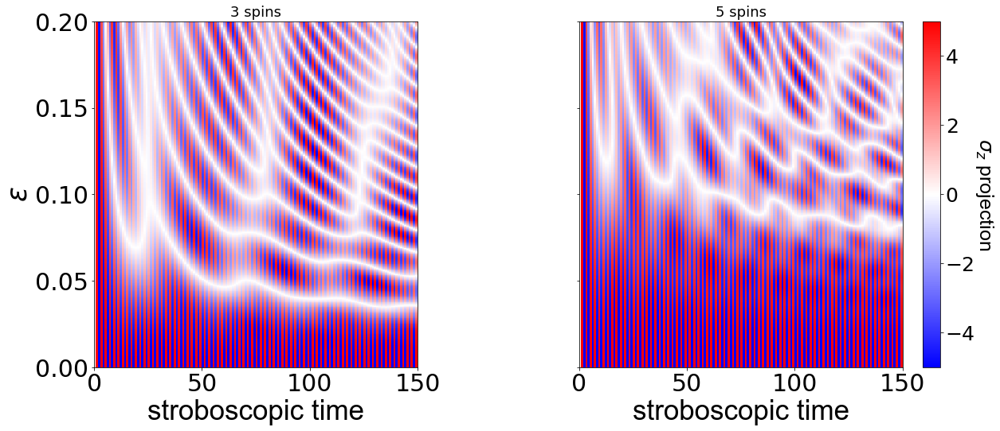

In [141]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,2,figsize=(20, 8))

p = axes[0].pcolor(times, eps, Observables[0], cmap=cm.bwr)

axes[0].axis('tight')
axes[0].set_xlabel(r'stroboscopic time', fontsize=35, **hfont)
axes[0].set_ylabel(r'$\epsilon$', fontsize=35, **hfont)


axes[0].tick_params(axis='x', labelsize=30)
axes[0].tick_params(axis='y', labelsize=30)

cb = fig.colorbar(p, ax=axes[0])
#cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 
cb.remove()

p = axes[1].pcolor(times, eps, Observables[1], cmap=cm.bwr)

axes[1].tick_params(axis='x', labelsize=30)
axes[1].tick_params(axis='y', labelsize=30)

axes[1].set_xlabel(r'stroboscopic time', fontsize=35, **hfont)
#axes[1].set_ylabel(r'$\epsilon$', fontsize=34, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=25, **hfont)
cb.ax.tick_params(labelsize=25) 

ymin, ymax = axes[0].get_ylim()
axes[0].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))
ymin, ymax = axes[1].get_ylim()
axes[1].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))


#axes[0,0].set_title(str(1)+' spin')
axes[0].set_title(str(int(nSites[0]))+' spins')
axes[1].set_title(str(int(nSites[1]))+' spins')
#axes[2,0].set_title(str(int(nSites[3]))+' spins')
#axes[2,1].set_title(str(int(nSites[4]))+' spins')

xmin, xmax = axes[0].get_xlim()
axes[0].set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))

xmin, xmax = axes[1].get_xlim()
axes[1].set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))

axes[1].set_yticklabels([])

#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

plt.gcf().set_size_inches(20,8)
plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/Fig5.pdf", bbox_inches="tight")

IndexError: too many indices for array

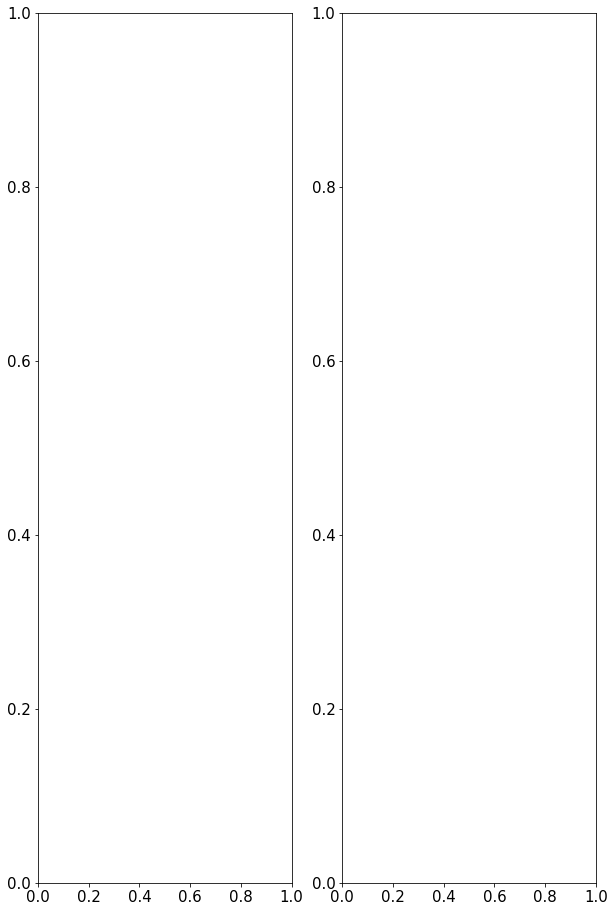

In [56]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(2,2,figsize=(20, 16))

p = axes[0,0].pcolor(times, eps, Observables[0]/2, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times, eps, Observables[1], cmap=cm.bwr)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, Observables[2], cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times, eps, Observables[3], cmap=cm.bwr)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
#p = axes[2,0].pcolor(times, eps, Observables[4], cmap=cm.bwr)

#axes[2,0].axis('tight')
#axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
#axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[2,0].tick_params(axis='x', labelsize=20)
#axes[2,0].tick_params(axis='y', labelsize=20)

#cb = fig.colorbar(p, ax=axes[2,0])
#cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
#cb.ax.tick_params(labelsize=18) 

#p = axes[2,1].pcolor(times, eps, Observables[5], cmap=cm.bwr)

#axes[2,1].tick_params(axis='x', labelsize=20)
#axes[2,1].tick_params(axis='y', labelsize=20)

#axes[2,1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
#axes[2,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
#cb.ax.tick_params(labelsize=18) 


#axes[0,0].set_title(str(1)+' spin')
axes[0,0].set_title(str(int(nSites[0]))+' spins')
axes[0,1].set_title(str(int(nSites[1]))+' spins')
axes[1,0].set_title(str(int(nSites[2]))+' spins')
axes[1,1].set_title(str(int(nSites[2]))+' spins')
#axes[2,0].set_title(str(int(nSites[3]))+' spins')
#axes[2,1].set_title(str(int(nSites[4]))+' spins')


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,16)
#plt.savefig("C:/neon/Simulated_TC_3D_1-2-3-5.pdf", bbox_inches="tight")

# Variable Parameters  - epsilons for 2 spins and crossections and density matrix

In [17]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                       #disorder
delta = deltaS(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [18]:
delta

[0, 0.0]

In [21]:
Observables = np.zeros((eps_steps,time_steps), dtype=np.float)
Statess = np.zeros((eps_steps,time_steps,2**nSites), dtype=list)
Vectorrs = np.zeros((eps_steps,time_steps), dtype=np.float)
RHO = np.zeros((eps_steps,time_steps,2**nSites,2**nSites), dtype=list)
Concurrence = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar

sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states
    
    rho_s = []        
    observables = []
    vectorrs = []
    concurr = []
      
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        rho_s.append(density_Matrix(i))
        vectorrs.append(Partial_Entropy(i))
        concurr.append(concurrence(density_Matrix(i)))
    Statess[alpha_id] = Final   
    #print(alpha_id)
    f.value += 1
    #Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    RHO[alpha_id] = rho_s
    Vectorrs[alpha_id] = vectorrs
    Concurrence[alpha_id] = concurr

A Jupyter Widget

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:38: ComplexWarning: Casting complex values to real discards the imaginary part


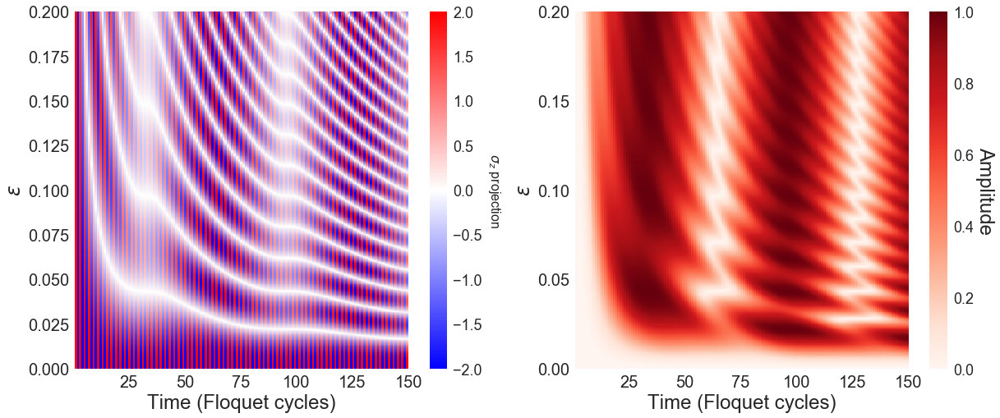

In [23]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,2,figsize=(20, 8))

p = axes[0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0].axis('tight')
axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0].tick_params(axis='x', labelsize=20)
axes[0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[1].pcolor(times, eps, Concurrence, cmap=cm.Reds)

axes[1].tick_params(axis='x', labelsize=20)
axes[1].tick_params(axis='y', labelsize=20)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


cb = fig.colorbar(p, ax=axes[1])
cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes[1].get_ylim()
axes[1].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))




#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

In [49]:
0.2/500*109

0.0436

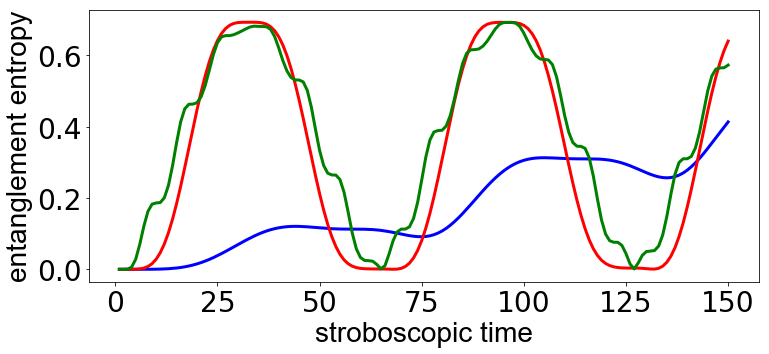

In [26]:
number =   109    #109

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(12, 4))

p = axes.plot(times, Vectorrs[30], 'b', linewidth=3.0)

p = axes.plot(times, Vectorrs[109], 'r', linewidth=3.0)

p = axes.plot(times, Vectorrs[450], 'g', linewidth=3.0)

axes.set_xlabel(r'stroboscopic time', fontsize=28, **hfont)
axes.set_ylabel(r'entanglement entropy', fontsize=28, **hfont)

axes.tick_params(axis='x', labelsize=28)
axes.tick_params(axis='y', labelsize=28)

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(0, 150, 7), 2))

#xmin, xmax = axes.get_xlim()
#axes.set_xticks(np.round(np.linspace(xmin, xmax, 8), 2))

#plt.gcf().set_size_inches(12,5)
#plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/EntropyCuts.pdf", bbox_inches="tight")

In [ ]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(9.7, 8))

p = axes.pcolor(times, eps, Vectorrs, cmap=cm.Reds)

axes.tick_params(axis='x', labelsize=30)
axes.tick_params(axis='y', labelsize=30)

axes.set_xlabel(r'n', fontsize=35, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=35, **hfont)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'S', labelpad=35, rotation=270, fontsize=35, **hfont)
cb.ax.tick_params(labelsize=30) 

ymin, ymax = axes.get_ylim()
axes.set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))


#matplotlib.pyplot.text(-85, 0.28, 'a', fontsize=34, weight="black",  verticalalignment='center')
#matplotlib.pyplot.text(138, 0.28, 'b', fontsize=34, weight="black",  verticalalignment='center')

plt.gcf().set_size_inches(9.7, 8)
plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/TM_Pic3_entropy.pdf", bbox_inches="tight")



500*0.05/0.2

number =   230

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(2,1,figsize=(12, 6))

p = axes[1].plot(times, Observables[number], 'r', linewidth=1.0)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[1].set_ylabel(r'$\sigma_z$  Projection', fontsize=16, **hfont)

p = axes[0].plot(times, Vectorrs[number], 'r', linewidth=1.0)

#axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[0].set_ylabel(r'entanglement entropy', fontsize=16, **hfont)

number =   499


#p = axes.plot(times, Observables[number], 'r', linewidth=1.0)

#axes.set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
#axes.set_ylabel(r'$\sigma_z$  Projection', fontsize=16, **hfont)

#p = axes[1].plot(times, Vectorrs[number], 'r', linewidth=1.0)

#axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
#axes[1].set_ylabel(r'entanglement entropy', fontsize=16, **hfont)

#matplotlib.pyplot.text(0, 1.5, 'a', fontsize=30, weight="black",  verticalalignment='center')
#matplotlib.pyplot.text(0, 0.6, 'b', fontsize=30, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(12, 6)
#plt.savefig("C:/neon/TM_Pic3_entropy_entangled_cut.pdf", bbox_inches="tight")



hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,2,figsize=(22, 9))

p = axes[0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0].axis('tight')
axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=35, **hfont)
axes[0].set_ylabel(r'$\epsilon$', fontsize=35, **hfont)


axes[0].tick_params(axis='x', labelsize=25)
axes[0].tick_params(axis='y', labelsize=25)

cb = fig.colorbar(p, ax=axes[0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes[0].get_ylim()
axes[0].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

#---------------------------------------------------------------------------

p = axes[1].pcolor(times, eps, Vectorrs, cmap=cm.Reds)

axes[1].tick_params(axis='x', labelsize=25)
axes[1].tick_params(axis='y', labelsize=25)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=35, **hfont)
#axes[1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1])
cb.set_label(r'entanglement entropy', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes[1].get_ylim()
axes[1].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

#---------------------------------------------------------------------------


#matplotlib.pyplot.text(-85, 0.28, 'a', fontsize=34, weight="black",  verticalalignment='center')
#matplotlib.pyplot.text(138, 0.28, 'b', fontsize=34, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(22, 9)
#plt.savefig("C:/neon/TM_Pic.3_entropy_entangled.pdf", bbox_inches="tight")





number =   499    #109

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(2,1,figsize=(12, 8))

p = axes[0].plot(times, Observables[number], 'r', linewidth=1.0)

#axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[0].set_ylabel(r'$\sigma_z$  Projection', fontsize=16, **hfont)

p = axes[1].plot(times, Vectorrs[number], 'r', linewidth=1.0)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[1].set_ylabel(r'entanglement entropy', fontsize=16, **hfont)

#matplotlib.pyplot.text(150, 1.55, 'a', fontsize=30, weight="black",  verticalalignment='center')
#matplotlib.pyplot.text(150, 0.6, 'b', fontsize=30, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(12, 8)
#plt.savefig("C:/neon/TM_Pic.3.3_entropy_entangled.pdf", bbox_inches="tight")



Whiteline = []
TIME = []
for i in np.linspace(0, time_steps-1, time_steps):
    for j in np.linspace(0, eps_steps-1, eps_steps):
        if sqrt(Observables[int(j)][int(i)]**2)<0.1:
            Whiteline.append(Vectorrs[int(j)][int(i)])
            TIME.append(i)
            break         



hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(14, 4))

p = axes.plot(TIME, Whiteline, 'r', linewidth=1.0)

axes.set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes.set_ylabel(r'entanglement entropy', fontsize=16, **hfont)

#plt.gcf().set_size_inches(14, 4)
#plt.savefig("C:/neon/TM_Pic.3.Across_white_line.pdf", bbox_inches="tight")



# Floquet

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

p = axes.pcolor(times, eps, Observables, cmap=cm.bwr)

axes.axis('tight')
axes.set_xlabel(r'n', fontsize=35, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=35, **hfont)


axes.tick_params(axis='x', labelsize=30)
axes.tick_params(axis='y', labelsize=30)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'$\langle \hat{\sigma}_z \rangle$ projection', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=25) 

ymin, ymax = axes.get_ylim()
axes.set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))


matplotlib.pyplot.text(9, 0.183, 'a', fontsize=35, weight="black",  verticalalignment='center')

matplotlib.pyplot.text(30, 0.034, '1', fontsize=24, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(30, 0.087, '2', fontsize=24, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(30, 0.139, '3', fontsize=24, weight="black",  verticalalignment='center')

matplotlib.pyplot.text(92, 0.010, '1\'', fontsize=24, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(92, 0.032, '2\'', fontsize=24, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(92, 0.052, '3\'', fontsize=24, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(92, 0.070, '4\'', fontsize=24, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(10, 8)
#plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/TM_Pic2_Floquet_points.pdf", bbox_inches="tight")

55/500*0.2

number1 =   55     #214
number2 =   109     #110
number3 =   154     #309

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,1,figsize=(12, 8))

p = axes[0].plot(times, Observables[number1], 'r', linewidth=1.0)
p = axes[1].plot(times, Observables[number2], 'r', linewidth=1.0)
p = axes[2].plot(times, Observables[number3], 'r', linewidth=1.0)

axes[0].set_ylabel(r'$\sigma_z$  Projection', fontsize=20, **hfont)
axes[1].set_ylabel(r'$\sigma_z$  Projection', fontsize=20, **hfont)
axes[2].set_ylabel(r'$\sigma_z$  Projection', fontsize=20, **hfont)
axes[2].set_xlabel(r'stroboscopic time', fontsize=30, **hfont)

axes[0].set_xticklabels([])
axes[1].set_xticklabels([])

xmin, xmax = axes[2].get_xlim()
axes[2].set_xticks(np.round(np.linspace(0, 150, 7), 2))

matplotlib.pyplot.text(140, 6.9, '1 + 2\'', fontsize=20, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(146, 11.9, '1\'', fontsize=20, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(146, 1.6, '3\'', fontsize=20, weight="black",  verticalalignment='center')

matplotlib.pyplot.text(-2, 11.9, 'b', fontsize=35, weight="black",  verticalalignment='center')

plt.gcf().set_size_inches(10, 8)
plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule2/TM_Pic2_Floquet_points_cut.pdf", bbox_inches="tight")





# Variable Parameters  - eps Fourier

phiInitFull = np.full((2**nSites), 0, dtype = complex)
phiInitFull[1] = 0.5
phiInitFull[2] = -0.5

phiInitFull = np.full((2**nSites), 0, dtype = complex)
phiInitFull[0] = 1




nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.3, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 200
times = np.linspace(1, time_steps, time_steps)

Observables = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

ObservablesX = np.zeros((eps_steps,time_steps), dtype=np.float)
ObservablesX_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

ObservablesY = np.zeros((eps_steps,time_steps), dtype=np.float)
ObservablesY_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    #U=Ufunc(nSites,alpha_value,g,T,delta)
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    evals, evecs = la.eig(U)
    Fl_eig = chop(real(-1j*log(evals)))
    Fl_vec = evecs
    
    #phiInitFull = Fl_vec[3]

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
    sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
        sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
       
    observablesX = []
    observablesY = []
    observables = []
      
    for i in Final:
        observablesX.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real)
        observablesY.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real)
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    ObservablesX_fft[alpha_id] = np.fft.fft(observablesX)
    ObservablesX[alpha_id] = observablesX
    ObservablesY_fft[alpha_id] = np.fft.fft(observablesY)
    ObservablesY[alpha_id] = observablesY

plot(Observables[109])

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

p = axes.pcolor(times, eps, ObservablesX, cmap=cm.bwr)

axes.axis('tight')
axes.set_xlabel(r'stroboscopic time', fontsize=35, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=35, **hfont)

axes.tick_params(axis='x', labelsize=25)
axes.tick_params(axis='y', labelsize=25)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes.get_ylim()
axes.set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(0, time_steps, 6), 2))

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/time_steps, eps, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, ObservablesX, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/time_steps, eps, np.abs(ObservablesX_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, eps, ObservablesY, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/time_steps, eps, np.abs(ObservablesY_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_2spins_g=0.1_T=1_100_Floquet_steps.pdf", bbox_inches="tight")





hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

#p = axes.pcolor(times, eps, Observables+ObservablesX+ObservablesY, cmap=cm.bwr,  vmin=-0.1, vmax=0.1)
p = axes.pcolor(times, eps, Observables+ObservablesX+ObservablesY, cmap=cm.bwr)

axes.axis('tight')
axes.set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes.tick_params(axis='x', labelsize=20)
axes.tick_params(axis='y', labelsize=20)


cb = fig.colorbar(p, ax=axes)
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 




# Variable Parameters  - g, coupling

nSites = 3

eps =  0.5                             #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                             #disorder
delta = deltaF(w, nSites)
g_steps = 1000
g = np.linspace(0.0, 2.5, g_steps)                     #Interaction
T = 1  
time_steps = 100
times = np.linspace(1, 100, time_steps)

Observables = np.zeros((g_steps,time_steps), dtype=np.float)
f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
for g_id, g_value in enumerate(g): 
    U=Ufunc(nSites,alpha,g_value,T,delta)
    #U=UfuncZZ(nSites,alpha,g_value,T,delta)
    #U=UfuncXX(nSites,alpha,g_value,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    observables = []
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(g_id)
    f.value += 1
    Observables[g_id] = observables

plot(Observables[50])

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

p = axes.pcolor(times, g, Observables, cmap=cm.bwr)
#p = axes[1].plot(times/time_steps, np.abs(np.fft.fft(observables)), 'r', linewidth=1.0)

axes.axis('tight')
axes.set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes.set_ylabel(r'Coupling', fontsize=24, **hfont)


axes.tick_params(axis='x', labelsize=24)
axes.tick_params(axis='y', labelsize=24)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'Spin Projection', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#axes[1].set_xlabel(r'1/Frequency [1/T]', fontsize=16, **hfont)
#axes[1].set_ylabel(r'Amplitude', fontsize=16, **hfont)
#axes[1].set_title(r'FFT for the Time Crystal', fontsize=16, **hfont);

#axes[1].set_ylim((0, 500))
#axes[1].set_xlim((0.4, 0.6))


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(10,8)
#plt.savefig("C:/neon/Simulated TC_3D_6spins_e-1.0_g-variable.pdf", bbox_inches="tight")



# Variable Parameters  - disorder

nSites = 2


eps= 1.0       #unperfection of pulses
alpha = np.pi/2-eps
w_steps = 500
w = np.linspace(0.0, 0.2, w_steps)                              #disorder
delta = deltaF3D(w, nSites)
g = np.pi/2                            #Interaction
T = 1  
time_steps = 200
times = np.linspace(1, 200, time_steps)

Observables_fft = np.zeros((w_steps,time_steps), dtype=np.float)
Observables = np.zeros((w_steps,time_steps), dtype=np.float)
f = IntProgress(min=0, max=w_steps) # instantiate the bar
display(f) # display the bar
for delta_id, delta_value in enumerate(delta): 
    U=Ufunc(nSites,alpha,g,T, delta_value)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    
    observables = []
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(delta_id)
    f.value += 1
    Observables_fft[delta_id] = np.fft.fft(observables)
    Observables[delta_id] = observables

plot(Observables_fft[0])

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

#p = axes.pcolor(times, eps, Observables, cmap=cm.RdBu)
#p = axes[1].plot(times/time_steps, np.abs(np.fft.fft(observables)), 'r', linewidth=1.0)

#axes.axis('tight')
#axes.set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
#axes.set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes.tick_params(axis='x', labelsize=24)
axes.tick_params(axis='y', labelsize=24)

p = axes.pcolor(times/200, w, np.abs(Observables_fft), cmap=cm.terrain)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

axes.set_xlabel(r'1/Frequency [1/T]', fontsize=16, **hfont)
axes.set_ylabel(r'disorder', fontsize=16, **hfont)

axes.set_xlim((0.3, 0.7))
#axes[1].set_xlim((0.4, 0.6))


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(10,8)
#plt.savefig("C:/neon/Simulated TC_3D_Fouriet_disorder_eps=0.1_2spins_flag_w.pdf", bbox_inches="tight")



# Variable Parameters  - epsilons for 2 spins

nSites = 2


eps_steps = 500
eps=np.linspace(0.00, 0.30, eps_steps)        #unperfection of pulses
alpha = []
noise = []
for i in np.linspace(1, nSites, nSites):
    noise.append(random.random())
for i in eps:
    alpha.append([np.pi/2-i*noise[0], np.pi/2-i*noise[1]])
    #alpha.append([np.pi/2-i*noise[0], np.pi/2-i*noise[1], np.pi/2-i*noise[2], np.pi/2-i*noise[3], np.pi/2-i*noise[4]])
#alpha = [np.pi/2-eps, np.pi/2+eps]
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.05                                  #Interaction
T = 1  
time_steps = 200
times = np.linspace(1, time_steps, time_steps)

Observables = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

ObservablesX = np.zeros((eps_steps,time_steps), dtype=np.float)
ObservablesX_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

ObservablesY = np.zeros((eps_steps,time_steps), dtype=np.float)
ObservablesY_fft = np.zeros((eps_steps,time_steps), dtype=np.float)


f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc_alpha(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states
    
    sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
    sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
        sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
        
    observablesX = []
    observablesY = []   
    observables = []
      
    for i in Final:
        observablesX.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real)
        observablesY.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real)
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    ObservablesX_fft[alpha_id] = np.fft.fft(observablesX)
    ObservablesX[alpha_id] = observablesX
    ObservablesY_fft[alpha_id] = np.fft.fft(observablesY)
    ObservablesY[alpha_id] = observablesY

print(noise)

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/time_steps, eps, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, ObservablesX, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/time_steps, eps, np.abs(ObservablesX_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, eps, ObservablesY, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/time_steps, eps, np.abs(ObservablesY_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[2,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")



# Bloch sphere visualization without last pi-pulse with last cycle XY Gate evolution

nSites = 2

eps=0.3   #unperfection of pulses
#alpha = np.pi/2-eps
alpha = [np.pi/2-eps, np.pi/2-eps]
w = 0.0                   #disorder
delta = deltaF(w, nSites)
g = np.pi/2                 #Interaction
T = 1                     # Period
time_steps = 51
times = np.linspace(1, time_steps, time_steps)



Initually_tmp = Final[15]

Initually_tmp

#U=Ufunc(nSites,alpha,g, T, delta)
#U=UfuncZZ(nSites,alpha,g, T, delta)
#U=UfuncXX(nSites,alpha,g, T, delta)
U=Ufunc_alpha(nSites,alpha,g, T, delta)
phiInitFull = np.full((2**nSites), 0)
phiInitFull[0] = 1                             ##initial state
#phiInitFull[3] = 1/np.sqrt(2)

#phiInitFull = Initually_tmp

N=100

#Final = states_crop(phiInitFull,time_steps,N)                ## Evolution of states
Final = states_crop(phiInitFull,time_steps,N)                ## Evolution of states

f = IntProgress(min=0, max=time_steps) # instantiate the bar
display(f) # display the bar

sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
    sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
observables = []
observables_x = []
observables_y = []
for i in Final:
    observables_x.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real/nSites)
    observables_y.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real/nSites)
    observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real/nSites)
    f.value += 1

qubit_number = 1
b = Bloch()
#b.vector_color = ['b']
#b.view = [-40,30]
b.clear()
y=-np.sin(eps*2)
z=-np.cos(eps*2)
vec = ([observables_x[0], observables_y[0], observables[0]],[observables_x[1], observables_y[1], observables[1]],
       [observables_x[-1], observables_y[-1], observables[-1]])
b.add_vectors(vec)

for i in Final:
    b.add_points([observables_x,observables_y,observables],'m')

b.show()



# Cutting my dencity matrix

nSites = 2

eps_steps = 100
eps=np.linspace(0.00, 0.15, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                      #disorder
delta = deltaF(w, nSites)
g = 0.1                                #Interaction
T = 1  
time_steps = 100
times = np.linspace(1, time_steps, time_steps)

projection = 2

Observables = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

Observables1 = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables1_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

Observables2 = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables2_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc(nSites,alpha_value,g,T,delta)
    #U=UfuncZZ(nSites,alpha_value,g,T,delta)
    #U=UfuncXX(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, projection)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, projection)
       
    observables1 = []
    observables2 = []
    observables = []
      
    for i in Final:
        observables1.append(np.dot(np.dot(np.conjugate(i).T,tensorize1SiteMatrixKroneker(nSites, 1, projection)),i).real)
        observables2.append(np.dot(np.dot(np.conjugate(i).T,tensorize1SiteMatrixKroneker(nSites, 2, projection)),i).real)
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    Observables1_fft[alpha_id] = np.fft.fft(observables1)
    Observables1[alpha_id] = observables1
    Observables2_fft[alpha_id] = np.fft.fft(observables2)
    Observables2[alpha_id] = observables2

plot(Observables[int(1000/0.15*0.0625)])

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/100, eps, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, Observables1, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/100, eps, np.abs(Observables1_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, eps, Observables2, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/100, eps, np.abs(Observables2_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[2,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")



# Localization in time Zimuliren

nSites = 2


eps_steps = 100
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.05                                #Interaction
T = 1  
T_d = 3.0
time_steps = 100


nDeffects = 10
deffects = np.linspace(1,nDeffects,nDeffects)
grand_period = int(time_steps/nDeffects)

times = np.linspace(1, time_steps+nDeffects, time_steps+nDeffects)

Observables = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)
Observables_fft = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)

ObservablesX = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)
ObservablesX_fft = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)

ObservablesY = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)
ObservablesY_fft = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar


sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)                              #projection matrixes
sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)

for i in range(2, nSites+1,1):
    sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
    sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
         
for alpha_id, alpha_value in enumerate(alpha): 
    
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    observablesX = []
    observablesY = []
    observables = []
    
    Final = states(phiInitFull,1)                ## first step of evolution
    for j in deffects:
        U=Ufunc(nSites,alpha_value,g,T,delta)
        Final = states(Final[-1],grand_period)                ## Evolution of states between two deffects
      
        for i in Final:
            observablesX.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real)
            observablesY.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real)
            observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)

        U=Ufunc(nSites,alpha_value,g,T_d,delta)
        Final = states(Final[-1],2)
        observablesX.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigXOp),i).real)
        observablesY.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigYOp),i).real)
        observables.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigZOp),i).real)
    
    f.value += 1
    
    Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    ObservablesX_fft[alpha_id] = np.fft.fft(observablesX)
    ObservablesX[alpha_id] = observablesX
    ObservablesY_fft[alpha_id] = np.fft.fft(observablesY)
    ObservablesY[alpha_id] = observablesY

plot(Observables[int(100/0.2*0.048)])

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/100, eps, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, ObservablesX, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/100, eps, np.abs(ObservablesX_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, eps, ObservablesY, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/100, eps, np.abs(ObservablesY_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[2,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")



# Looking for an interesting deffect properties

nSites = 2

deffect_steps = 100
eps=0.045                          #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                        #disorder
delta = deltaF(w, nSites)
g = 0.1                                #Interaction
T = 1  
T_d = np.linspace(0.0, 6, deffect_steps)
time_steps = 100


nDeffects = 5
deffects = np.linspace(1,nDeffects,nDeffects)
grand_period = int(time_steps/nDeffects)

times = np.linspace(1, time_steps+nDeffects, time_steps+nDeffects)

Observables = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)
Observables_fft = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)

ObservablesX = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)
ObservablesX_fft = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)

ObservablesY = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)
ObservablesY_fft = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)

f = IntProgress(min=0, max=deffect_steps) # instantiate the bar
display(f) # display the bar

sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
    sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
for T_d_id, T_d_value in enumerate(T_d): 
    U=Ufunc(nSites,alpha,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    observablesX = []
    observablesY = []
    observables = []
    
    Final = states(phiInitFull,1)                ## Evolution of states
    for j in deffects:
        Final = states(Final[-1],grand_period)                ## Evolution of states
      
        for i in Final:
            observablesX.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real)
            observablesY.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real)
            observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        #print(alpha_id)
        U=Ufunc(nSites,alpha_value,g,T_d_value,delta)
        Final = states(Final[-1],2)
        observablesX.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigXOp),i).real)
        observablesY.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigYOp),i).real)
        observables.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigZOp),i).real)
    
    f.value += 1
    
    Observables_fft[T_d_id] = np.fft.fft(observables)
    Observables[T_d_id] = observables
    ObservablesX_fft[T_d_id] = np.fft.fft(observablesX)
    ObservablesX[T_d_id] = observablesX
    ObservablesY_fft[T_d_id] = np.fft.fft(observablesY)
    ObservablesY[T_d_id] = observablesY

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, T_d, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/time_steps, T_d, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, T_d, ObservablesX, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/time_steps, T_d, np.abs(ObservablesX_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, T_d, ObservablesY, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/time_steps, T_d, np.abs(ObservablesY_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[2,1].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")



# Epsilon dependence for different N

N_steps = 2
#nSites = np.linspace(2, N_steps, N_steps-1)
nSites=[3,5]

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                        #disorder
g = 0.05                                #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

nSites

Observables = np.zeros((N_steps,eps_steps,time_steps), dtype=np.float)

for N_id, N_value in enumerate(nSites):
    delta = deltaF(w, N_value)
    #print (N_id)
    print ('Number of spins', N_value)
    f = IntProgress(min=0, max=eps_steps) # instantiate the bar
    display(f) # display the bar
    
    for alpha_id, alpha_value in enumerate(alpha): 
        U=Ufunc_all_to_all(N_value,alpha_value,g,T,delta)
        phiInitFull = np.full((2**N_value), 0)
        phiInitFull[0] = 1                             ##initial state

        Final = states(phiInitFull,time_steps)                ## Evolution of states

        sigZOp = tensorize1SiteMatrixKroneker(N_value, 1, 3)
        for i in range(2, N_value+1,1):
            sigZOp = sigZOp + tensorize1SiteMatrixKroneker(N_value, i, 3)

        observables = []
      
        for i in Final:
            observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        #print(alpha_id)
        f.value += 1
        Observables[N_id,alpha_id] = observables
        
    
#g = 0.0
#delta = deltaF(w, 2)
#print ('Number of spins', 1)
#f = IntProgress(min=0, max=eps_steps) # instantiate the bar
#display(f) # display the bar

#for alpha_id, alpha_value in enumerate(alpha): 
#    U=Ufunc(2,alpha_value,g,T,delta)

#    phiInitFull = np.full((2**2), 0)
#    phiInitFull[0] = 1                             ##initial state

#    Final = states(phiInitFull,time_steps)                ## Evolution of states

#    sigZOp = tensorize1SiteMatrixKroneker(2, 1, 3)
#    for i in range(2, 2+1,1):
#        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(2, i, 3)
       
#    observables = []
      
#    for i in Final:
#        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)

#    f.value += 1
#    Observables[0,alpha_id] = observables

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,2,figsize=(20, 8))

p = axes[0].pcolor(times, eps, Observables[0], cmap=cm.bwr)

axes[0].axis('tight')
axes[0].set_xlabel(r'stroboscopic time', fontsize=35, **hfont)
axes[0].set_ylabel(r'$\epsilon$', fontsize=35, **hfont)


axes[0].tick_params(axis='x', labelsize=30)
axes[0].tick_params(axis='y', labelsize=30)

cb = fig.colorbar(p, ax=axes[0])
#cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 
cb.remove()

p = axes[1].pcolor(times, eps, Observables[1], cmap=cm.bwr)

axes[1].tick_params(axis='x', labelsize=30)
axes[1].tick_params(axis='y', labelsize=30)

axes[1].set_xlabel(r'stroboscopic time', fontsize=35, **hfont)
#axes[1].set_ylabel(r'$\epsilon$', fontsize=34, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=25, **hfont)
cb.ax.tick_params(labelsize=25) 

ymin, ymax = axes[0].get_ylim()
axes[0].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))
ymin, ymax = axes[1].get_ylim()
axes[1].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))


#axes[0,0].set_title(str(1)+' spin')
axes[0].set_title(str(int(nSites[0]))+' spins')
axes[1].set_title(str(int(nSites[1]))+' spins')
#axes[2,0].set_title(str(int(nSites[3]))+' spins')
#axes[2,1].set_title(str(int(nSites[4]))+' spins')

xmin, xmax = axes[0].get_xlim()
axes[0].set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))

xmin, xmax = axes[1].get_xlim()
axes[1].set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))

axes[1].set_yticklabels([])

#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

plt.gcf().set_size_inches(20,8)
plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/Fig5.pdf", bbox_inches="tight")



hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(2,2,figsize=(20, 16))

p = axes[0,0].pcolor(times, eps, Observables[0]/2, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times, eps, Observables[1], cmap=cm.bwr)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, Observables[2], cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times, eps, Observables[3], cmap=cm.bwr)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
#p = axes[2,0].pcolor(times, eps, Observables[4], cmap=cm.bwr)

#axes[2,0].axis('tight')
#axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
#axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[2,0].tick_params(axis='x', labelsize=20)
#axes[2,0].tick_params(axis='y', labelsize=20)

#cb = fig.colorbar(p, ax=axes[2,0])
#cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
#cb.ax.tick_params(labelsize=18) 

#p = axes[2,1].pcolor(times, eps, Observables[5], cmap=cm.bwr)

#axes[2,1].tick_params(axis='x', labelsize=20)
#axes[2,1].tick_params(axis='y', labelsize=20)

#axes[2,1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
#axes[2,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
#cb.ax.tick_params(labelsize=18) 


#axes[0,0].set_title(str(1)+' spin')
axes[0,0].set_title(str(int(nSites[0]))+' spins')
axes[0,1].set_title(str(int(nSites[1]))+' spins')
axes[1,0].set_title(str(int(nSites[2]))+' spins')
axes[1,1].set_title(str(int(nSites[2]))+' spins')
#axes[2,0].set_title(str(int(nSites[3]))+' spins')
#axes[2,1].set_title(str(int(nSites[4]))+' spins')


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,16)
#plt.savefig("C:/neon/Simulated_TC_3D_1-2-3-5.pdf", bbox_inches="tight")









# Variable Parameters  - epsilons for 2 spins and crossections and density matrix

nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                       #disorder
delta = deltaS(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

delta

Observables = np.zeros((eps_steps,time_steps), dtype=np.float)
Statess = np.zeros((eps_steps,time_steps,2**nSites), dtype=list)
Vectorrs = np.zeros((eps_steps,time_steps), dtype=np.float)
RHO = np.zeros((eps_steps,time_steps,2**nSites,2**nSites), dtype=list)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar

sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states
    
    rho_s = []        
    observables = []
    vectorrs = []
      
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        rho_s.append(density_Matrix(i))
        vectorrs.append(Partial_Entropy(i))
    Statess[alpha_id] = Final   
    #print(alpha_id)
    f.value += 1
    #Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    RHO[alpha_id] = rho_s
    Vectorrs[alpha_id] = vectorrs

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,2,figsize=(20, 8))

p = axes[0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0].axis('tight')
axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0].tick_params(axis='x', labelsize=20)
axes[0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[1].pcolor(times, eps, Vectorrs, cmap=cm.Reds)

axes[1].tick_params(axis='x', labelsize=20)
axes[1].tick_params(axis='y', labelsize=20)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


cb = fig.colorbar(p, ax=axes[1])
cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes[1].get_ylim()
axes[1].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))




#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

0.2/500*109

number =   109    #109

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(12, 4))

p = axes.plot(times, Vectorrs[30], 'b', linewidth=3.0)

p = axes.plot(times, Vectorrs[109], 'r', linewidth=3.0)

p = axes.plot(times, Vectorrs[450], 'g', linewidth=3.0)

axes.set_xlabel(r'stroboscopic time', fontsize=28, **hfont)
axes.set_ylabel(r'entanglement entropy', fontsize=28, **hfont)

axes.tick_params(axis='x', labelsize=28)
axes.tick_params(axis='y', labelsize=28)

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(0, 150, 7), 2))

#xmin, xmax = axes.get_xlim()
#axes.set_xticks(np.round(np.linspace(xmin, xmax, 8), 2))

#plt.gcf().set_size_inches(12,5)
#plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/EntropyCuts.pdf", bbox_inches="tight")

In [392]:
500*0.05/0.2

125.0

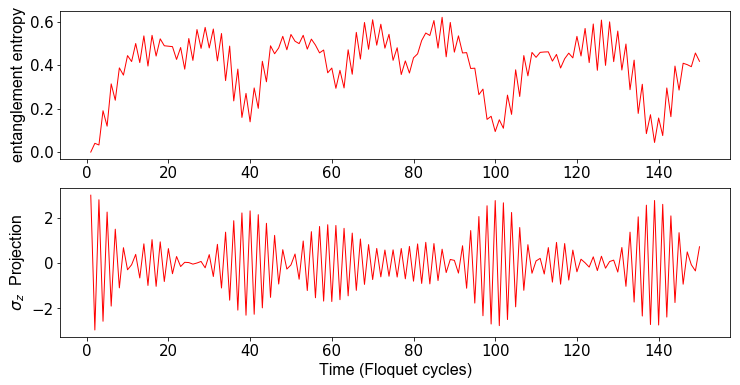

In [124]:
number =   230

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(2,1,figsize=(12, 6))

p = axes[1].plot(times, Observables[number], 'r', linewidth=1.0)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[1].set_ylabel(r'$\sigma_z$  Projection', fontsize=16, **hfont)

p = axes[0].plot(times, Vectorrs[number], 'r', linewidth=1.0)

#axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[0].set_ylabel(r'entanglement entropy', fontsize=16, **hfont)

number =   499


#p = axes.plot(times, Observables[number], 'r', linewidth=1.0)

#axes.set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
#axes.set_ylabel(r'$\sigma_z$  Projection', fontsize=16, **hfont)

#p = axes[1].plot(times, Vectorrs[number], 'r', linewidth=1.0)

#axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
#axes[1].set_ylabel(r'entanglement entropy', fontsize=16, **hfont)

#matplotlib.pyplot.text(0, 1.5, 'a', fontsize=30, weight="black",  verticalalignment='center')
#matplotlib.pyplot.text(0, 0.6, 'b', fontsize=30, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(12, 6)
#plt.savefig("C:/neon/TM_Pic3_entropy_entangled_cut.pdf", bbox_inches="tight")

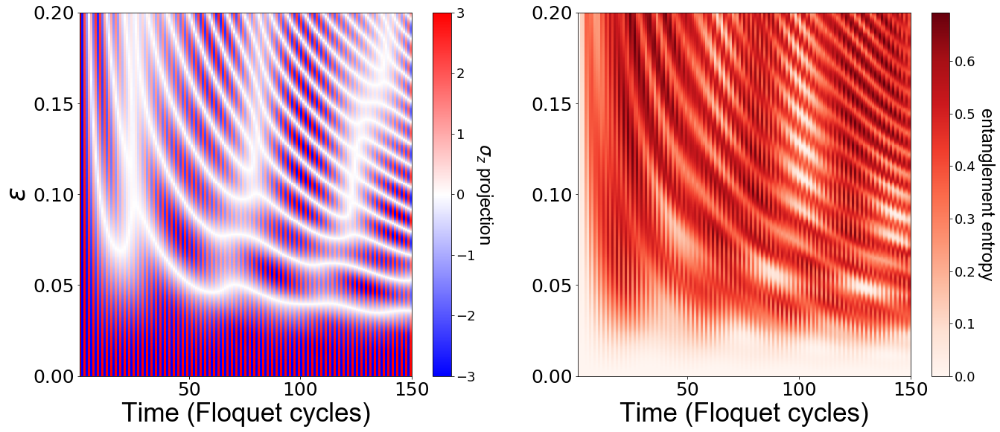

In [125]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,2,figsize=(22, 9))

p = axes[0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0].axis('tight')
axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=35, **hfont)
axes[0].set_ylabel(r'$\epsilon$', fontsize=35, **hfont)


axes[0].tick_params(axis='x', labelsize=25)
axes[0].tick_params(axis='y', labelsize=25)

cb = fig.colorbar(p, ax=axes[0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes[0].get_ylim()
axes[0].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

#---------------------------------------------------------------------------

p = axes[1].pcolor(times, eps, Vectorrs, cmap=cm.Reds)

axes[1].tick_params(axis='x', labelsize=25)
axes[1].tick_params(axis='y', labelsize=25)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=35, **hfont)
#axes[1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1])
cb.set_label(r'entanglement entropy', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes[1].get_ylim()
axes[1].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

#---------------------------------------------------------------------------


#matplotlib.pyplot.text(-85, 0.28, 'a', fontsize=34, weight="black",  verticalalignment='center')
#matplotlib.pyplot.text(138, 0.28, 'b', fontsize=34, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(22, 9)
#plt.savefig("C:/neon/TM_Pic.3_entropy_entangled.pdf", bbox_inches="tight")

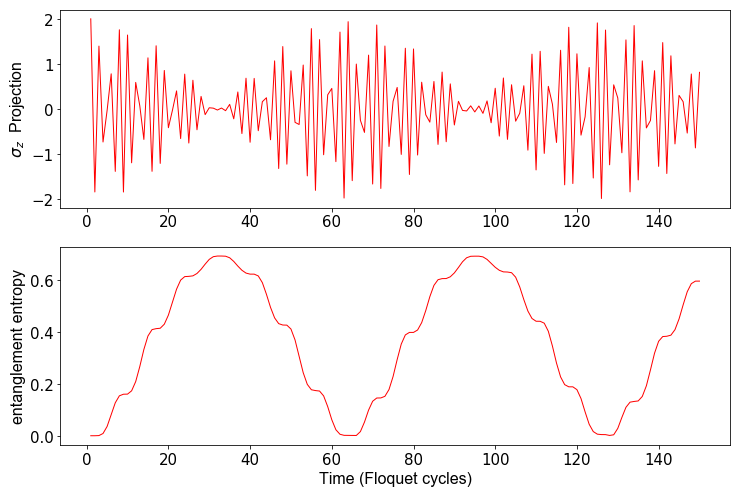

In [411]:
number =   499    #109

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(2,1,figsize=(12, 8))

p = axes[0].plot(times, Observables[number], 'r', linewidth=1.0)

#axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[0].set_ylabel(r'$\sigma_z$  Projection', fontsize=16, **hfont)

p = axes[1].plot(times, Vectorrs[number], 'r', linewidth=1.0)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[1].set_ylabel(r'entanglement entropy', fontsize=16, **hfont)

#matplotlib.pyplot.text(150, 1.55, 'a', fontsize=30, weight="black",  verticalalignment='center')
#matplotlib.pyplot.text(150, 0.6, 'b', fontsize=30, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(12, 8)
#plt.savefig("C:/neon/TM_Pic.3.3_entropy_entangled.pdf", bbox_inches="tight")

In [31]:
Whiteline = []
TIME = []
for i in np.linspace(0, time_steps-1, time_steps):
    for j in np.linspace(0, eps_steps-1, eps_steps):
        if sqrt(Observables[int(j)][int(i)]**2)<0.1:
            Whiteline.append(Vectorrs[int(j)][int(i)])
            TIME.append(i)
            break         

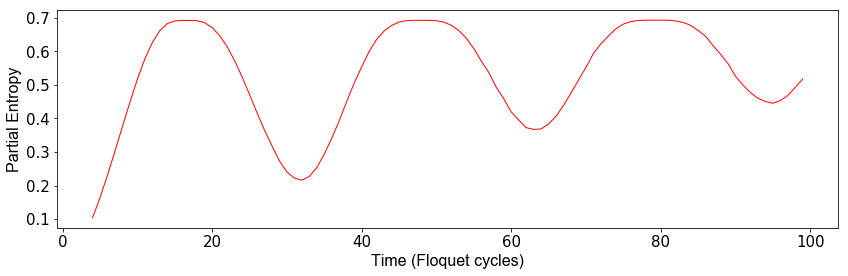

In [32]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(14, 4))

p = axes.plot(TIME, Whiteline, 'r', linewidth=1.0)

axes.set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes.set_ylabel(r'entanglement entropy', fontsize=16, **hfont)

#plt.gcf().set_size_inches(14, 4)
#plt.savefig("C:/neon/TM_Pic.3.Across_white_line.pdf", bbox_inches="tight")

# Floquet

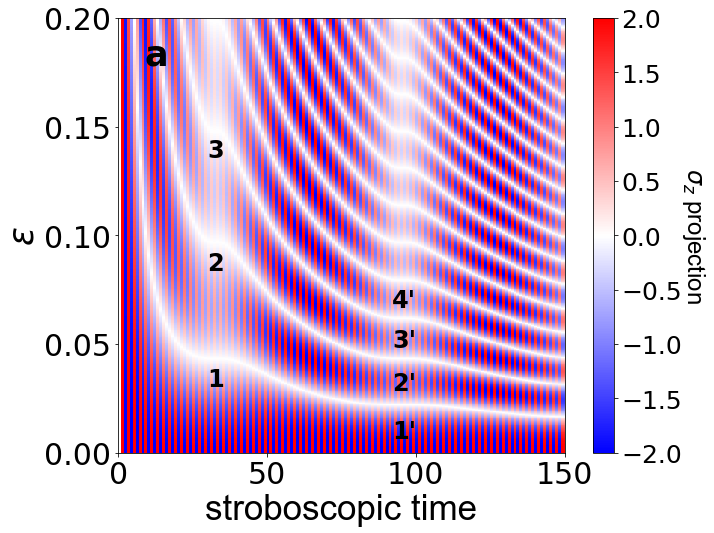

In [29]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

p = axes.pcolor(times, eps, Observables, cmap=cm.bwr)

axes.axis('tight')
axes.set_xlabel(r'n', fontsize=35, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=35, **hfont)


axes.tick_params(axis='x', labelsize=30)
axes.tick_params(axis='y', labelsize=30)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'$\langle \hat{\sigma}_z \rangle$ projection', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=25) 

ymin, ymax = axes.get_ylim()
axes.set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))


matplotlib.pyplot.text(9, 0.183, 'a', fontsize=35, weight="black",  verticalalignment='center')

matplotlib.pyplot.text(30, 0.034, '1', fontsize=24, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(30, 0.087, '2', fontsize=24, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(30, 0.139, '3', fontsize=24, weight="black",  verticalalignment='center')

matplotlib.pyplot.text(92, 0.010, '1\'', fontsize=24, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(92, 0.032, '2\'', fontsize=24, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(92, 0.052, '3\'', fontsize=24, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(92, 0.070, '4\'', fontsize=24, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(10, 8)
#plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/TM_Pic2_Floquet_points.pdf", bbox_inches="tight")

In [807]:
55/500*0.2

0.022000000000000002

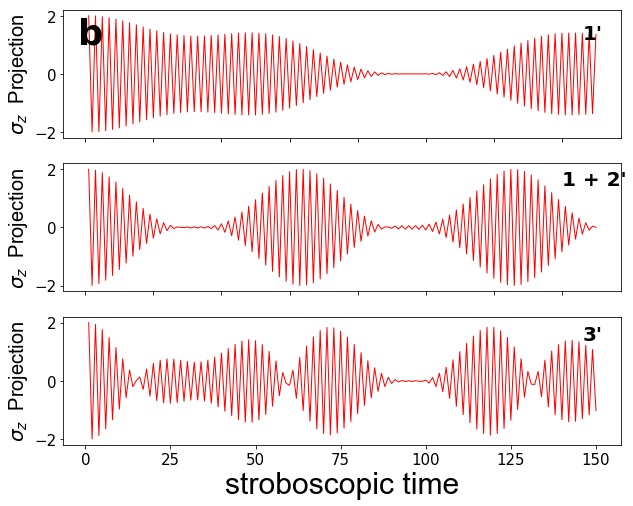

In [30]:
number1 =   55     #214
number2 =   109     #110
number3 =   154     #309

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,1,figsize=(12, 8))

p = axes[0].plot(times, Observables[number1], 'r', linewidth=1.0)
p = axes[1].plot(times, Observables[number2], 'r', linewidth=1.0)
p = axes[2].plot(times, Observables[number3], 'r', linewidth=1.0)

axes[0].set_ylabel(r'$\sigma_z$  Projection', fontsize=20, **hfont)
axes[1].set_ylabel(r'$\sigma_z$  Projection', fontsize=20, **hfont)
axes[2].set_ylabel(r'$\sigma_z$  Projection', fontsize=20, **hfont)
axes[2].set_xlabel(r'stroboscopic time', fontsize=30, **hfont)

axes[0].set_xticklabels([])
axes[1].set_xticklabels([])

xmin, xmax = axes[2].get_xlim()
axes[2].set_xticks(np.round(np.linspace(0, 150, 7), 2))

matplotlib.pyplot.text(140, 6.9, '1 + 2\'', fontsize=20, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(146, 11.9, '1\'', fontsize=20, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(146, 1.6, '3\'', fontsize=20, weight="black",  verticalalignment='center')

matplotlib.pyplot.text(-2, 11.9, 'b', fontsize=35, weight="black",  verticalalignment='center')

plt.gcf().set_size_inches(10, 8)
plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule2/TM_Pic2_Floquet_points_cut.pdf", bbox_inches="tight")

# Variable Parameters  - eps Fourier

In [267]:
phiInitFull = np.full((2**nSites), 0, dtype = complex)
phiInitFull[1] = 0.5
phiInitFull[2] = -0.5

In [62]:
phiInitFull = np.full((2**nSites), 0, dtype = complex)
phiInitFull[0] = 1


In [64]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.3, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 200
times = np.linspace(1, time_steps, time_steps)

In [65]:
Observables = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

ObservablesX = np.zeros((eps_steps,time_steps), dtype=np.float)
ObservablesX_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

ObservablesY = np.zeros((eps_steps,time_steps), dtype=np.float)
ObservablesY_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    #U=Ufunc(nSites,alpha_value,g,T,delta)
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    evals, evecs = la.eig(U)
    Fl_eig = chop(real(-1j*log(evals)))
    Fl_vec = evecs
    
    #phiInitFull = Fl_vec[3]

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
    sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
        sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
       
    observablesX = []
    observablesY = []
    observables = []
      
    for i in Final:
        observablesX.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real)
        observablesY.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real)
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    ObservablesX_fft[alpha_id] = np.fft.fft(observablesX)
    ObservablesX[alpha_id] = observablesX
    ObservablesY_fft[alpha_id] = np.fft.fft(observablesY)
    ObservablesY[alpha_id] = observablesY

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:44: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:46: ComplexWarning: Casting complex values to real discards the imaginary part


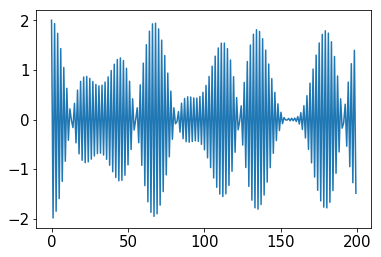

In [66]:
plot(Observables[109])

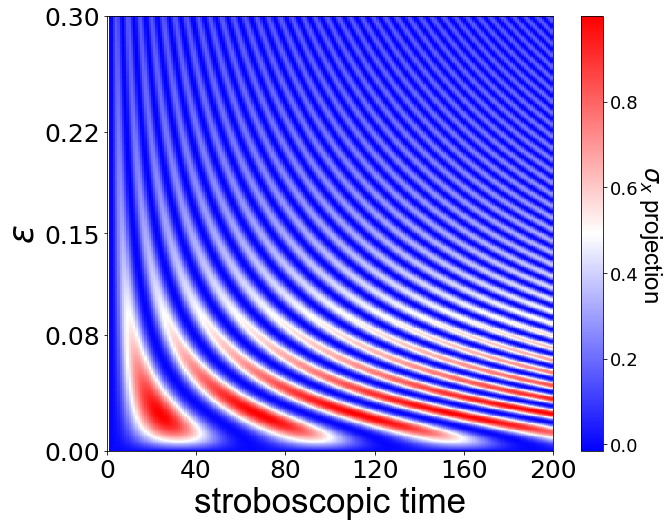

In [70]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

p = axes.pcolor(times, eps, ObservablesX, cmap=cm.bwr)

axes.axis('tight')
axes.set_xlabel(r'stroboscopic time', fontsize=35, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=35, **hfont)

axes.tick_params(axis='x', labelsize=25)
axes.tick_params(axis='y', labelsize=25)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes.get_ylim()
axes.set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(0, time_steps, 6), 2))

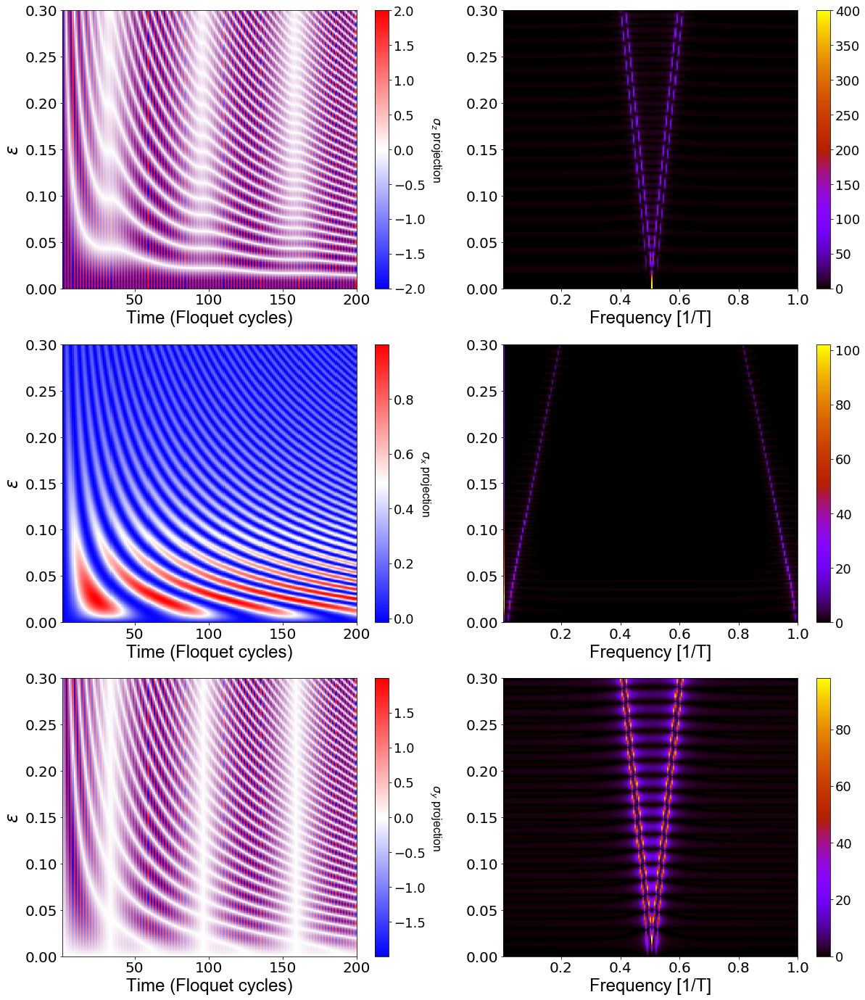

In [69]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/time_steps, eps, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, ObservablesX, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/time_steps, eps, np.abs(ObservablesX_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, eps, ObservablesY, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/time_steps, eps, np.abs(ObservablesY_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_2spins_g=0.1_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

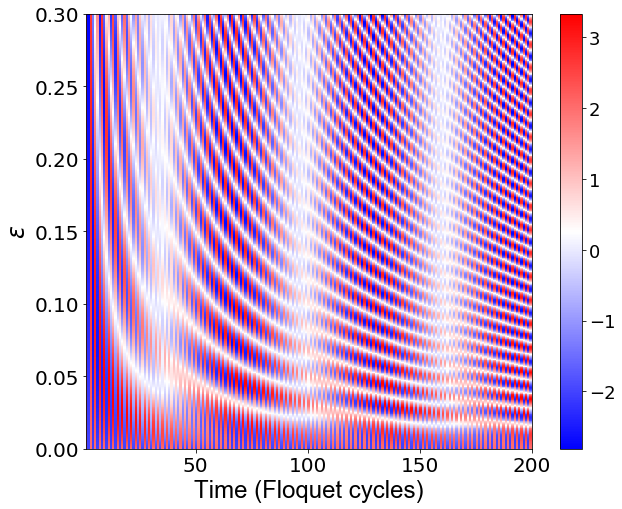

In [68]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

#p = axes.pcolor(times, eps, Observables+ObservablesX+ObservablesY, cmap=cm.bwr,  vmin=-0.1, vmax=0.1)
p = axes.pcolor(times, eps, Observables+ObservablesX+ObservablesY, cmap=cm.bwr)

axes.axis('tight')
axes.set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes.tick_params(axis='x', labelsize=20)
axes.tick_params(axis='y', labelsize=20)


cb = fig.colorbar(p, ax=axes)
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


# Variable Parameters  - g, coupling

In [725]:
nSites = 3

eps =  0.5                             #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                             #disorder
delta = deltaF(w, nSites)
g_steps = 1000
g = np.linspace(0.0, 2.5, g_steps)                     #Interaction
T = 1  
time_steps = 100
times = np.linspace(1, 100, time_steps)

In [726]:
Observables = np.zeros((g_steps,time_steps), dtype=np.float)
f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
for g_id, g_value in enumerate(g): 
    U=Ufunc(nSites,alpha,g_value,T,delta)
    #U=UfuncZZ(nSites,alpha,g_value,T,delta)
    #U=UfuncXX(nSites,alpha,g_value,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    observables = []
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(g_id)
    f.value += 1
    Observables[g_id] = observables

Widget Javascript not detected.  It may not be installed or enabled properly.


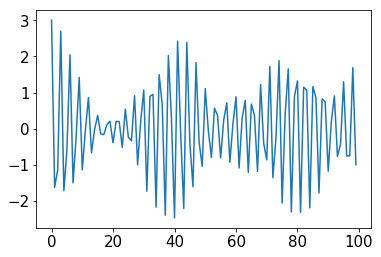

In [727]:
plot(Observables[50])

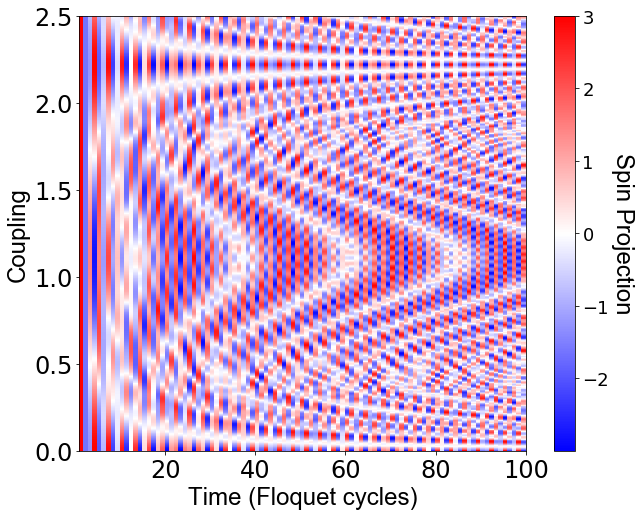

In [728]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

p = axes.pcolor(times, g, Observables, cmap=cm.bwr)
#p = axes[1].plot(times/time_steps, np.abs(np.fft.fft(observables)), 'r', linewidth=1.0)

axes.axis('tight')
axes.set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes.set_ylabel(r'Coupling', fontsize=24, **hfont)


axes.tick_params(axis='x', labelsize=24)
axes.tick_params(axis='y', labelsize=24)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'Spin Projection', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#axes[1].set_xlabel(r'1/Frequency [1/T]', fontsize=16, **hfont)
#axes[1].set_ylabel(r'Amplitude', fontsize=16, **hfont)
#axes[1].set_title(r'FFT for the Time Crystal', fontsize=16, **hfont);

#axes[1].set_ylim((0, 500))
#axes[1].set_xlim((0.4, 0.6))


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(10,8)
#plt.savefig("C:/neon/Simulated TC_3D_6spins_e-1.0_g-variable.pdf", bbox_inches="tight")

# Variable Parameters  - disorder

In [356]:
nSites = 2


eps= 1.0       #unperfection of pulses
alpha = np.pi/2-eps
w_steps = 500
w = np.linspace(0.0, 0.2, w_steps)                              #disorder
delta = deltaF3D(w, nSites)
g = np.pi/2                            #Interaction
T = 1  
time_steps = 200
times = np.linspace(1, 200, time_steps)

In [357]:
Observables_fft = np.zeros((w_steps,time_steps), dtype=np.float)
Observables = np.zeros((w_steps,time_steps), dtype=np.float)
f = IntProgress(min=0, max=w_steps) # instantiate the bar
display(f) # display the bar
for delta_id, delta_value in enumerate(delta): 
    U=Ufunc(nSites,alpha,g,T, delta_value)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    
    observables = []
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(delta_id)
    f.value += 1
    Observables_fft[delta_id] = np.fft.fft(observables)
    Observables[delta_id] = observables

Widget Javascript not detected.  It may not be installed or enabled properly.


C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: ComplexWarning: Casting complex values to real discards the imaginary part


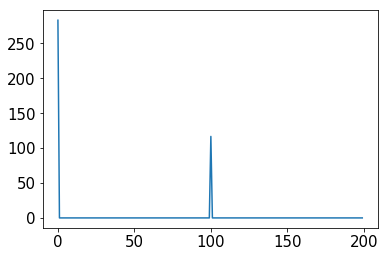

In [358]:
plot(Observables_fft[0])

(0.3, 0.7)

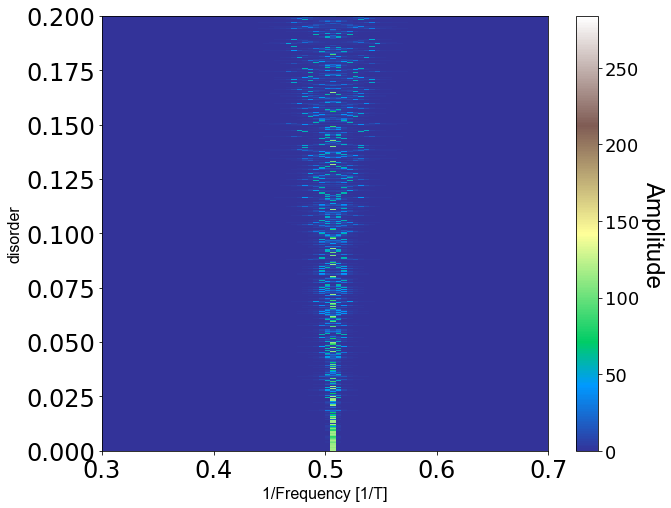

In [359]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

#p = axes.pcolor(times, eps, Observables, cmap=cm.RdBu)
#p = axes[1].plot(times/time_steps, np.abs(np.fft.fft(observables)), 'r', linewidth=1.0)

#axes.axis('tight')
#axes.set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
#axes.set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes.tick_params(axis='x', labelsize=24)
axes.tick_params(axis='y', labelsize=24)

p = axes.pcolor(times/200, w, np.abs(Observables_fft), cmap=cm.terrain)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

axes.set_xlabel(r'1/Frequency [1/T]', fontsize=16, **hfont)
axes.set_ylabel(r'disorder', fontsize=16, **hfont)

axes.set_xlim((0.3, 0.7))
#axes[1].set_xlim((0.4, 0.6))


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(10,8)
#plt.savefig("C:/neon/Simulated TC_3D_Fouriet_disorder_eps=0.1_2spins_flag_w.pdf", bbox_inches="tight")

# Variable Parameters  - epsilons for 2 spins

In [60]:
nSites = 2


eps_steps = 500
eps=np.linspace(0.00, 0.30, eps_steps)        #unperfection of pulses
alpha = []
noise = []
for i in np.linspace(1, nSites, nSites):
    noise.append(random.random())
for i in eps:
    alpha.append([np.pi/2-i*noise[0], np.pi/2-i*noise[1]])
    #alpha.append([np.pi/2-i*noise[0], np.pi/2-i*noise[1], np.pi/2-i*noise[2], np.pi/2-i*noise[3], np.pi/2-i*noise[4]])
#alpha = [np.pi/2-eps, np.pi/2+eps]
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.05                                  #Interaction
T = 1  
time_steps = 200
times = np.linspace(1, time_steps, time_steps)

In [61]:
Observables = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

ObservablesX = np.zeros((eps_steps,time_steps), dtype=np.float)
ObservablesX_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

ObservablesY = np.zeros((eps_steps,time_steps), dtype=np.float)
ObservablesY_fft = np.zeros((eps_steps,time_steps), dtype=np.float)


f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc_alpha(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states
    
    sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
    sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
        sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
        
    observablesX = []
    observablesY = []   
    observables = []
      
    for i in Final:
        observablesX.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real)
        observablesY.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real)
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    ObservablesX_fft[alpha_id] = np.fft.fft(observablesX)
    ObservablesX[alpha_id] = observablesX
    ObservablesY_fft[alpha_id] = np.fft.fft(observablesY)
    ObservablesY[alpha_id] = observablesY

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:43: ComplexWarning: Casting complex values to real discards the imaginary part


In [54]:
print(noise)

[0.3386270537085865, 0.31408958633279416]


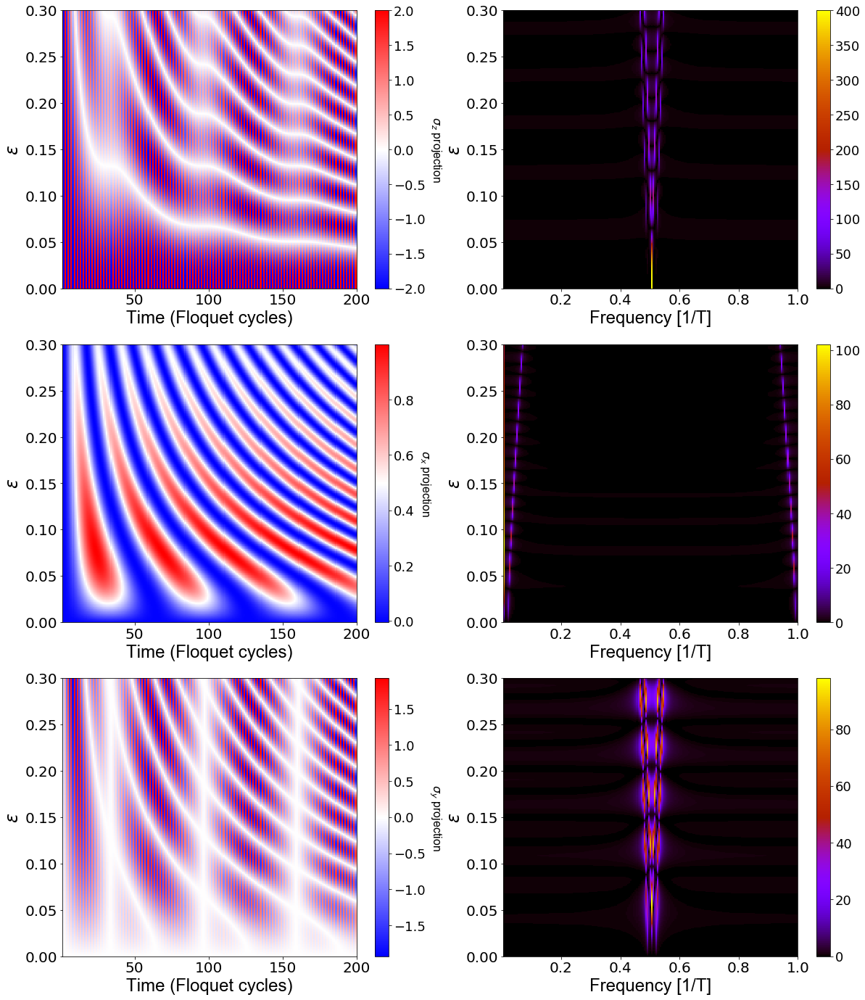

In [55]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/time_steps, eps, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, ObservablesX, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/time_steps, eps, np.abs(ObservablesX_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, eps, ObservablesY, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/time_steps, eps, np.abs(ObservablesY_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[2,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

# Bloch sphere visualization without last pi-pulse with last cycle XY Gate evolution

In [894]:
nSites = 2

eps=0.3   #unperfection of pulses
#alpha = np.pi/2-eps
alpha = [np.pi/2-eps, np.pi/2-eps]
w = 0.0                   #disorder
delta = deltaF(w, nSites)
g = np.pi/2                 #Interaction
T = 1                     # Period
time_steps = 51
times = np.linspace(1, time_steps, time_steps)

In [888]:
Initually_tmp = Final[15]

In [889]:
Initually_tmp

array([ 0.45131284-0.39048156j,  0.26714281-0.15423497j,
        0.26714281-0.15423497j, -0.54868716-0.39048156j])

In [898]:
#U=Ufunc(nSites,alpha,g, T, delta)
#U=UfuncZZ(nSites,alpha,g, T, delta)
#U=UfuncXX(nSites,alpha,g, T, delta)
U=Ufunc_alpha(nSites,alpha,g, T, delta)
phiInitFull = np.full((2**nSites), 0)
phiInitFull[0] = 1                             ##initial state
#phiInitFull[3] = 1/np.sqrt(2)

#phiInitFull = Initually_tmp

N=100

#Final = states_crop(phiInitFull,time_steps,N)                ## Evolution of states
Final = states_crop(phiInitFull,time_steps,N)                ## Evolution of states

f = IntProgress(min=0, max=time_steps) # instantiate the bar
display(f) # display the bar

sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
    sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
observables = []
observables_x = []
observables_y = []
for i in Final:
    observables_x.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real/nSites)
    observables_y.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real/nSites)
    observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real/nSites)
    f.value += 1

Widget Javascript not detected.  It may not be installed or enabled properly.


In [899]:
qubit_number = 1
b = Bloch()
#b.vector_color = ['b']
#b.view = [-40,30]
b.clear()
y=-np.sin(eps*2)
z=-np.cos(eps*2)
vec = ([observables_x[0], observables_y[0], observables[0]],[observables_x[1], observables_y[1], observables[1]],
       [observables_x[-1], observables_y[-1], observables[-1]])
b.add_vectors(vec)

for i in Final:
    b.add_points([observables_x,observables_y,observables],'m')

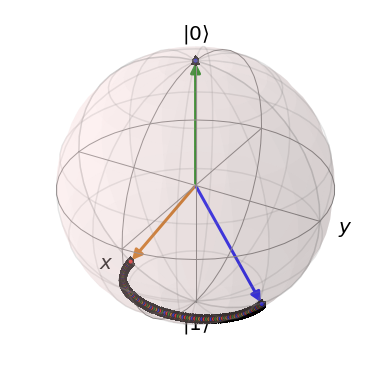

In [900]:
b.show()

# Cutting my dencity matrix

In [214]:
nSites = 2

eps_steps = 100
eps=np.linspace(0.00, 0.15, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                      #disorder
delta = deltaF(w, nSites)
g = 0.1                                #Interaction
T = 1  
time_steps = 100
times = np.linspace(1, time_steps, time_steps)

In [230]:
projection = 2

Observables = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

Observables1 = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables1_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

Observables2 = np.zeros((eps_steps,time_steps), dtype=np.float)
Observables2_fft = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc(nSites,alpha_value,g,T,delta)
    #U=UfuncZZ(nSites,alpha_value,g,T,delta)
    #U=UfuncXX(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, projection)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, projection)
       
    observables1 = []
    observables2 = []
    observables = []
      
    for i in Final:
        observables1.append(np.dot(np.dot(np.conjugate(i).T,tensorize1SiteMatrixKroneker(nSites, 1, projection)),i).real)
        observables2.append(np.dot(np.dot(np.conjugate(i).T,tensorize1SiteMatrixKroneker(nSites, 2, projection)),i).real)
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    Observables1_fft[alpha_id] = np.fft.fft(observables1)
    Observables1[alpha_id] = observables1
    Observables2_fft[alpha_id] = np.fft.fft(observables2)
    Observables2[alpha_id] = observables2

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:38: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:40: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: ComplexWarning: Casting complex values to real discards the imaginary part


In [231]:
plot(Observables[int(1000/0.15*0.0625)])

IndexError: index 416 is out of bounds for axis 0 with size 100

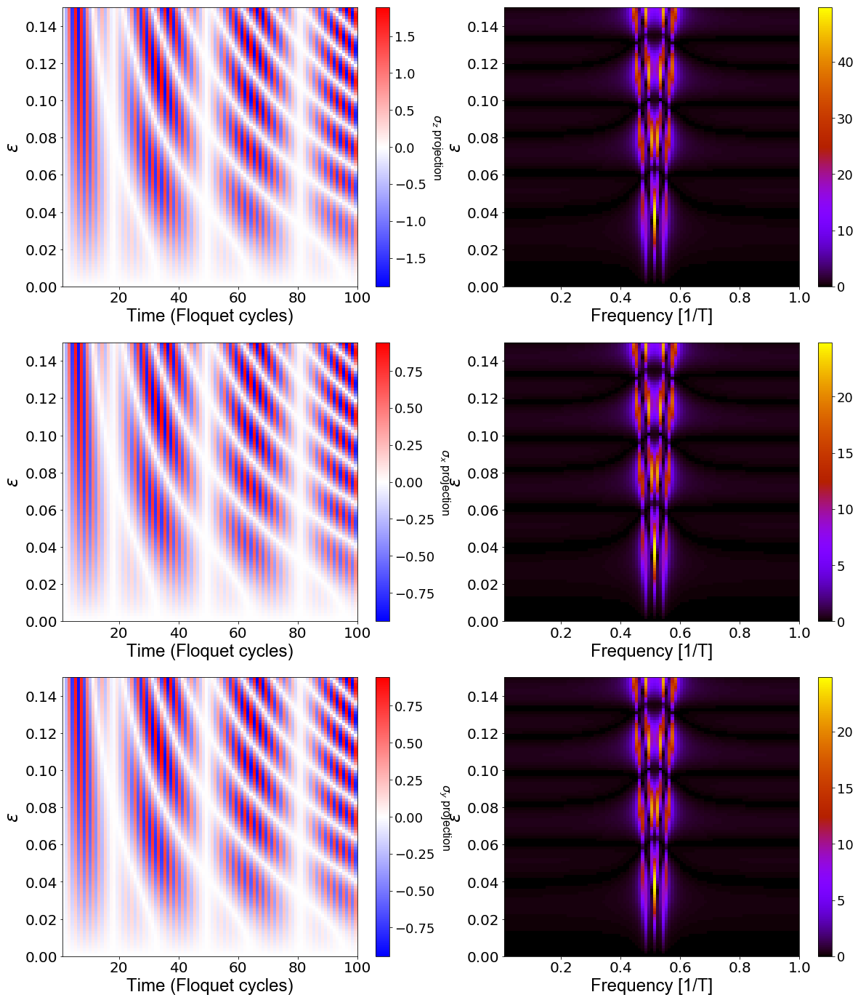

In [232]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/100, eps, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, Observables1, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/100, eps, np.abs(Observables1_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, eps, Observables2, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/100, eps, np.abs(Observables2_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[2,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

# Localization in time Zimuliren

In [43]:
nSites = 2


eps_steps = 100
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.05                                #Interaction
T = 1  
T_d = 3.0
time_steps = 100


nDeffects = 10
deffects = np.linspace(1,nDeffects,nDeffects)
grand_period = int(time_steps/nDeffects)

times = np.linspace(1, time_steps+nDeffects, time_steps+nDeffects)

In [40]:
Observables = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)
Observables_fft = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)

ObservablesX = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)
ObservablesX_fft = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)

ObservablesY = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)
ObservablesY_fft = np.zeros((eps_steps,time_steps+nDeffects), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar


sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)                              #projection matrixes
sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)

for i in range(2, nSites+1,1):
    sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
    sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
         
for alpha_id, alpha_value in enumerate(alpha): 
    
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    observablesX = []
    observablesY = []
    observables = []
    
    Final = states(phiInitFull,1)                ## first step of evolution
    for j in deffects:
        U=Ufunc(nSites,alpha_value,g,T,delta)
        Final = states(Final[-1],grand_period)                ## Evolution of states between two deffects
      
        for i in Final:
            observablesX.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real)
            observablesY.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real)
            observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)

        U=Ufunc(nSites,alpha_value,g,T_d,delta)
        Final = states(Final[-1],2)
        observablesX.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigXOp),i).real)
        observablesY.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigYOp),i).real)
        observables.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigZOp),i).real)
    
    f.value += 1
    
    Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    ObservablesX_fft[alpha_id] = np.fft.fft(observablesX)
    ObservablesX[alpha_id] = observablesX
    ObservablesY_fft[alpha_id] = np.fft.fft(observablesY)
    ObservablesY[alpha_id] = observablesY

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:50: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:52: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: ComplexWarning: Casting complex values to real discards the imaginary part


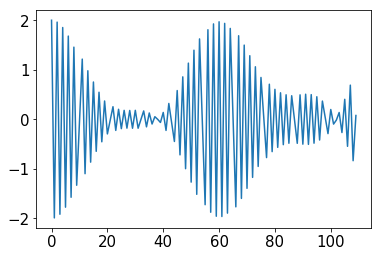

In [41]:
plot(Observables[int(100/0.2*0.048)])

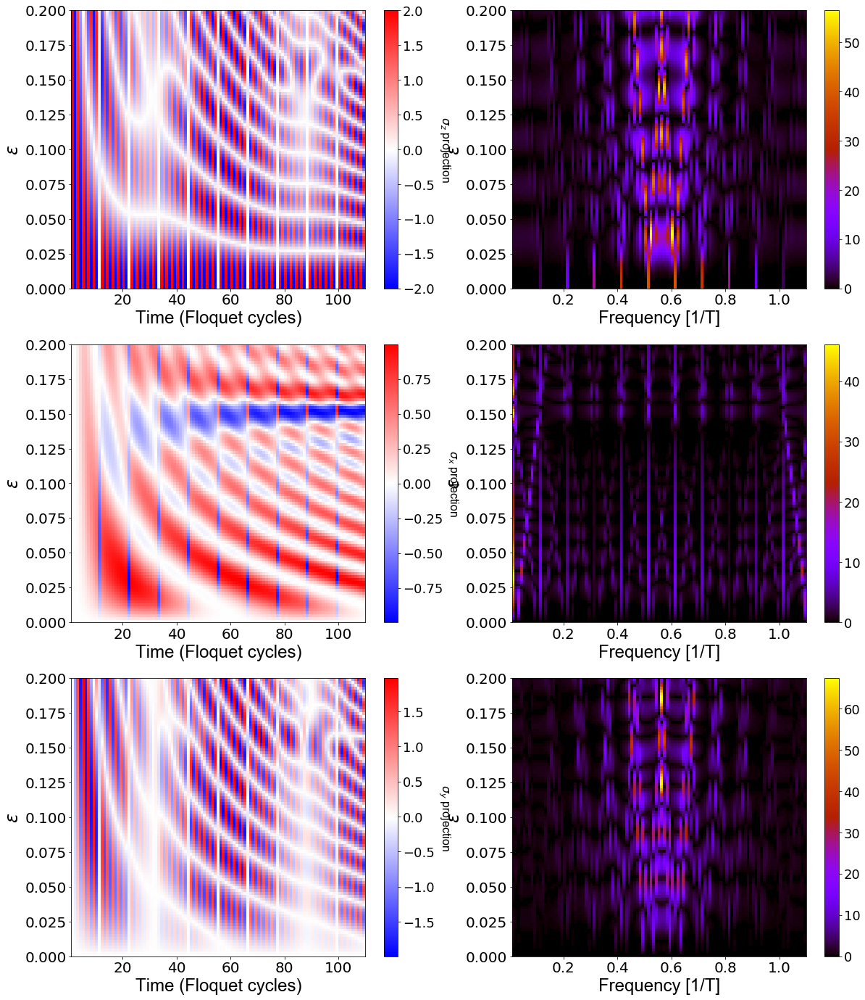

In [42]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/100, eps, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, ObservablesX, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/100, eps, np.abs(ObservablesX_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, eps, ObservablesY, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/100, eps, np.abs(ObservablesY_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[2,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

# Looking for an interesting deffect properties

In [687]:
nSites = 2

deffect_steps = 100
eps=0.045                          #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                        #disorder
delta = deltaF(w, nSites)
g = 0.1                                #Interaction
T = 1  
T_d = np.linspace(0.0, 6, deffect_steps)
time_steps = 100


nDeffects = 5
deffects = np.linspace(1,nDeffects,nDeffects)
grand_period = int(time_steps/nDeffects)

times = np.linspace(1, time_steps+nDeffects, time_steps+nDeffects)

In [688]:
Observables = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)
Observables_fft = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)

ObservablesX = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)
ObservablesX_fft = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)

ObservablesY = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)
ObservablesY_fft = np.zeros((deffect_steps,time_steps+nDeffects), dtype=np.float)

f = IntProgress(min=0, max=deffect_steps) # instantiate the bar
display(f) # display the bar

sigXOp = tensorize1SiteMatrixKroneker(nSites, 1, 1)
sigYOp = tensorize1SiteMatrixKroneker(nSites, 1, 2)
sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigXOp = sigXOp + tensorize1SiteMatrixKroneker(nSites, i, 1)
    sigYOp = sigYOp + tensorize1SiteMatrixKroneker(nSites, i, 2)
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
for T_d_id, T_d_value in enumerate(T_d): 
    U=Ufunc(nSites,alpha,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    observablesX = []
    observablesY = []
    observables = []
    
    Final = states(phiInitFull,1)                ## Evolution of states
    for j in deffects:
        Final = states(Final[-1],grand_period)                ## Evolution of states
      
        for i in Final:
            observablesX.append(np.dot(np.dot(np.conjugate(i).T,sigXOp),i).real)
            observablesY.append(np.dot(np.dot(np.conjugate(i).T,sigYOp),i).real)
            observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        #print(alpha_id)
        U=Ufunc(nSites,alpha_value,g,T_d_value,delta)
        Final = states(Final[-1],2)
        observablesX.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigXOp),i).real)
        observablesY.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigYOp),i).real)
        observables.append(np.dot(np.dot(np.conjugate(Final[-1]).T,sigZOp),i).real)
    
    f.value += 1
    
    Observables_fft[T_d_id] = np.fft.fft(observables)
    Observables[T_d_id] = observables
    ObservablesX_fft[T_d_id] = np.fft.fft(observablesX)
    ObservablesX[T_d_id] = observablesX
    ObservablesY_fft[T_d_id] = np.fft.fft(observablesY)
    ObservablesY[T_d_id] = observablesY

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:47: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:51: ComplexWarning: Casting complex values to real discards the imaginary part


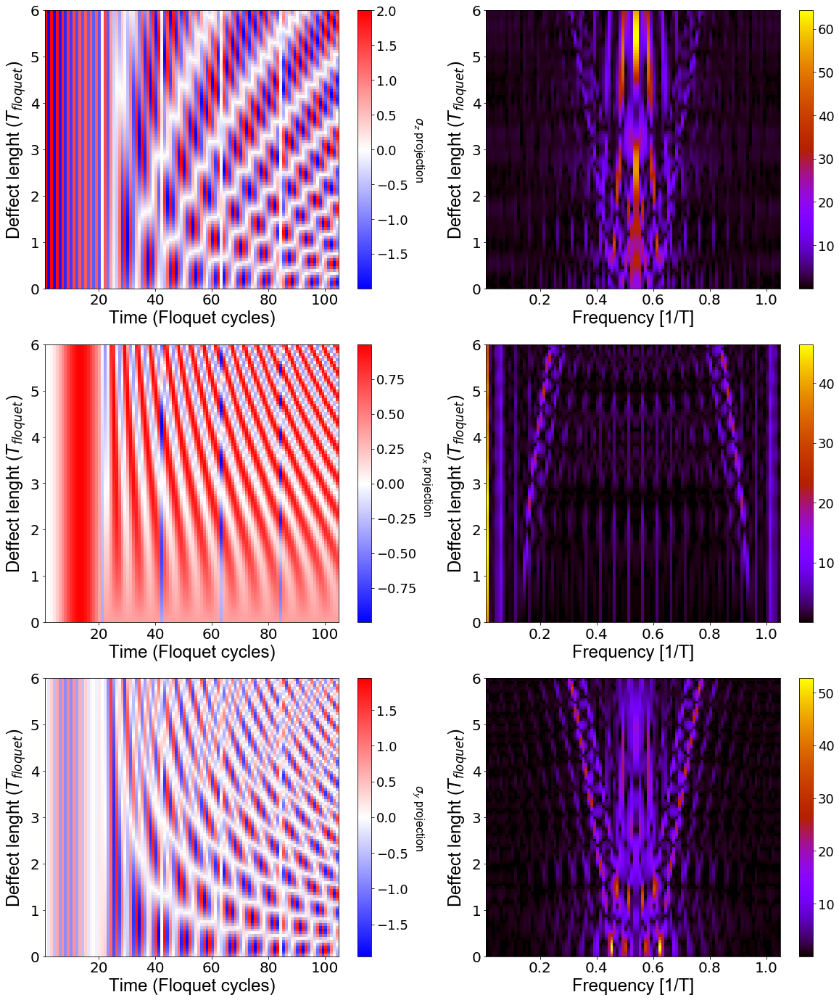

In [689]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(20, 24))

p = axes[0,0].pcolor(times, T_d, Observables, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times/time_steps, T_d, np.abs(Observables_fft), cmap=cm.gnuplot)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, T_d, ObservablesX, cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times/time_steps, T_d, np.abs(ObservablesX_fft), cmap=cm.gnuplot)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[2,0].pcolor(times, T_d, ObservablesY, cmap=cm.bwr)

axes[2,0].axis('tight')
axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[2,0].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

axes[2,0].tick_params(axis='x', labelsize=20)
axes[2,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2,0])
cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[2,1].pcolor(times/time_steps, T_d, np.abs(ObservablesY_fft), cmap=cm.gnuplot)

axes[2,1].tick_params(axis='x', labelsize=20)
axes[2,1].tick_params(axis='y', labelsize=20)

axes[2,1].set_xlabel(r'Frequency [1/T]', fontsize=24, **hfont)
axes[2,1].set_ylabel(r'Deffect lenght ($T_{floquet}$)', fontsize=24, **hfont)

#axes[2,1].set_xlim((0.4, 0.6))
#axes[2,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

# Epsilon dependence for different N

In [146]:
N_steps = 2
#nSites = np.linspace(2, N_steps, N_steps-1)
nSites=[3,5]

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                        #disorder
g = 0.05                                #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [147]:
nSites

[3, 5]

In [148]:
Observables = np.zeros((N_steps,eps_steps,time_steps), dtype=np.float)

for N_id, N_value in enumerate(nSites):
    delta = deltaF(w, N_value)
    #print (N_id)
    print ('Number of spins', N_value)
    f = IntProgress(min=0, max=eps_steps) # instantiate the bar
    display(f) # display the bar
    
    for alpha_id, alpha_value in enumerate(alpha): 
        U=Ufunc_all_to_all(N_value,alpha_value,g,T,delta)
        phiInitFull = np.full((2**N_value), 0)
        phiInitFull[0] = 1                             ##initial state

        Final = states(phiInitFull,time_steps)                ## Evolution of states

        sigZOp = tensorize1SiteMatrixKroneker(N_value, 1, 3)
        for i in range(2, N_value+1,1):
            sigZOp = sigZOp + tensorize1SiteMatrixKroneker(N_value, i, 3)

        observables = []
      
        for i in Final:
            observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        #print(alpha_id)
        f.value += 1
        Observables[N_id,alpha_id] = observables
        
    
#g = 0.0
#delta = deltaF(w, 2)
#print ('Number of spins', 1)
#f = IntProgress(min=0, max=eps_steps) # instantiate the bar
#display(f) # display the bar

#for alpha_id, alpha_value in enumerate(alpha): 
#    U=Ufunc(2,alpha_value,g,T,delta)

#    phiInitFull = np.full((2**2), 0)
#    phiInitFull[0] = 1                             ##initial state

#    Final = states(phiInitFull,time_steps)                ## Evolution of states

#    sigZOp = tensorize1SiteMatrixKroneker(2, 1, 3)
#    for i in range(2, 2+1,1):
#        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(2, i, 3)
       
#    observables = []
      
#    for i in Final:
#        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)

#    f.value += 1
#    Observables[0,alpha_id] = observables

Number of spins 3


Number of spins 5


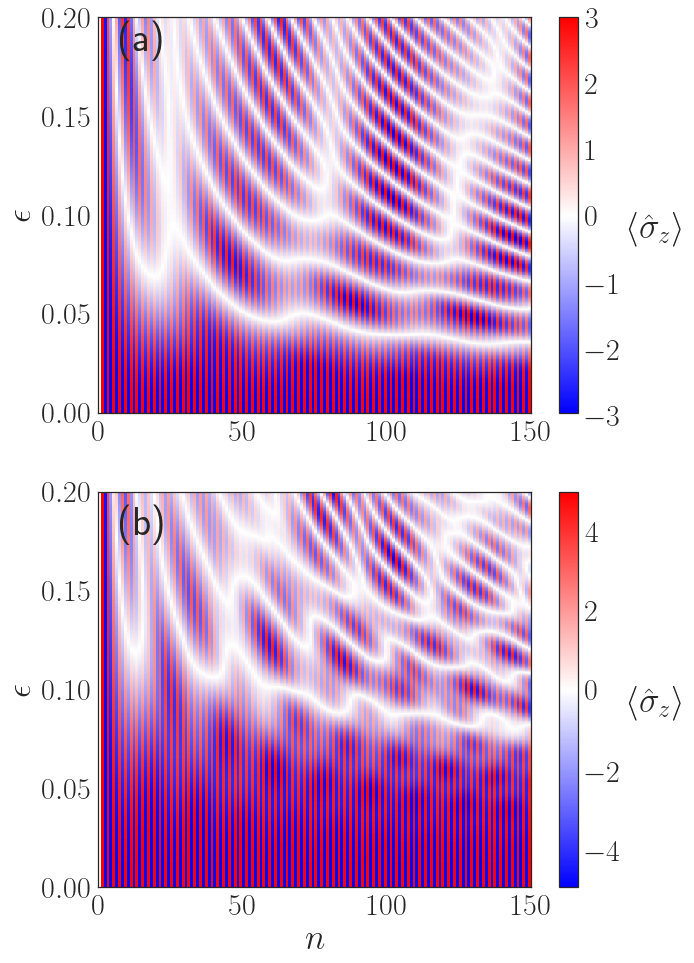

In [150]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(2,1,figsize=(9.7, 16))

p = axes[0].pcolor(times, eps, Observables[0], cmap=cm.bwr)

axes[0].axis('tight')
#axes[0].set_xlabel(r'n', fontsize=35, **hfont)
axes[0].set_ylabel(r'$\epsilon$', fontsize=35, **hfont)


axes[0].tick_params(axis='x', labelsize=30)
axes[0].tick_params(axis='y', labelsize=30)

cb = fig.colorbar(p, ax=axes[0])
cb.set_label(r'$\langle \hat{\sigma}_z \rangle$', labelpad=35, rotation=0, fontsize=35, **hfont)
cb.ax.tick_params(labelsize=30) 
#cb.remove()

p = axes[1].pcolor(times, eps, Observables[1], cmap=cm.bwr)

axes[1].tick_params(axis='x', labelsize=30)
axes[1].tick_params(axis='y', labelsize=30)

axes[1].set_xlabel(r'$n$', fontsize=35, **hfont)
axes[1].set_ylabel(r'$\epsilon$', fontsize=35, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1])
cb.set_label(r'$\langle \hat{\sigma}_z \rangle$', labelpad=35, rotation=0, fontsize=35, **hfont)
cb.ax.tick_params(labelsize=30) 

ymin, ymax = axes[0].get_ylim()
axes[0].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))
ymin, ymax = axes[1].get_ylim()
axes[1].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

#axes[0,0].set_title(str(1)+' spin')
#axes[0].set_title(str(int(nSites[0]))+' spins')
#axes[1].set_title(str(int(nSites[1]))+' spins')
#axes[2,0].set_title(str(int(nSites[3]))+' spins')
#axes[2,1].set_title(str(int(nSites[4]))+' spins')

xmin, xmax = axes[0].get_xlim()
axes[0].set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))

xmin, xmax = axes[1].get_xlim()
axes[1].set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))

#axes[1].set_yticklabels([])

matplotlib.pyplot.text(7, 0.183, '(b)', fontsize=40, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(7, 0.428, '(a)', fontsize=40, weight="black",  verticalalignment='center')

plt.gcf().set_size_inches(9.7, 16)
plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/Fig5.pdf", bbox_inches="tight")

IndexError: too many indices for array

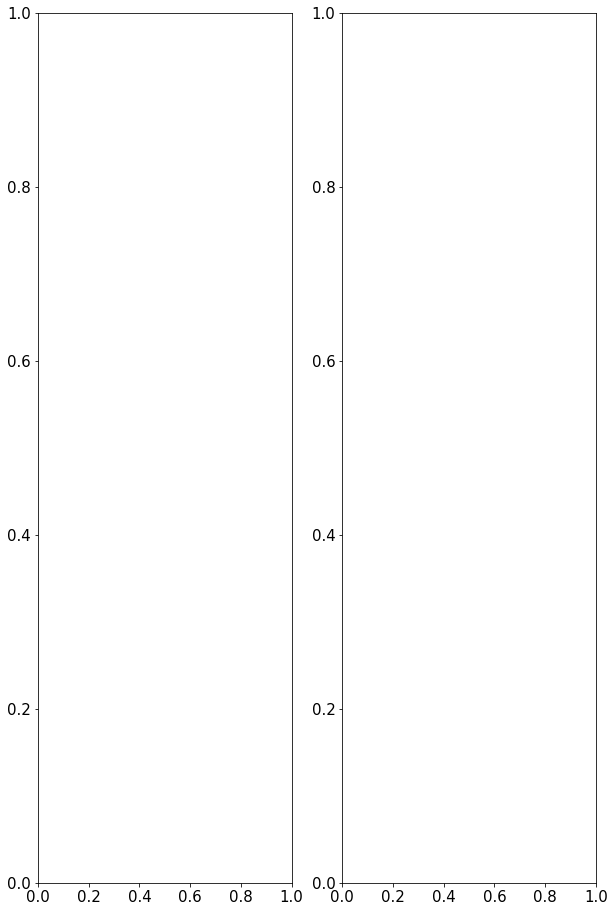

In [56]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(2,2,figsize=(20, 16))

p = axes[0,0].pcolor(times, eps, Observables[0]/2, cmap=cm.bwr)

axes[0,0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0,0].tick_params(axis='x', labelsize=20)
axes[0,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0,0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[0,1].pcolor(times, eps, Observables[1], cmap=cm.bwr)

axes[0,1].tick_params(axis='x', labelsize=20)
axes[0,1].tick_params(axis='y', labelsize=20)

axes[0,1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[0,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[0,1])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
p = axes[1,0].pcolor(times, eps, Observables[2], cmap=cm.bwr)

axes[1,0].axis('tight')
axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

axes[1,0].tick_params(axis='x', labelsize=20)
axes[1,0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1,0])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

p = axes[1,1].pcolor(times, eps, Observables[3], cmap=cm.bwr)

axes[1,1].tick_params(axis='x', labelsize=20)
axes[1,1].tick_params(axis='y', labelsize=20)

axes[1,1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[1,1].set_xlim((0.4, 0.6))
#axes[1,1].set_xlim((0.4, 0.6))

cb = fig.colorbar(p, ax=axes[1,1])
cb.set_label(r'$\sigma_x$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

#---------------------------------------------------------------------------
#p = axes[2,0].pcolor(times, eps, Observables[4], cmap=cm.bwr)

#axes[2,0].axis('tight')
#axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
#axes[2,0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#axes[2,0].tick_params(axis='x', labelsize=20)
#axes[2,0].tick_params(axis='y', labelsize=20)

#cb = fig.colorbar(p, ax=axes[2,0])
#cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
#cb.ax.tick_params(labelsize=18) 

#p = axes[2,1].pcolor(times, eps, Observables[5], cmap=cm.bwr)

#axes[2,1].tick_params(axis='x', labelsize=20)
#axes[2,1].tick_params(axis='y', labelsize=20)

#axes[2,1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
#axes[2,1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

#cb = fig.colorbar(p, ax=axes[2,1])
#cb.set_label(r'$\sigma_y$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
#cb.ax.tick_params(labelsize=18) 


#axes[0,0].set_title(str(1)+' spin')
axes[0,0].set_title(str(int(nSites[0]))+' spins')
axes[0,1].set_title(str(int(nSites[1]))+' spins')
axes[1,0].set_title(str(int(nSites[2]))+' spins')
axes[1,1].set_title(str(int(nSites[2]))+' spins')
#axes[2,0].set_title(str(int(nSites[3]))+' spins')
#axes[2,1].set_title(str(int(nSites[4]))+' spins')


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,16)
#plt.savefig("C:/neon/Simulated_TC_3D_1-2-3-5.pdf", bbox_inches="tight")

# Variable Parameters  - epsilons for 2 spins and crossections and density matrix

In [14]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                       #disorder
delta = deltaS(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [15]:
delta

[0, 0.0]

In [16]:
Observables = np.zeros((eps_steps,time_steps), dtype=np.float)
Statess = np.zeros((eps_steps,time_steps,2**nSites), dtype=list)
Vectorrs = np.zeros((eps_steps,time_steps), dtype=np.float)
RHO = np.zeros((eps_steps,time_steps,2**nSites,2**nSites), dtype=list)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar

sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states
    
    rho_s = []        
    observables = []
    vectorrs = []
      
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        rho_s.append(density_Matrix(i))
        vectorrs.append(Partial_Entropy(i))
    Statess[alpha_id] = Final   
    #print(alpha_id)
    f.value += 1
    #Observables_fft[alpha_id] = np.fft.fft(observables)
    Observables[alpha_id] = observables
    RHO[alpha_id] = rho_s
    Vectorrs[alpha_id] = vectorrs

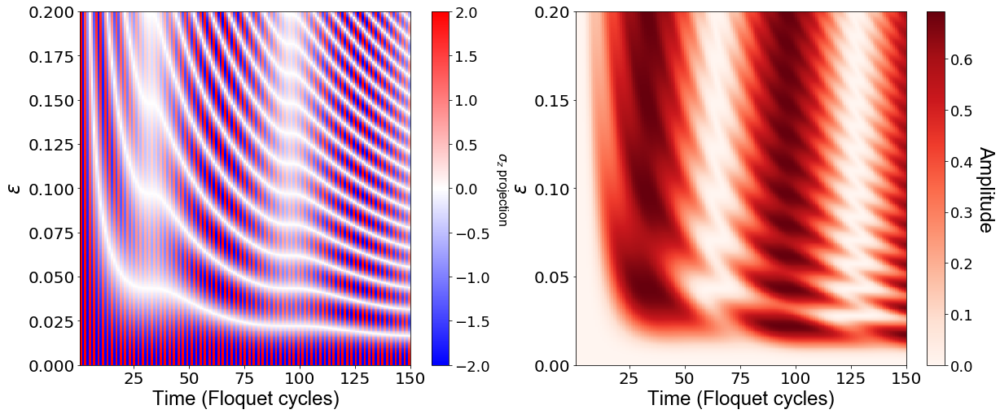

In [48]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,2,figsize=(20, 8))

p = axes[0].pcolor(times, eps, Observables, cmap=cm.bwr)

axes[0].axis('tight')
axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0].tick_params(axis='x', labelsize=20)
axes[0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[1].pcolor(times, eps, Vectorrs, cmap=cm.Reds)

axes[1].tick_params(axis='x', labelsize=20)
axes[1].tick_params(axis='y', labelsize=20)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


cb = fig.colorbar(p, ax=axes[1])
cb.set_label(r'Amplitude', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes[1].get_ylim()
axes[1].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))




#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,24)
#plt.savefig("C:/neon/Simulated TC_3D_1spins_g=0_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

In [49]:
0.2/500*109

0.0436

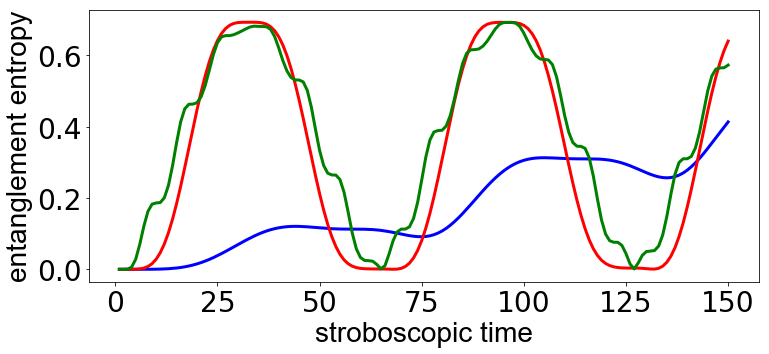

In [26]:
number =   109    #109

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(12, 4))

p = axes.plot(times, Vectorrs[30], 'b', linewidth=3.0)

p = axes.plot(times, Vectorrs[109], 'r', linewidth=3.0)

p = axes.plot(times, Vectorrs[450], 'g', linewidth=3.0)

axes.set_xlabel(r'stroboscopic time', fontsize=28, **hfont)
axes.set_ylabel(r'entanglement entropy', fontsize=28, **hfont)

axes.tick_params(axis='x', labelsize=28)
axes.tick_params(axis='y', labelsize=28)

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(0, 150, 7), 2))

#xmin, xmax = axes.get_xlim()
#axes.set_xticks(np.round(np.linspace(xmin, xmax, 8), 2))

#plt.gcf().set_size_inches(12,5)
#plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/EntropyCuts.pdf", bbox_inches="tight")

In [49]:
0.2/500*109

0.0436

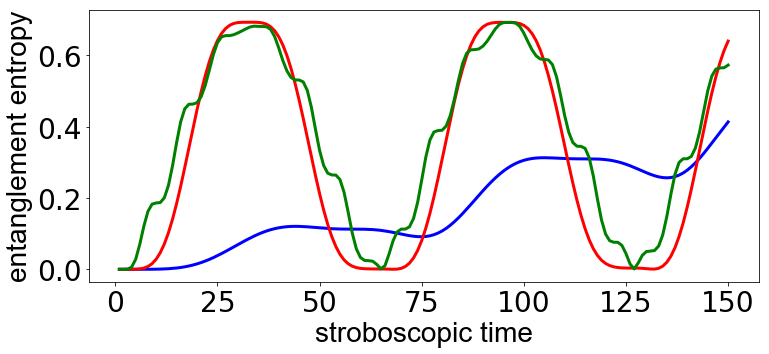

In [26]:
number =   109    #109

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(12, 4))

p = axes.plot(times, Vectorrs[30], 'b', linewidth=3.0)

p = axes.plot(times, Vectorrs[109], 'r', linewidth=3.0)

p = axes.plot(times, Vectorrs[450], 'g', linewidth=3.0)

axes.set_xlabel(r'stroboscopic time', fontsize=28, **hfont)
axes.set_ylabel(r'entanglement entropy', fontsize=28, **hfont)

axes.tick_params(axis='x', labelsize=28)
axes.tick_params(axis='y', labelsize=28)

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(0, 150, 7), 2))

#xmin, xmax = axes.get_xlim()
#axes.set_xticks(np.round(np.linspace(xmin, xmax, 8), 2))

#plt.gcf().set_size_inches(12,5)
#plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/EntropyCuts.pdf", bbox_inches="tight")

In [20]:
70/500*0.2

0.028000000000000004

In [21]:
0.047*500/0.20

117.5

In [22]:
for i in range(0, 99,1):
    print (i)
    print (Vectorrs[109][i])
    print (Statess[109][i])
    print (" ")

0
-0.0
[(1+0j) 0j 0j 0j]
 
1
1.0171224224695298e-16
[(0.0013956034370731013-0.001300139221463081j)
 (-0.029741131867846-0.03192490863440108j)
 (-0.02974113186784597-0.03192490863440105j)
 (-0.7302932654367478+0.680338620801871j)]
 
2
1.12541176599962e-06
[(0.9943988665511199+0.002136310244951426j)
 (0.046069703314582475+0.04374264198458247j)
 (0.0026225668128236654+0.08421784054432792j)
 (-0.0038286828753284876+0.004038905037613003j)]
 
3
2.124028744545311e-05
[(0.012091400965610946-0.004887750038011734j)
 (-0.09253145902769912-0.08661637169973538j)
 (-0.04072443649340793-0.09425980984499455j)
 (-0.7225098516409976+0.6717153891106088j)]
 
4
0.00014801839715023753
[(0.9778992746940937+0.006150323406529887j)
 (0.10082559171843326+0.07494237371910814j)
 (0.016111770492271582+0.16475987117419158j)
 (-0.01413584994566018+0.016964557150591773j)]
 
5
0.000585671878885951
[(0.03289491335611967-0.011360345131957227j)
 (-0.15907329023988234-0.12971809761731828j)
 (-0.06571438741287552-0.15166432

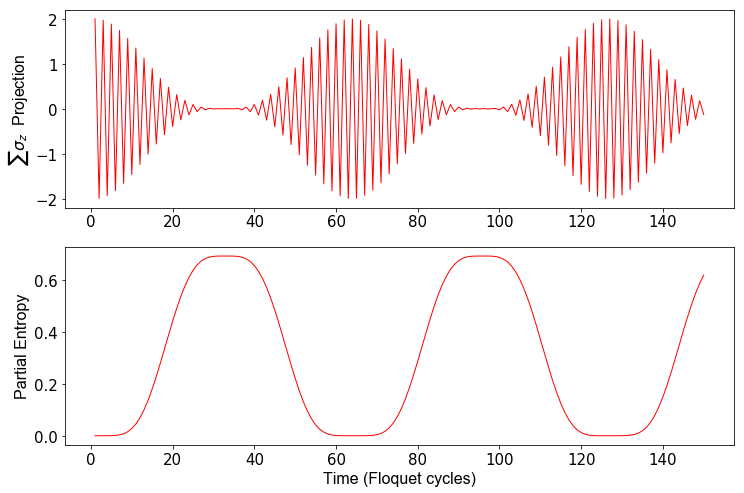

In [51]:
number =   108    #109

hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(2,1,figsize=(12, 8))

p = axes[0].plot(times, Observables[number], 'r', linewidth=1.0)

#axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[0].set_ylabel(r'$\sum\sigma_z$  Projection', fontsize=16, **hfont)

p = axes[1].plot(times, Vectorrs[number], 'r', linewidth=1.0)

axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[1].set_ylabel(r'Partial Entropy', fontsize=16, **hfont)


In [39]:
Observables[248][125]

-0.007628876004306118

Density matrix visualization

In [18]:
def real_imagination(matrix):
    new_re = np.zeros((size(matrix[0]),size(matrix[0])), dtype=np.float)
    new_im = np.zeros((size(matrix[0]),size(matrix[0])), dtype=np.float)
    for i in arange(size(matrix[0])):
        for j in arange(size(matrix[0])):
            new_re[i][j] = matrix[i][j].real
            new_im[i][j] = matrix[i][j].imag
    return new_re, new_im    

In [42]:
Test = RHO[248][125]

In [23]:
matrix_chop(real_imagination(Test)[0])

[[0.487, 0.159, 0.026, -0.325],
 [0.159, 0.052, 0, -0.114],
 [0.026, 0, 0, 0],
 [-0.325, -0.114, 0, 0.458]]

In [24]:
matrix_chop(real_imagination(Test)[1])

[[0, -0.011, 0.022, 0.342],
 [0.011, 0, 0, 0.105],
 [-0.022, 0, 0, 0.033],
 [-0.342, -0.105, -0.033, 0]]

In [25]:
Statess[109][39]

array([(0.4699374535214892-0.5161165430877055j),
       (0.16485854463861954-0.158287951876624j),
       (0.001179140878096235-0.04898197878447039j),
       (-0.6767116492153709+0.014484732535625818j)], dtype=object)

In [26]:
U=Ufunc_all_to_all(nSites,alpha[109],g,T,delta)
evals, evecs = la.eig(U)
Fl_vec = evecs.T
print(Fl_vec)

[[ 0.62036063+0.j          0.2588275 -0.21944321j  0.35729084+0.01580784j
   0.44632965-0.41579912j]
 [-0.25810056-0.22026001j  0.62038329+0.j          0.44473819+0.41746899j
  -0.35732256+0.01556842j]
 [ 0.70271151+0.j          0.05451012-0.05709599j -0.09970145+0.00347076j
  -0.5121889 +0.47715337j]
 [-0.05514674-0.05637108j  0.70267082+0.j         -0.51131056-0.47815274j
   0.0997242 +0.00462818j]]


In [31]:
np.log(2)

0.6931471805599453

In [32]:
Vectorrs[109][39]

0.641309547922713

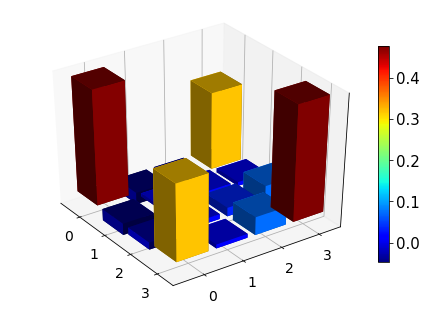

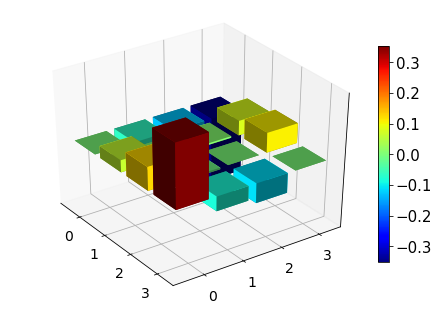

In [43]:
p = matrix_histogram(real_imagination(Test)[0])
p = matrix_histogram(real_imagination(Test)[1])

C:\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


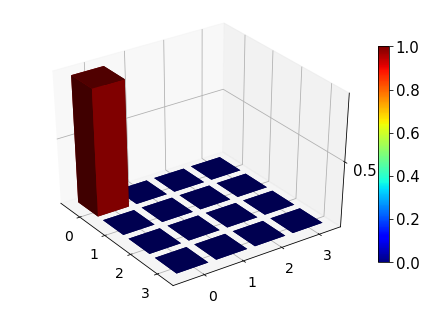

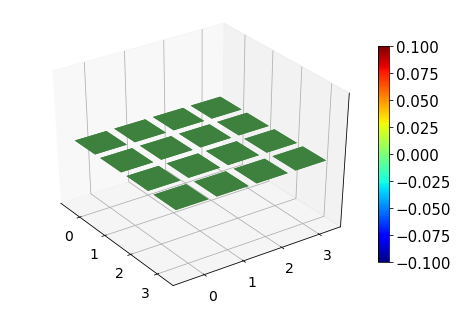

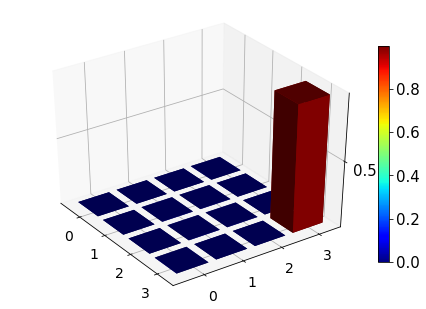

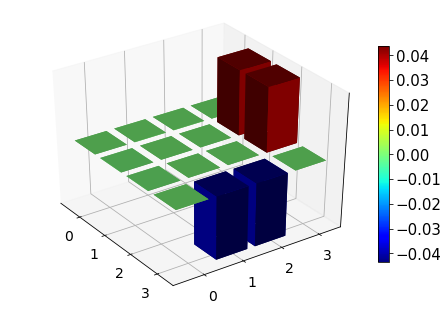

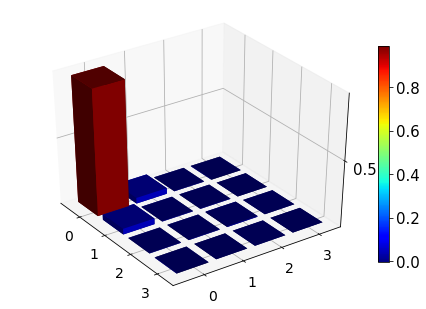

...

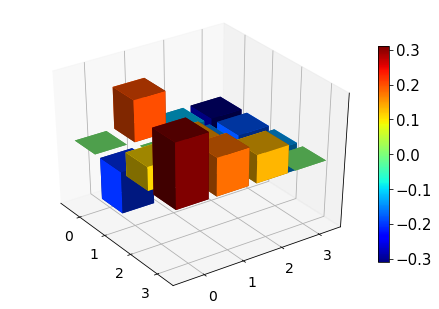

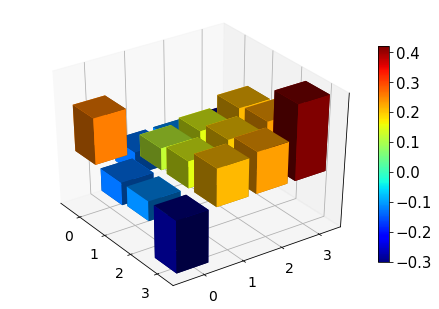

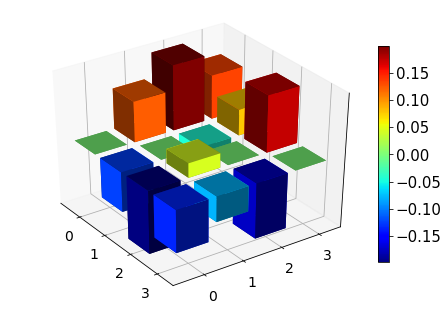

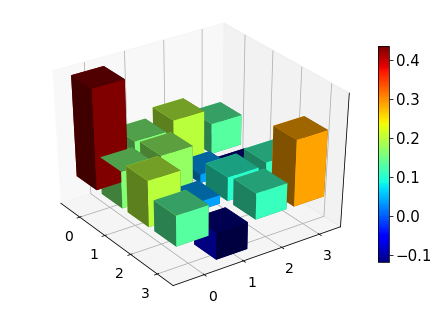

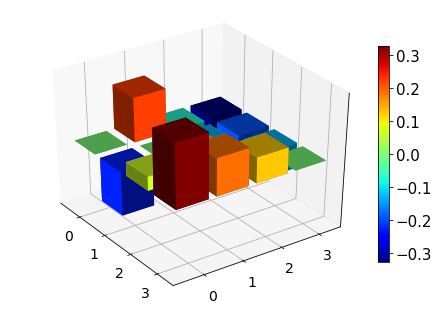

In [61]:
for i in arange(25):
    p = matrix_histogram(real_imagination(RHO[109][i])[0])
    p = matrix_histogram(real_imagination(RHO[109][i])[1])

-0.0
0.18613813878825194
0.46348965746206644
0.655556200658167


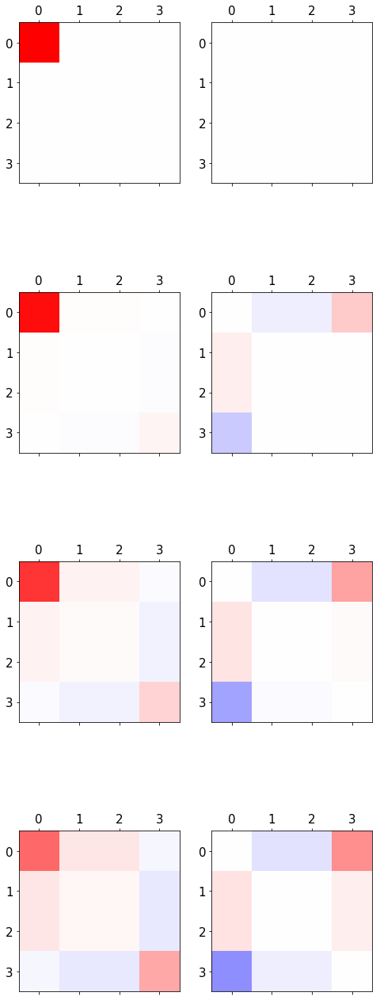

In [110]:
names = ['00', '01', '10', '11']

compare = [5,14,23]    #slope
compare = [0,9,18,27]    #platou

hfont = {'fontname':'Arial'}
fig, ax = plt.subplots(4,2,figsize=(8, 24))
    
cax = ax[0,0].matshow(real_imagination(RHO[450][compare[0]])[0], vmin=-1, vmax=1, cmap=cm.bwr)
cax = ax[0,1].matshow(real_imagination(RHO[450][compare[0]])[1], vmin=-1, vmax=1, cmap=cm.bwr)
print (Vectorrs[450][compare[0]])
cax = ax[1,0].matshow(real_imagination(RHO[450][compare[1]])[0], vmin=-1, vmax=1, cmap=cm.bwr)
cax = ax[1,1].matshow(real_imagination(RHO[450][compare[1]])[1], vmin=-1, vmax=1, cmap=cm.bwr)
print (Vectorrs[450][compare[1]])
cax = ax[2,0].matshow(real_imagination(RHO[450][compare[2]])[0], vmin=-1, vmax=1, cmap=cm.bwr)
cax = ax[2,1].matshow(real_imagination(RHO[450][compare[2]])[1], vmin=-1, vmax=1, cmap=cm.bwr)
print (Vectorrs[450][compare[2]])
cax = ax[3,0].matshow(real_imagination(RHO[450][compare[3]])[0], vmin=-1, vmax=1, cmap=cm.bwr)
cax = ax[3,1].matshow(real_imagination(RHO[450][compare[3]])[1], vmin=-1, vmax=1, cmap=cm.bwr)
print (Vectorrs[450][compare[3]])



#ticks = numpy.arange(0,4,1)

#ax[0].set_xticks(ticks)
#ax[0].set_yticks(ticks)
#ax[0].set_xticklabels(names)
#ax[0].set_yticklabels(names)
#ax[1].set_xticks(ticks)
#ax[1].set_yticks(ticks)
#ax[1].set_xticklabels(names)

#ax[1].set_yticklabels(names)
#plt.show()



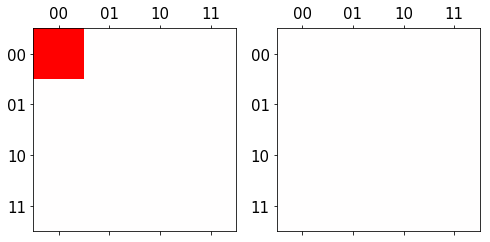

0
-0.0


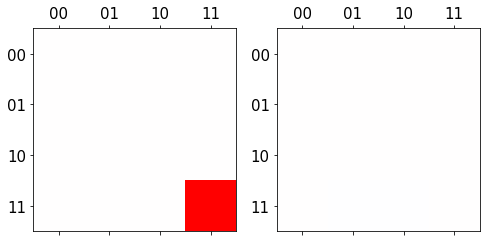

1
2.3723743896575943e-16


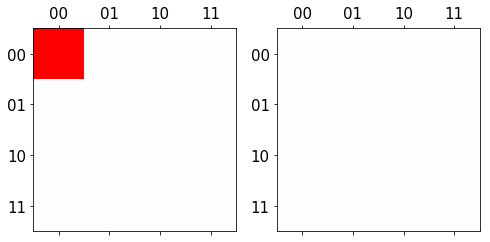

2
0.0004315592275204626


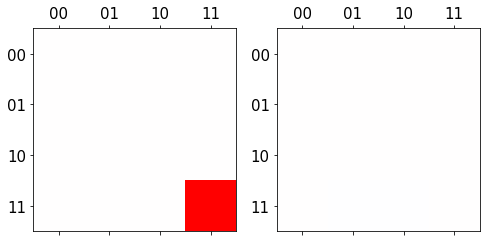

3
0.006360249264255863


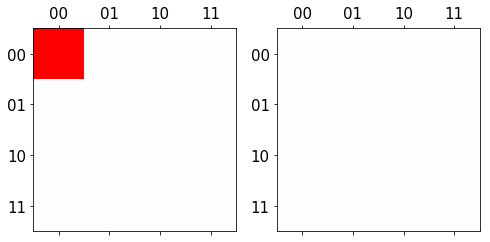

4
0.028448496954212685


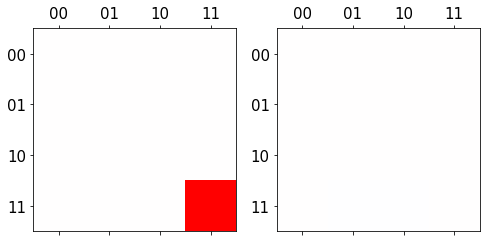

5
0.07064224225863648


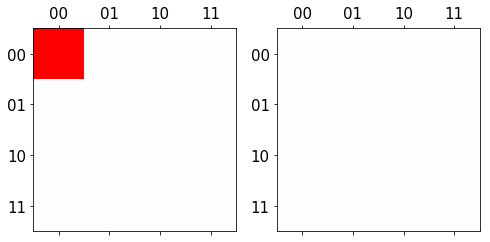

6
0.12163300537450172


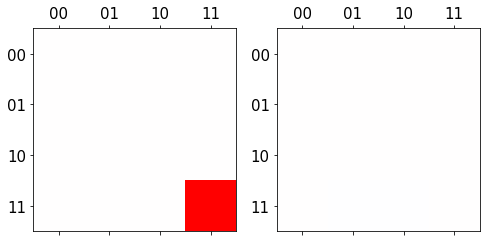

7
0.16272524800382235


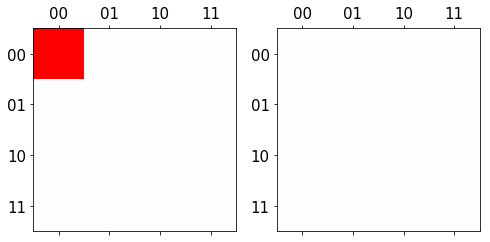

8
0.1828407641322043


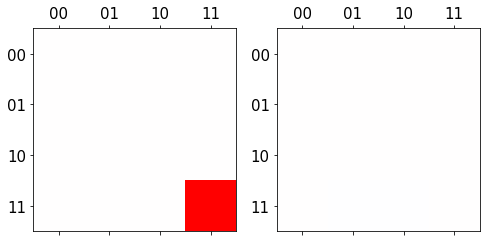

9
0.18613813878825194


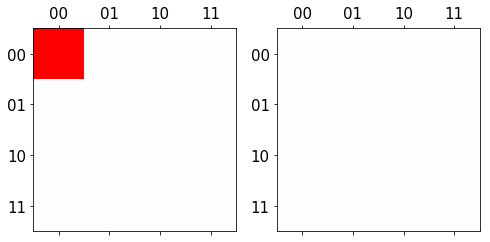

10
0.18724152315341963


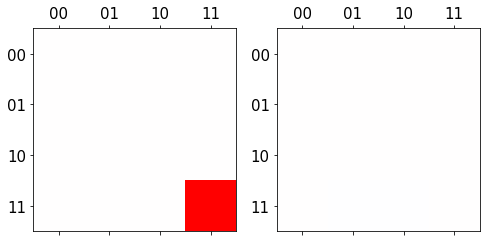

11
0.20076126946226638


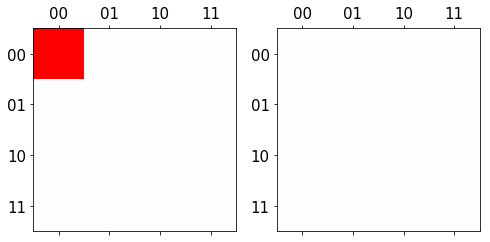

12
0.2349319340954963


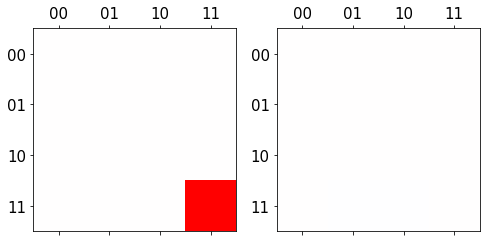

13
0.28976160731247946


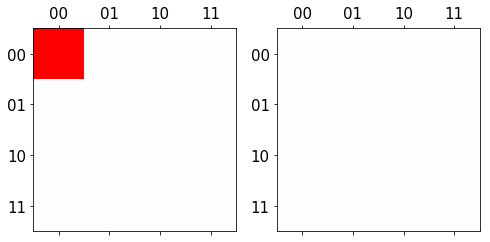

14
0.35521194212553725


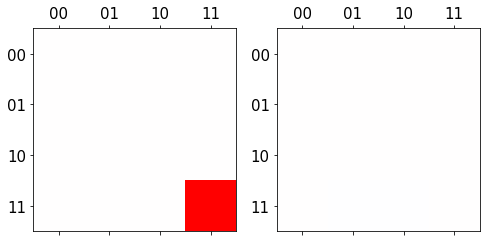

15
0.4136599621518496


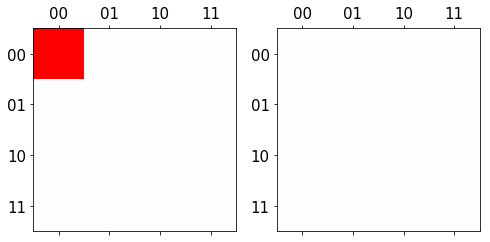

16
0.45020212585840125


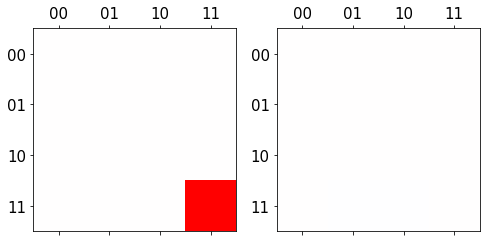

17
0.46295601798492225


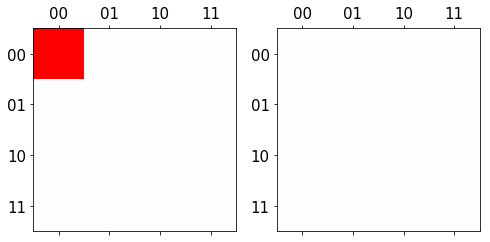

18
0.46348965746206644


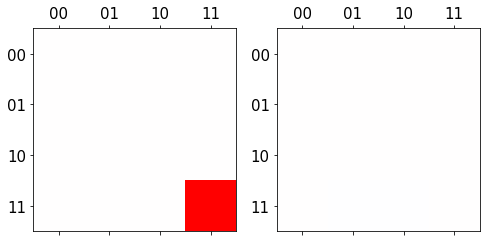

19
0.4672353521358339


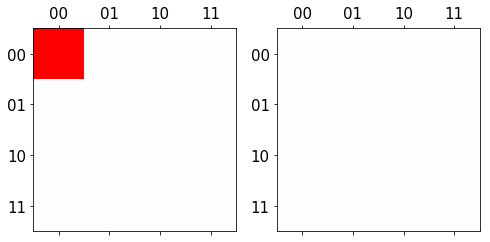

20
0.4838794939880806


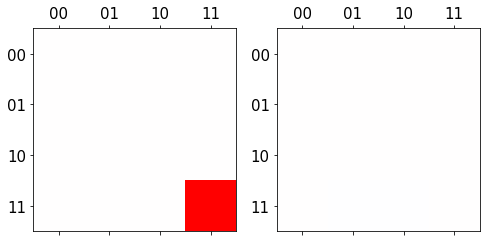

21
0.5154693892562435


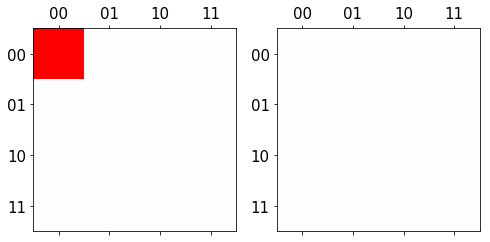

22
0.558075688012752


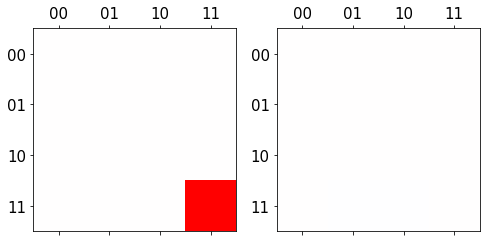

23
0.6021137124809002


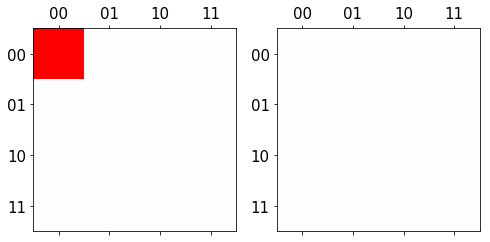

24
0.6355801069151656


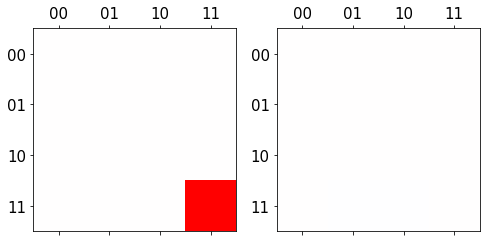

25
0.6520487164500159


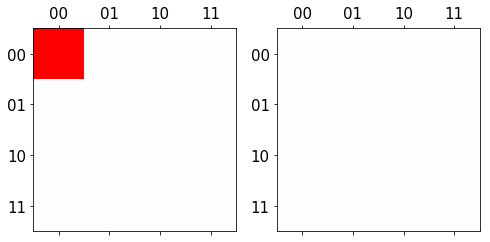

26
0.655516074680596


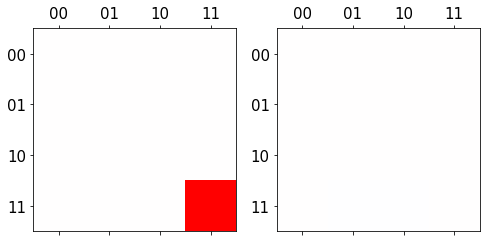

27
0.655556200658167


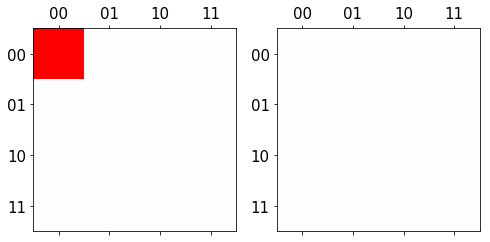

28
0.6581366026257462


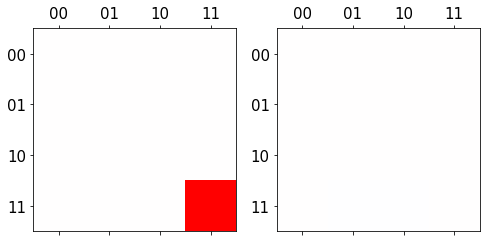

29
0.6630651967367858


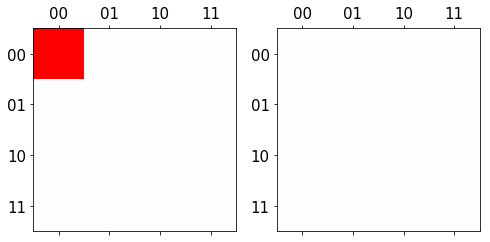

30
0.6687227877207875


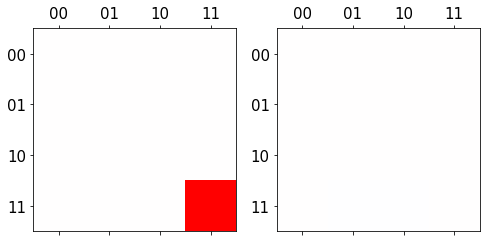

31
0.6747357836788601


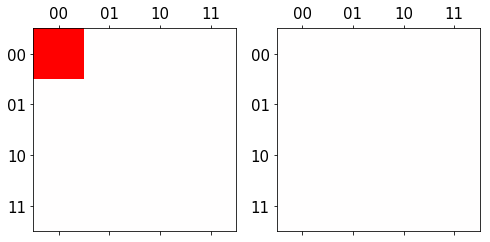

32
0.6798991376910911


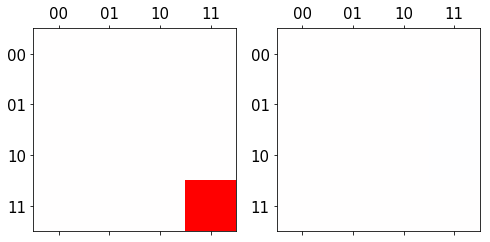

33
0.6820329427692808


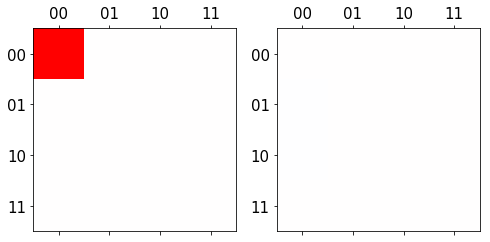

34
0.6814827434586979


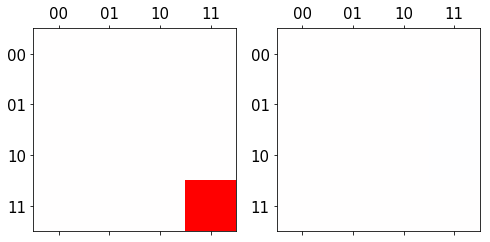

35
0.6811190167343009


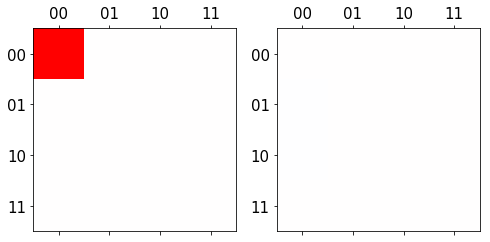

36
0.680530264222557


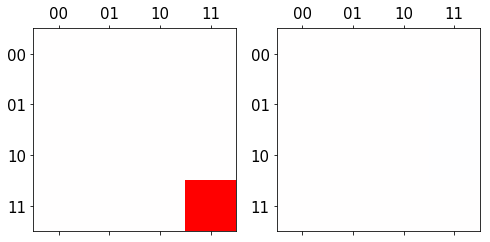

37
0.673253294738444


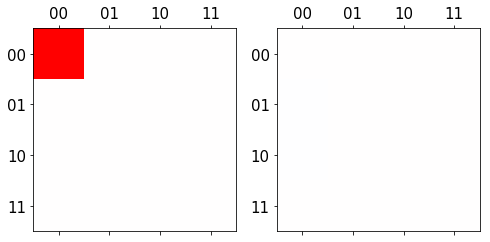

38
0.6529761484403136


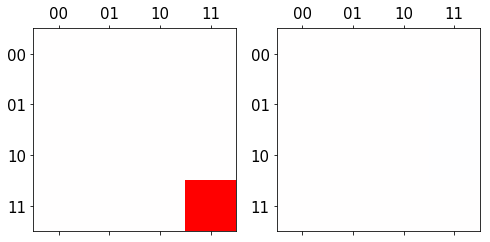

39
0.6210968485680018


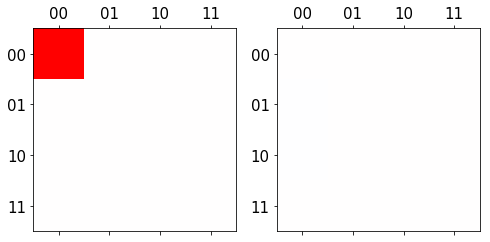

40
0.5861121515006037


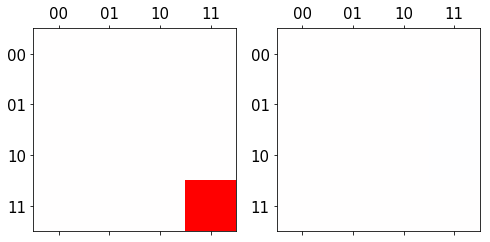

41
0.5568337887825202


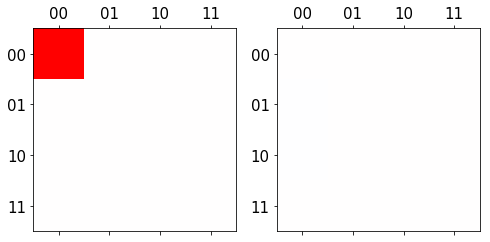

42
0.5381907904074276


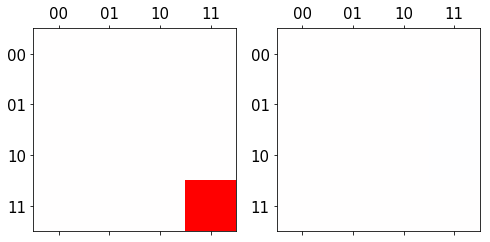

43
0.5311298901965271


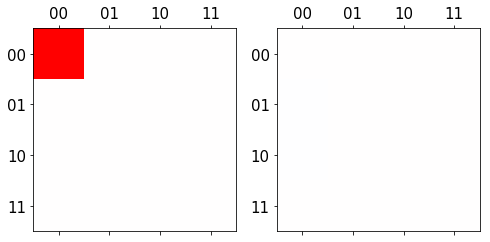

44
0.5309787724514305


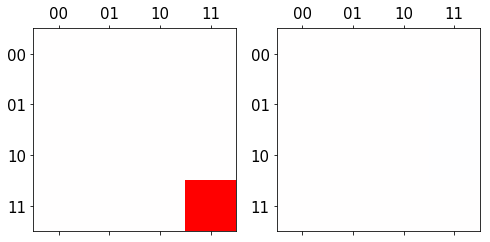

45
0.5257190475029561


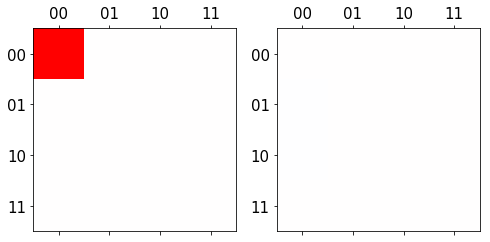

46
0.5016486482299665


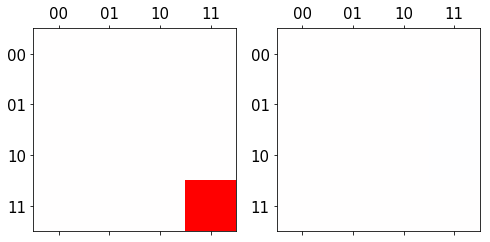

47
0.45416881986420676


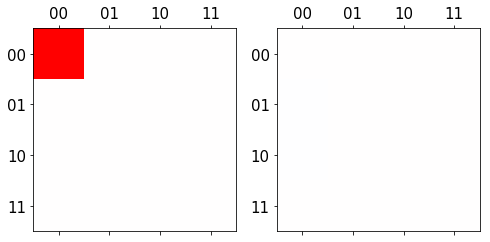

48
0.39257789432203594


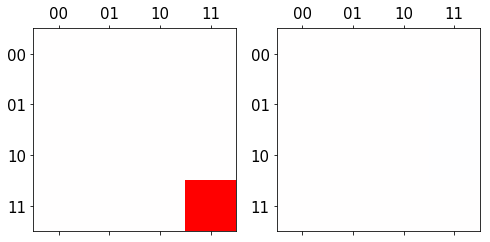

49
0.33374201711804985


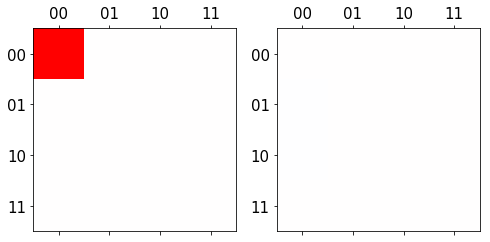

50
0.29121356020787226


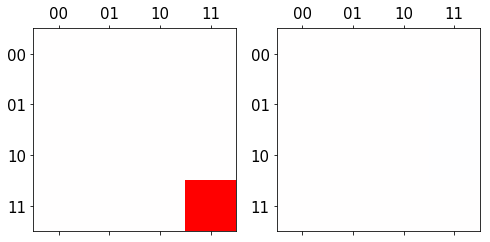

51
0.26959773707807677


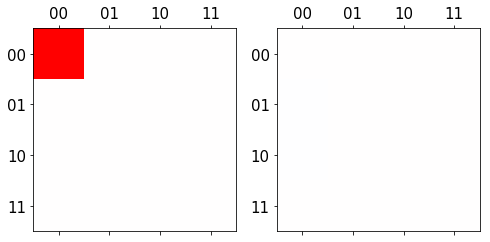

52
0.26471829242358236


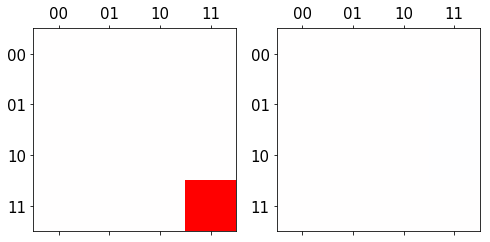

53
0.2643039687572842


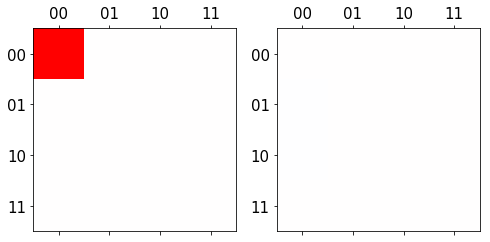

54
0.25169152995951827


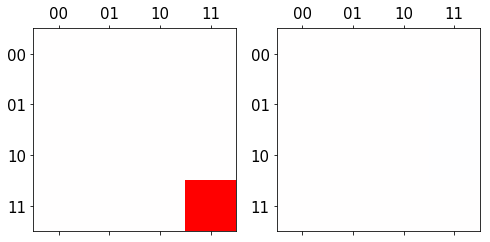

55
0.2158568506512108


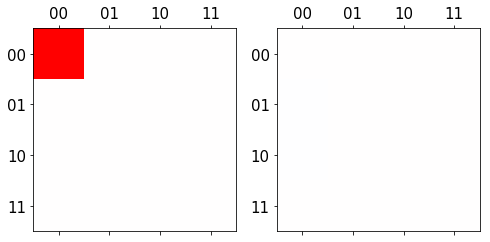

56
0.1603847289877214


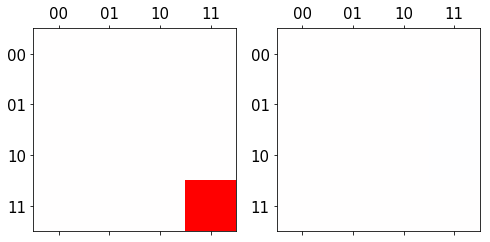

57
0.10181567839330857


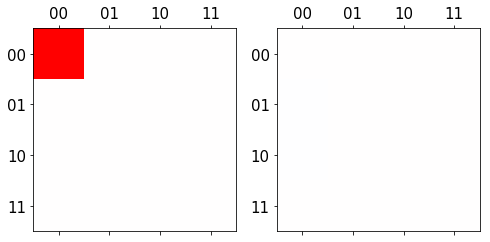

58
0.05741055311023327


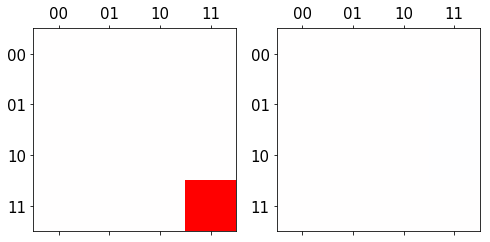

59
0.03336112345268466


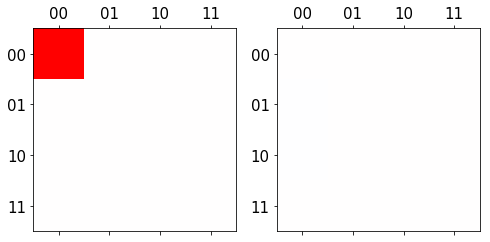

60
0.02493470888155462


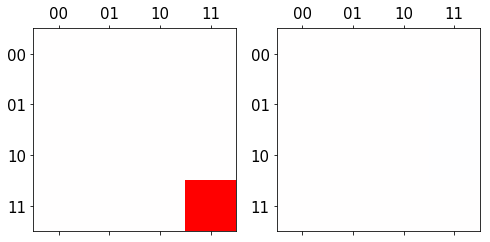

61
0.024193157070028337


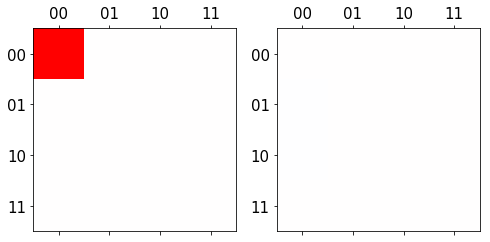

62
0.02270402422871591


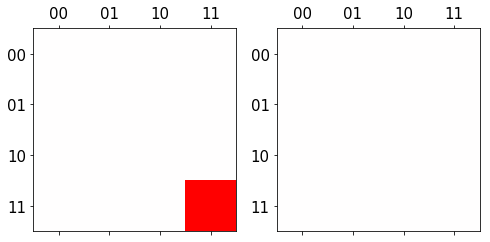

63
0.013805880830944695


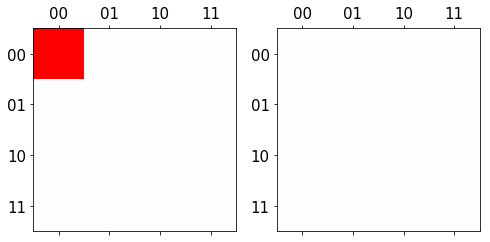

64
0.0015745303474744101


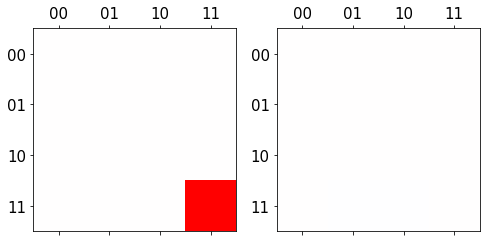

65
0.010012433154288018


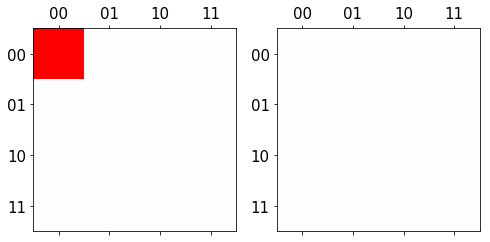

66
0.04277395351559813


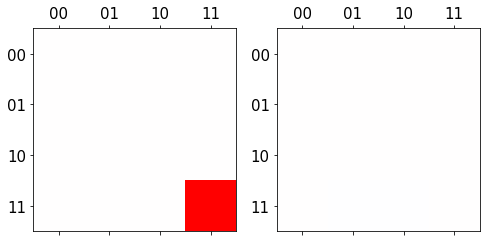

67
0.08030998871230195


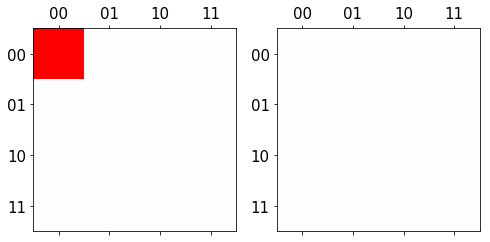

68
0.10509994107702415


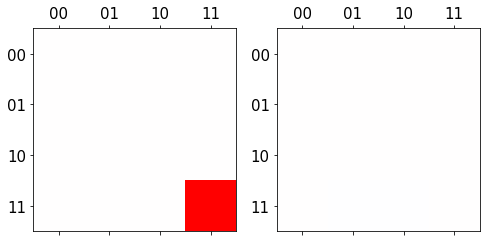

69
0.11283778616187963


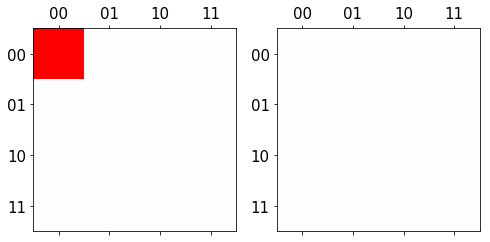

70
0.11285092006706947


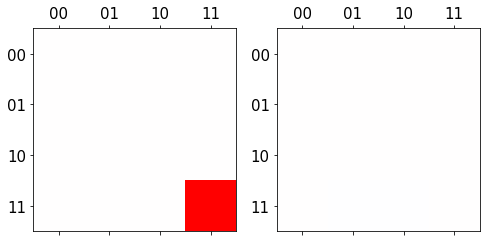

71
0.1191869836897344


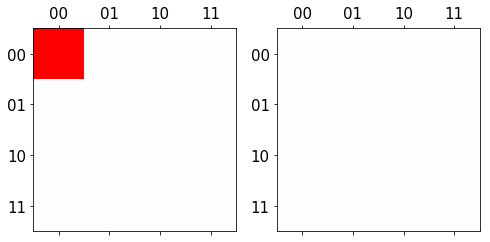

72
0.14262222180768883


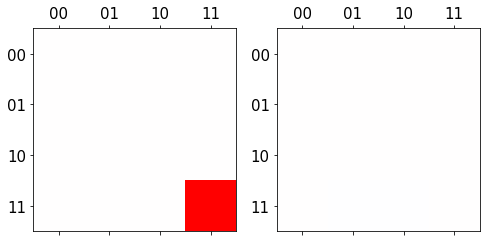

73
0.1877960444574675


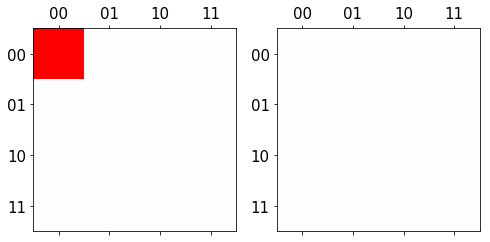

74
0.2501619230827166


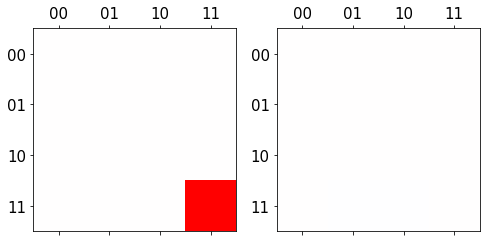

75
0.31452728413450953


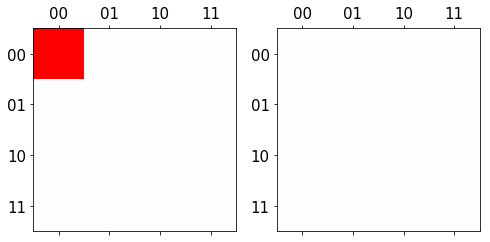

76
0.3625728873264098


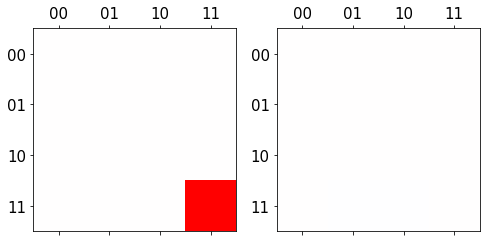

77
0.38535143231898167


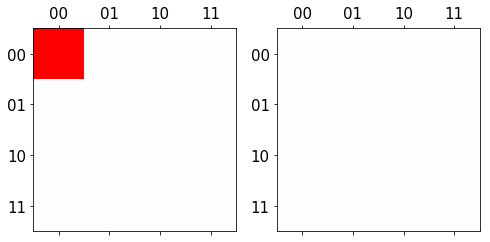

78
0.3892335560224293


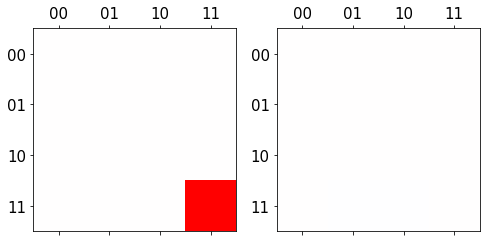

79
0.3900931356798897


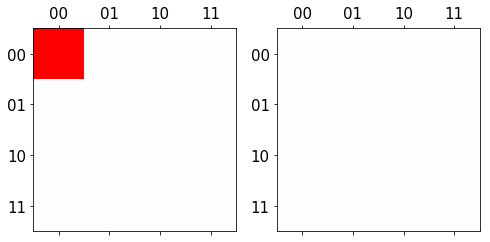

80
0.4020934214646831


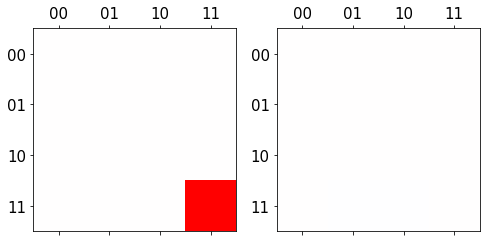

81
0.4315881918665485


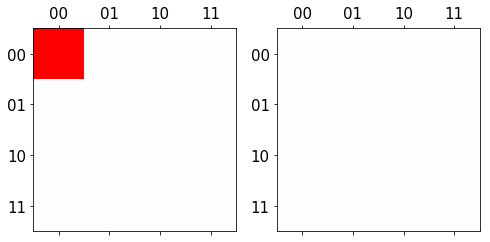

82
0.47726335905976136


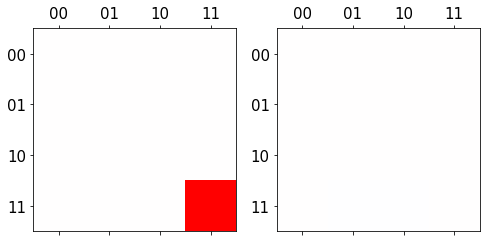

83
0.5304885051197424


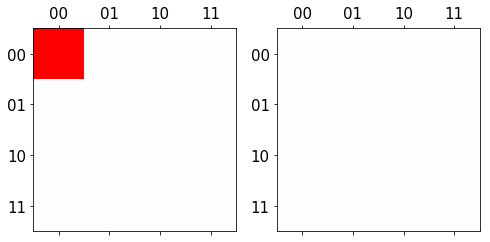

84
0.5772501143872385


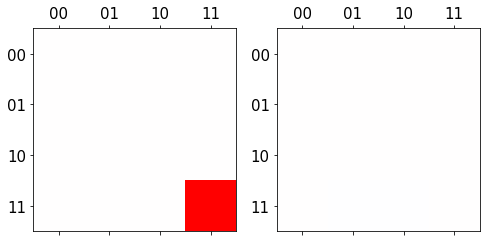

85
0.6059508630342973


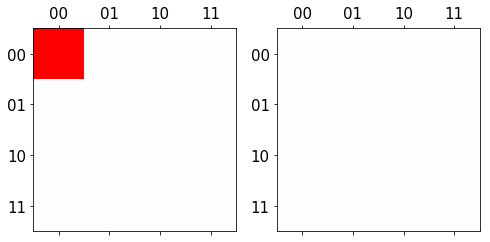

86
0.6157582710295271


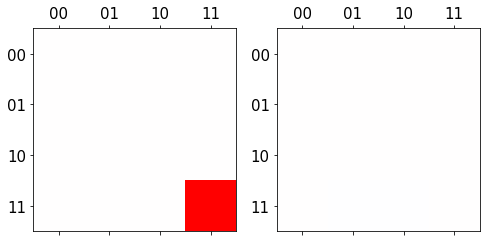

87
0.6162360829606623


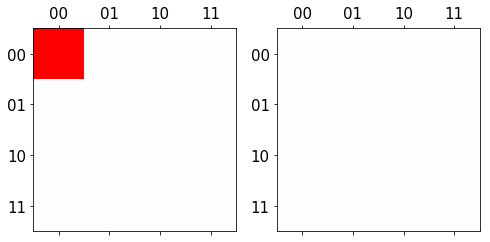

88
0.6181896208141047


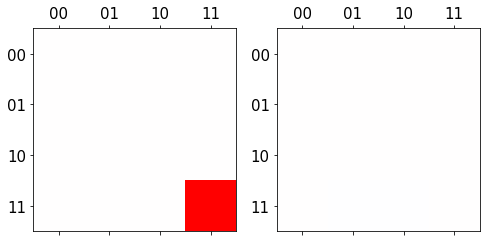

89
0.6261588328660752


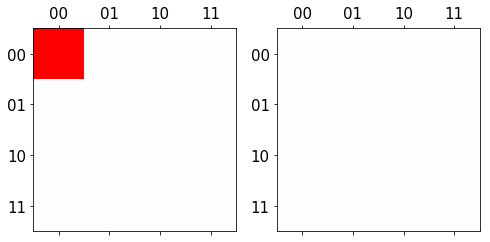

90
0.6395837134319868


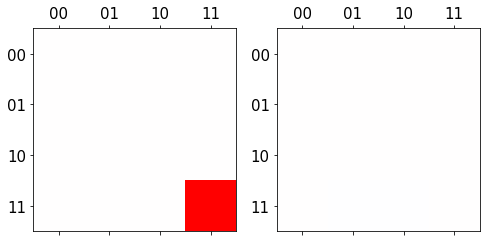

91
0.656649676034699


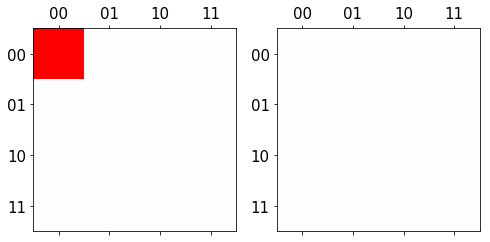

92
0.6740622159946068


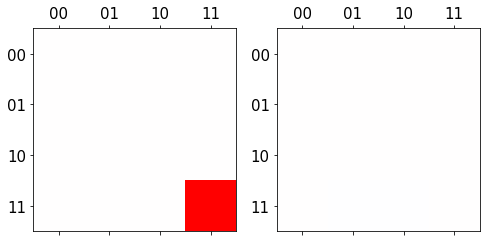

93
0.686740199825888


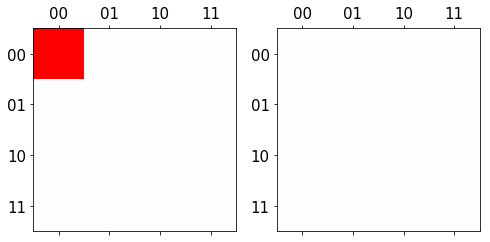

94
0.6919705092756693


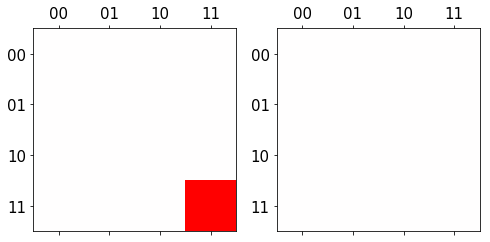

95
0.6925549966922083


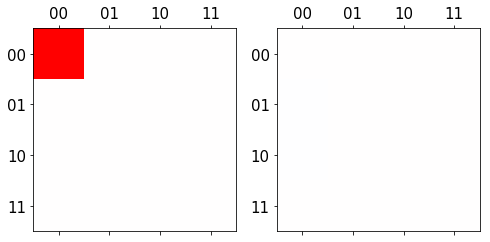

96
0.6925526182650499


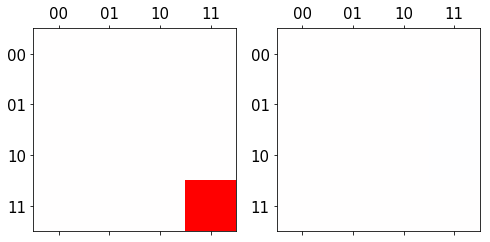

97
0.6906764396299501


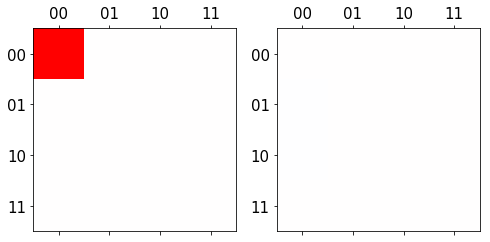

98
0.6814033723499449


In [111]:
names = ['00', '01', '10', '11']

for i in range(0, 99,1):
    hfont = {'fontname':'Arial'}
    fig, ax = plt.subplots(1,2,figsize=(8, 8))
    
    cax = ax[0].matshow(real_imagination(RHO[0][i])[0], vmin=-1, vmax=1, cmap=cm.bwr)
    cax = ax[1].matshow(real_imagination(RHO[0][i])[1], vmin=-1, vmax=1, cmap=cm.bwr)
    #fig.colorbar(cax)
    ticks = numpy.arange(0,4,1)
    ax[0].set_xticks(ticks)
    ax[0].set_yticks(ticks)
    ax[0].set_xticklabels(names)
    ax[0].set_yticklabels(names)
    ax[1].set_xticks(ticks)
    ax[1].set_yticks(ticks)
    ax[1].set_xticklabels(names)
    ax[1].set_yticklabels(names)
    plt.show()
    print (i)
    print (Vectorrs[450][i])
    #print (RHO[450][i])
    #print (" ")

In [32]:
phiInitFull

array([1, 0, 0, 0])

In [33]:
point1 = 33
point2 = 34
b = Bloch()
#b.vector_color = ['b']
#b.view = [-40,30]
b.clear()
vec = ([observables_x[point1], observables_y[point1], observables[point1]],[observables_x[point2], observables_y[point2], observables[point2]])
b.add_vectors(vec)

#for i in Final:
#    b.add_points([observables_x,observables_y,observables],'m')

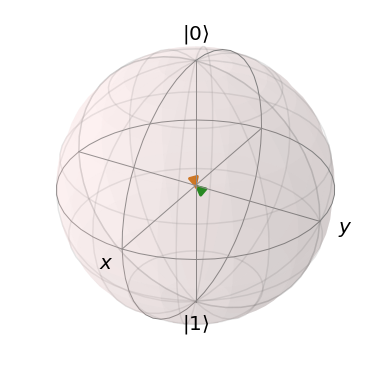

In [34]:
b.show()

In [157]:
type(rho)

numpy.ndarray

# Partian trace calculation for the white line at different g

In [20]:
nSites = 2

eps =  0.05                             #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                             #disorder
delta = deltaS(w, nSites)
g_steps = 500
g = np.linspace(0.0, 0.2, g_steps)                     #Interaction
T = 1  
time_steps = 100
times = np.linspace(1, time_steps, time_steps)

In [21]:
Observables = np.zeros((g_steps,time_steps), dtype=np.float)
#Vectorrs = np.zeros((g_steps,time_steps,2**nSites), dtype=list)
Vectorrs = np.zeros((g_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar

for g_id, g_value in enumerate(g): 
    U=Ufunc_all_to_all(nSites,alpha,g_value,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state
    
    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    observables = []
    vectorrs = []
    
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        vectorrs.append(Partial_Entropy(i))
        #vectorrs.append(entropy(i))
    #print(g_id)
    f.value += 1
    Observables[g_id] = observables
    Vectorrs[g_id] = vectorrs

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in log
  import sys
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in double_scalars
  import sys
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in log
  import sys


C:\Anaconda3\lib\site-packages\numpy\core\_methods.py:29: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims)
C:\Anaconda3\lib\site-packages\numpy\core\_methods.py:26: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims)
C:\Anaconda3\lib\site-packages\matplotlib\colors.py:496: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


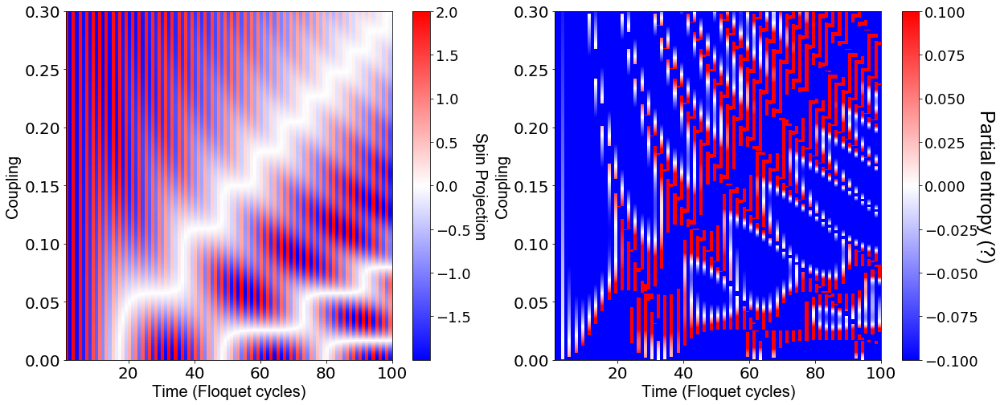

In [22]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,2,figsize=(20, 8))

p = axes[0].pcolor(times, g, Observables, cmap=cm.bwr)
#p = axes[1].plot(times/time_steps, np.abs(np.fft.fft(observables)), 'r', linewidth=1.0)

axes[0].axis('tight')
axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=20, **hfont)
axes[0].set_ylabel(r'Coupling', fontsize=20, **hfont)


axes[0].tick_params(axis='x', labelsize=20)
axes[0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0])
cb.set_label(r'Spin Projection', labelpad=20, rotation=270, fontsize=20, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[1].pcolor(times, g, Vectorrs, cmap=cm.bwr)

axes[1].axis('tight')
axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=20, **hfont)
axes[1].set_ylabel(r'Coupling', fontsize=20, **hfont)


axes[1].tick_params(axis='x', labelsize=20)
axes[1].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1])
cb.set_label(r'Partial entropy (?)', labelpad=20, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

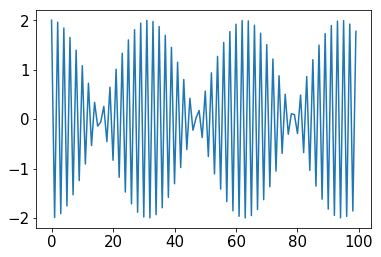

In [102]:
plot(Observables[1])

# 3 TC cases pic

In [80]:
nSites = 7

eps=0.00                 #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                   #disorder
delta = deltaF(w, nSites)
g = 0.00                  #Interaction
T = 1                     # Period

timess=100
times = np.linspace(1, timess, timess)

In [81]:
U=Ufunc(nSites,alpha,g, T, delta)
phiInitFull = np.full((2**nSites), 0)
phiInitFull[0] = 1
#phiInitFull[3] = 1                                ##initial state

Final = states(phiInitFull,timess)                ## Evolution of states

f = IntProgress(min=0, max=timess)                # instantiate the bar
display(f)                                        # display the bar

sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
observables1 = []
for i in Final:
    observables1.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    f.value += 1

In [82]:
nSites = 7

eps=0.05                 #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                   #disorder
delta = deltaF(w, nSites)
g = 0.00                  #Interaction
T = 1                     # Period

timess=100
times = np.linspace(1, timess, timess)

In [83]:
U=Ufunc(nSites,alpha,g, T, delta)
phiInitFull = np.full((2**nSites), 0)
phiInitFull[0] = 1
#phiInitFull[3] = 1                                ##initial state

Final = states(phiInitFull,timess)                ## Evolution of states

f = IntProgress(min=0, max=timess)                # instantiate the bar
display(f)                                        # display the bar

sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
observables2 = []
for i in Final:
    observables2.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    f.value += 1

In [89]:
nSites = 7

eps=0.05                 #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                   #disorder
delta = deltaF(w, nSites)
g = 0.1                  #Interaction
T = 1                     # Period

timess=100
times = np.linspace(1, timess, timess)

In [90]:
U=Ufunc(nSites,alpha,g, T, delta)
phiInitFull = np.full((2**nSites), 0)
phiInitFull[0] = 1
#phiInitFull[3] = 1                                ##initial state

Final = states(phiInitFull,timess)                ## Evolution of states

f = IntProgress(min=0, max=timess)                # instantiate the bar
display(f)                                        # display the bar

sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
observables3 = []
for i in Final:
    observables3.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    f.value += 1

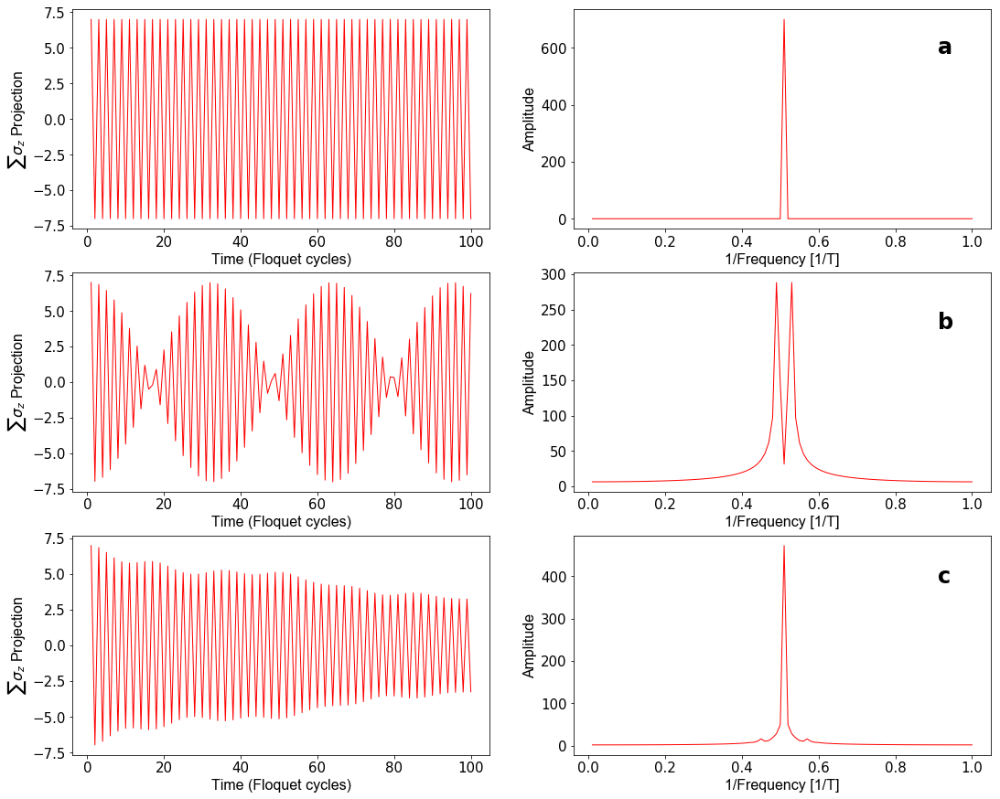

In [97]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(3,2,figsize=(18, 15))

p = axes[0,0].plot(times,observables1, 'r', linewidth=1.0)
p = axes[0,1].plot(times/timess, np.abs(np.fft.fft(observables1)), 'r', linewidth=1.0)
p = axes[1,0].plot(times,observables2, 'r', linewidth=1.0)
p = axes[1,1].plot(times/timess, np.abs(np.fft.fft(observables2)), 'r', linewidth=1.0)
p = axes[2,0].plot(times,observables3, 'r', linewidth=1.0)
p = axes[2,1].plot(times/timess, np.abs(np.fft.fft(observables3)), 'r', linewidth=1.0)

#axes[0].axis('tight')
axes[0,0].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[0,0].set_ylabel(r'$\sum\sigma_z$ Projection', fontsize=16, **hfont)

axes[0,1].set_xlabel(r'1/Frequency [1/T]', fontsize=16, **hfont)
axes[0,1].set_ylabel(r'Amplitude', fontsize=16, **hfont)
#axes[1].set_title(r'FFT for the Time Crystal', fontsize=16, **hfont);

#axes[1].set_ylim((0, 500))
#axes[0,1].set_xlim((0.4, 0.6))

axes[1,0].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[1,0].set_ylabel(r'$\sum\sigma_z$ Projection', fontsize=16, **hfont)

axes[1,1].set_xlabel(r'1/Frequency [1/T]', fontsize=16, **hfont)
axes[1,1].set_ylabel(r'Amplitude', fontsize=16, **hfont)

axes[2,0].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[2,0].set_ylabel(r'$\sum\sigma_z$ Projection', fontsize=16, **hfont)

axes[2,1].set_xlabel(r'1/Frequency [1/T]', fontsize=16, **hfont)
axes[2,1].set_ylabel(r'Amplitude', fontsize=16, **hfont)


matplotlib.pyplot.text(0.91, 1650,'a', fontsize=24, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(0.91, 1000,'b', fontsize=24, weight="black",  verticalalignment='center')
matplotlib.pyplot.text(0.91,  400,'c', fontsize=24, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(15,5)
#plt.savefig("C:/neon/Simulated TC.pdf", bbox_inches="tight")

# Variable Parameters  - eps and disorder

In [237]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.8                                        #disorder
delta = deltaS(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [238]:
delta

[0, 0.8]

In [239]:
Observables2 = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    #U=Ufunc(nSites,alpha_value,g,T,delta)
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    #U=UfuncZZ(nSites,alpha_value,g,T,delta)
    #U=UfuncXX(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states


    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
       
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
       
 
    observables = []
      
    for i in Final:
        
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables2[alpha_id] = observables
    

In [240]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.5                                        #disorder
delta = deltaS(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [241]:
delta

[0, 0.5]

In [242]:
Observables3 = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    #U=Ufunc(nSites,alpha_value,g,T,delta)
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    #U=UfuncZZ(nSites,alpha_value,g,T,delta)
    #U=UfuncXX(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states


    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
       
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
       
 
    observables = []
      
    for i in Final:
        
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables3[alpha_id] = observables
    

In [243]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 1.0                                        #disorder
delta = deltaS(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [244]:
delta

[0, 1.0]

In [245]:
Observables4 = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    #U=Ufunc(nSites,alpha_value,g,T,delta)
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    #U=UfuncZZ(nSites,alpha_value,g,T,delta)
    #U=UfuncXX(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states


    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
       
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
       
 
    observables = []
      
    for i in Final:
        
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables4[alpha_id] = observables
    

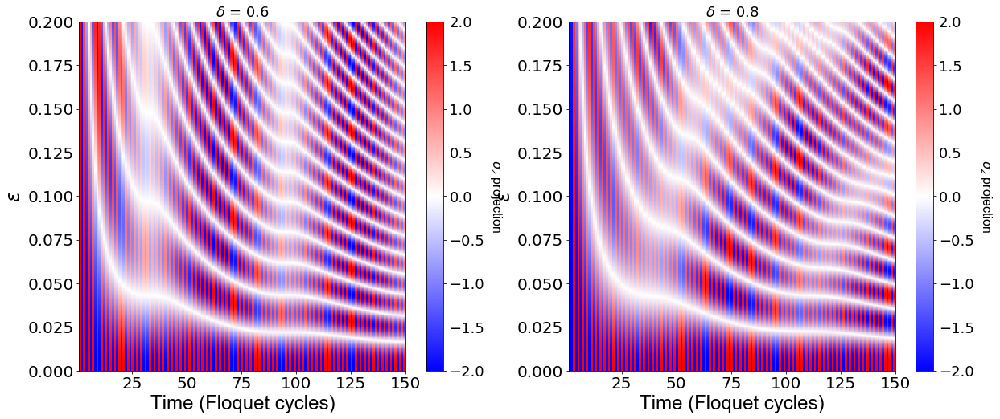

In [246]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,2,figsize=(20, 8))

p = axes[0].pcolor(times, eps, Observables1, cmap=cm.bwr)

axes[0].axis('tight')
axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0].tick_params(axis='x', labelsize=20)
axes[0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


p = axes[1].pcolor(times, eps, Observables2, cmap=cm.bwr)

axes[1].axis('tight')
axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[1].tick_params(axis='x', labelsize=20)
axes[1].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,8)
#plt.savefig("C:/neon/disorder.pdf", bbox_inches="tight")

In [151]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.7                                        #disorder
delta = deltaS(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [152]:
delta

[0, 0.7]

In [153]:
Observables1 = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    #U=Ufunc(nSites,alpha_value,g,T,delta)
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    #U=UfuncZZ(nSites,alpha_value,g,T,delta)
    #U=UfuncXX(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states


    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
       
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
       
 
    observables = []
      
    for i in Final:
        
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables1[alpha_id] = observables
    

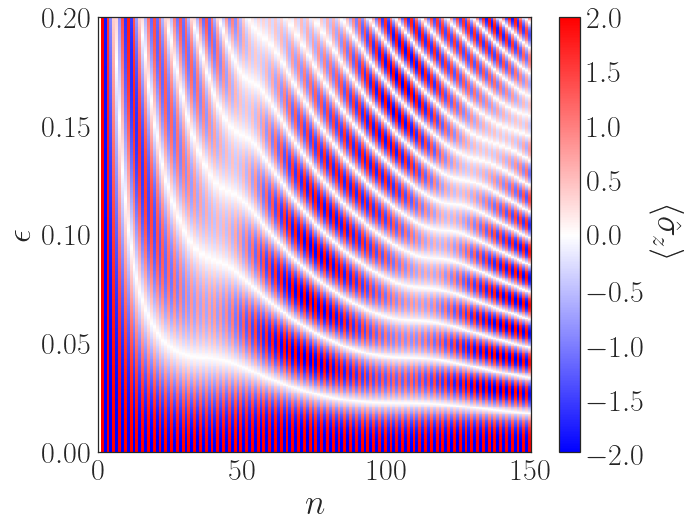

In [154]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(9.7, 8))

p = axes.pcolor(times, eps, Observables1, cmap=cm.bwr)

axes.axis('tight')
axes.set_xlabel(r'$n$', fontsize=35, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=35, **hfont)


axes.tick_params(axis='x', labelsize=30)
axes.tick_params(axis='y', labelsize=30)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'$\langle \hat{\sigma}_z \rangle$', labelpad=35, rotation=270, fontsize=35, **hfont)
cb.ax.tick_params(labelsize=30) 

#axes.set_title('$\delta$ = 0.7')

ymin, ymax = axes.get_ylim()
axes.set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))

#matplotlib.pyplot.text(-85, 0.28, 'a', fontsize=34, weight="black",  verticalalignment='center')
#matplotlib.pyplot.text(138, 0.28, 'b', fontsize=34, weight="black",  verticalalignment='center')

plt.gcf().set_size_inches(9.7, 8)
plt.savefig("C:/Users/Kirill Shulga/Desktop/Time-Molecule/Fig4a.pdf", bbox_inches="tight")

# Variable Parameters  - Fitting

In [15]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.15, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.0                             #Interaction
T = 1  
time_steps = 100
times = np.linspace(1, time_steps, time_steps)

In [16]:
delta

[0.0, -0.0]

In [17]:
Observables1 = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    #U=Ufunc(nSites,alpha_value,g,T,delta)
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    #U=UfuncZZ(nSites,alpha_value,g,T,delta)
    #U=UfuncXX(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states


    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
       
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
       
 
    observables = []
      
    for i in Final:
        
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables1[alpha_id] = observables
    

In [23]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.15, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaS(w, nSites)
g = 0.1                             #Interaction
T = 1  
time_steps = 100
times = np.linspace(1, time_steps, time_steps)

In [24]:
delta

[0, 0.0]

In [25]:
Observables2 = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    #U=Ufunc(nSites,alpha_value,g,T,delta)
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    #U=UfuncZZ(nSites,alpha_value,g,T,delta)
    #U=UfuncXX(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states


    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
       
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
       
 
    observables = []
      
    for i in Final:
        
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    #print(alpha_id)
    f.value += 1
    Observables2[alpha_id] = observables
    

In [26]:
x1=times

x2=np.pi/(x1)/4
x3=np.pi/(x1)/4*3
x4=np.pi/(x1)/4*5
x5=np.pi/(x1)/4*7
x6=np.pi/(x1)/4*9
x7=np.pi/(x1)/4*11
x8=np.pi/(x1)/4*13
x9=np.pi/(x1)/4*15
x10=np.pi/(x1)/4*17
x11=np.pi/(x1)/4*19
x12=np.pi/(x1)/4*21
x13=np.pi/(x1)/4*23
x14=np.pi/(x1)/4*25
x15=np.pi/(x1)/4*27
x16=np.pi/(x1)/4*29
x17=np.pi/(x1)/4*31
x18=np.pi/(x1)/4*33
x19=np.pi/(x1)/4*35
x20=np.pi/(x1)/4*37

XX = [x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20]

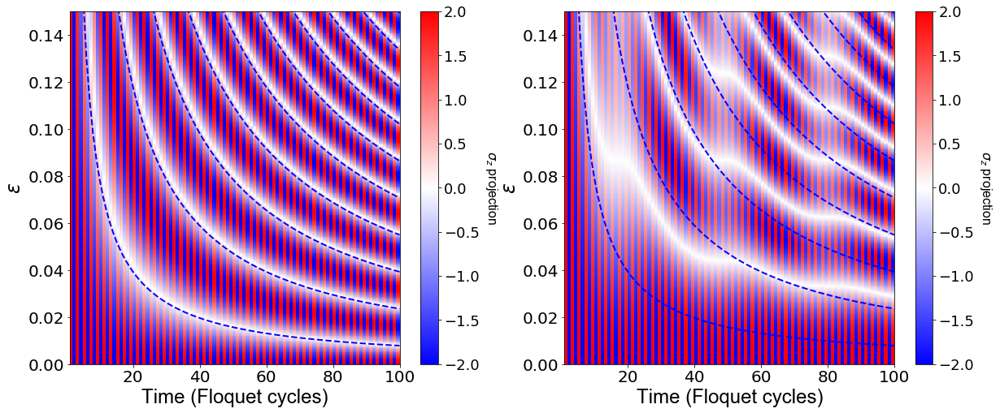

In [27]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,2,figsize=(20, 8))

p = axes[0].pcolor(times, eps, Observables1, cmap=cm.bwr)

axes[0].axis('tight')
axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0].tick_params(axis='x', labelsize=20)
axes[0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

for i in arange(0,19,1):
    axes[0].plot(x1,XX[i], '--b' , linewidth=2.0)


p = axes[1].pcolor(times, eps, Observables2, cmap=cm.bwr)

axes[1].axis('tight')
axes[1].set_xlabel(r'Time (Floquet cycles)', fontsize=24, **hfont)
axes[1].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[1].tick_params(axis='x', labelsize=20)
axes[1].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 



for i in arange(0,19,1):
    axes[1].plot(x1,XX[i], '--b' , linewidth=2.0)



#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(20,8)
#plt.savefig("C:/neon/Simulated TC_3D_2spins_g=0.1_T=1_100_Floquet_steps.pdf", bbox_inches="tight")

# Entropy

In [26]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [27]:
Observables0 = np.zeros((eps_steps,time_steps), dtype=np.float)
Vectorrs0 = np.zeros((eps_steps,time_steps), dtype=np.float)
#Vectorrrs = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar

for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    #phiInitFull = np.full((2**nSites), 0)
    #phiInitFull[0] = 1                             ##initial state
    
    phiInitFull = np.full((2**nSites), 0, dtype = complex)
    phiInitFull[0] = 1-1j
    phiInitFull[3] = -1-1j
    phiInitFull = phiInitFull/2

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    observables = []
    vectorrs = []
    #vectorrrs = []
      
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        vectorrs.append(Partial_Entropy(i))
        #vectorrrs.append(entropy(i))
    f.value += 1
    Observables0[alpha_id] = observables 
    Vectorrs0[alpha_id] = vectorrs
    #Vectorrrs[alpha_id] = vectorrrs

KeyboardInterrupt: 

In [127]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [128]:
Observables1 = np.zeros((eps_steps,time_steps), dtype=np.float)
Vectorrs1 = np.zeros((eps_steps,time_steps), dtype=np.float)
#Vectorrrs = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar

for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state
    
    Final = states(phiInitFull,time_steps)                ## Evolution of states

    sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
    for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
    observables = []
    vectorrs = []
    #vectorrrs = []
      
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
        vectorrs.append(Partial_Entropy(i))
        #vectorrrs.append(entropy(i))
    f.value += 1
    Observables1[alpha_id] = observables 
    Vectorrs1[alpha_id] = vectorrs
    #Vectorrrs[alpha_id] = vectorrrs

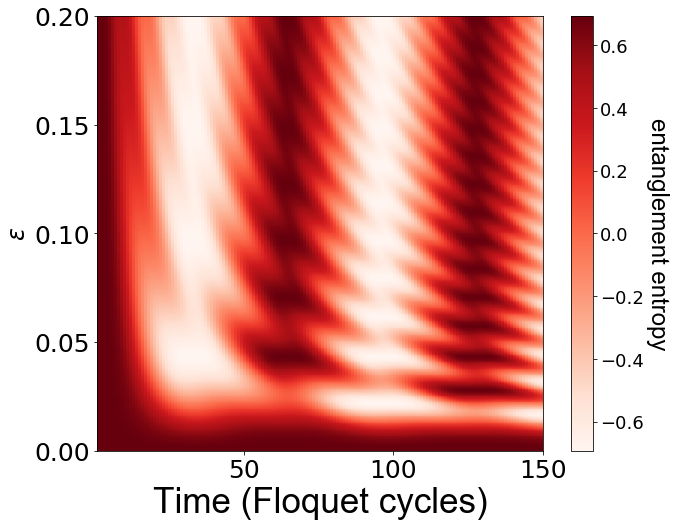

In [129]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

p = axes.pcolor(times, eps, Vectorrs0-Vectorrs1, cmap=cm.Reds)

axes.tick_params(axis='x', labelsize=25)
axes.tick_params(axis='y', labelsize=25)

axes.set_xlabel(r'Time (Floquet cycles)', fontsize=35, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=24, **hfont)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'entanglement entropy', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes.get_ylim()
axes.set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))


#matplotlib.pyplot.text(-85, 0.28, 'a', fontsize=34, weight="black",  verticalalignment='center')
#matplotlib.pyplot.text(138, 0.28, 'b', fontsize=34, weight="black",  verticalalignment='center')

#plt.gcf().set_size_inches(10, 8)
#plt.savefig("C:/neon/TM_Pic3_entropy_entangled.pdf", bbox_inches="tight")

# Variable Parameters  - Floquet Eigenvalues analysis

In [408]:
def chop(expr, *, max=0.01):
    return [i if abs(i) > max else 0 for i in expr]

def chop(expr, *, max=0.01):
    return [round(i,3) if abs(i) > max else 0 for i in expr]

In [409]:
def matrix_chop(matrix):
    T = []
    for i in matrix:
        T.append(chop(i))
    return T

In [598]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.0, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                        #disorder
delta = deltaS(w, nSites)
g = 0.05                            #Interaction
T = 1  

In [599]:
Fl_eig = np.zeros((eps_steps,2**nSites), dtype=np.float)
Fl_vec = np.zeros((eps_steps,2**nSites,2**nSites), dtype=np.complex)
Fl_eig_ent = np.zeros((eps_steps,2**nSites), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    evals, evecs = la.eig(U)
           
    f.value += 1
    #Fl_eig[alpha_id] = Floquet_eigenvalues(U)[1]
    #Fl_eig[alpha_id] = sort(chop(real(-1j*log(evals))))
    #Fl_eig[alpha_id] = evals
    Fl_eig[alpha_id] = chop(real(-1j*log(evals)))
    Fl_vec[alpha_id] = evecs.T
    Fl_eig_ent[alpha_id] = Partial_Entropy(evecs.T)

In [600]:
number1 =   55     #214
number2 =   109     #110
number3 =   154     #309

In [601]:
Fl_eig[5]

array([ 0.   , -3.141,  3.041,  0.1  ])

In [602]:
matrix_chop(Fl_vec[5])

[[(-0.707-0j), 0, 0, (0.707+0j)],
 [(0.707+0j), (0.028+0.001j), (0.028+0.001j), (0.707-0j)],
 [(-0.028+0.001j), (0.707-0j), (0.707+0j), (-0.028+0.001j)],
 [0, (0.707+0j), (-0.707+0j), 0]]

TypeError: Image data can not convert to float

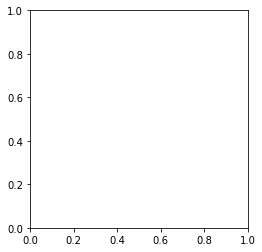

In [590]:
names = ['1vec', '2vec', '3vec', '4vec']
number = 44


fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(Fl_vec[number], vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = numpy.arange(0,4,1)
#ax.set_xticks(ticks)
ax.set_yticks(ticks)
#ax.set_xticklabels(names)
ax.set_yticklabels(names)
plt.show()

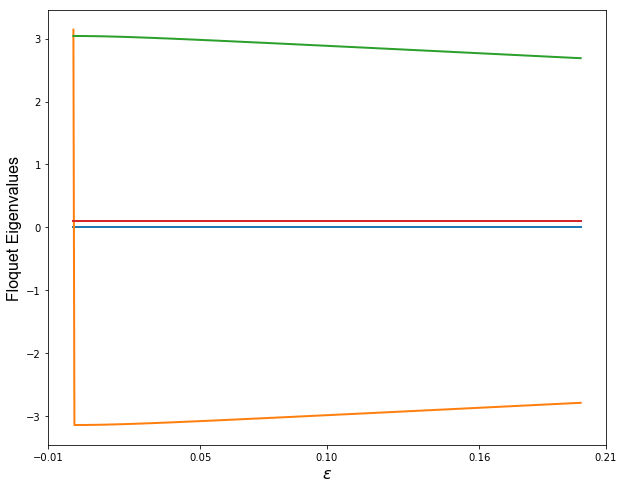

In [591]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

for i in np.linspace(0,2**nSites-1,2**nSites):

    p = axes.plot(eps, Fl_eig.T[int(i)], linewidth=2.0)

axes.set_xlabel(r'$\epsilon$', fontsize=16, **hfont)
axes.set_ylabel(r'Floquet Eigenvalues', fontsize=16, **hfont)

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(xmin, xmax, 5), 2))

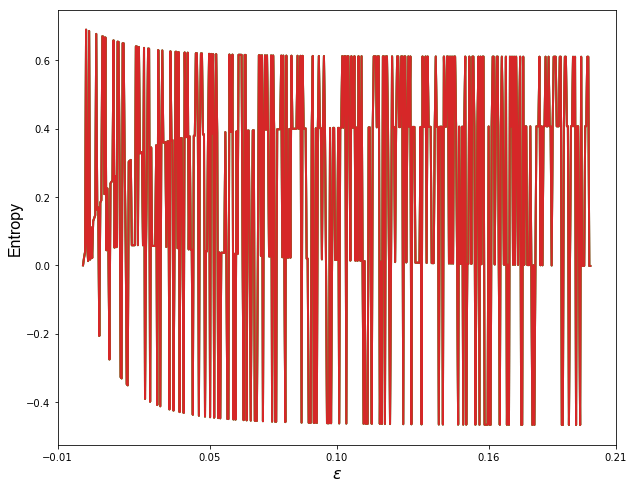

In [611]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

for i in arange(0,2**nSites):

    p = axes.plot(eps, Fl_eig_ent.T[0], linewidth=2.0)

axes.set_xlabel(r'$\epsilon$', fontsize=16, **hfont)
axes.set_ylabel(r'Entropy', fontsize=16, **hfont)

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(xmin, xmax, 5), 2))

# Variable Parameters   Floquet Eigenvalues analysis + variable coupling

In [100]:
nSites = 2

eps=0.048
alpha = np.pi/2-eps
w = 0.0                                        #disorder
delta = deltaS(w, nSites)
T = 1  

g_steps = 500
g = np.linspace(0.0, 0.1, g_steps)                     #Interaction

In [101]:
Fl_eig = np.zeros((g_steps,2**nSites), dtype=np.float)

f = IntProgress(min=0, max=g_steps) # instantiate the bar
display(f) # display the bar
    
for g_id, g_value in enumerate(g):  
    U=Ufunc_all_to_all(nSites,alpha,g_value,T,delta)
    evals, evecs = la.eig(U)
           
    f.value += 1
    #Fl_eig[g_id] = Floquet_eigenvalues(U)[1]
    Fl_eig[g_id] = sort(chop(real(-1j*log(evals))))

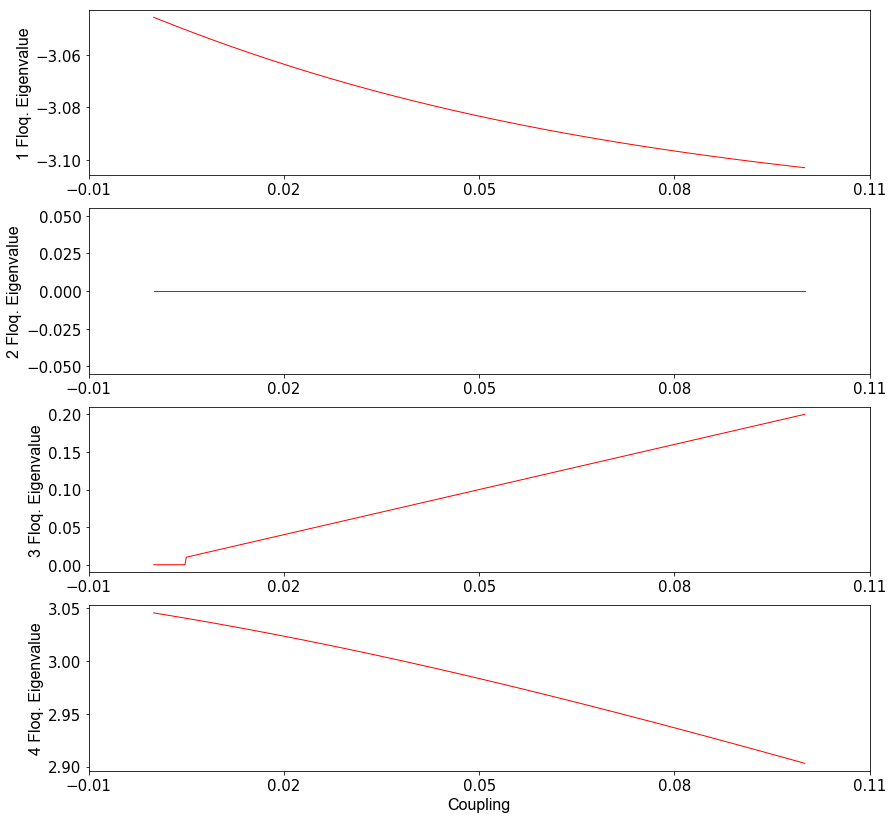

In [102]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(4,1,figsize=(14, 14))

p = axes[0].plot(g, Fl_eig.T[0], 'r', linewidth=1.0)

axes[0].set_ylabel(r'1 Floq. Eigenvalue', fontsize=16, **hfont)

p = axes[1].plot(g, Fl_eig.T[1], 'r', linewidth=1.0)

axes[1].set_ylabel(r'2 Floq. Eigenvalue', fontsize=16, **hfont)

p = axes[2].plot(g, Fl_eig.T[2], 'r', linewidth=1.0)

axes[2].set_ylabel(r'3 Floq. Eigenvalue', fontsize=16, **hfont)

p = axes[3].plot(g, Fl_eig.T[3], 'r', linewidth=1.0)

axes[3].set_xlabel(r'Coupling', fontsize=16, **hfont)
axes[3].set_ylabel(r'4 Floq. Eigenvalue', fontsize=16, **hfont)

xmin, xmax = axes[0].get_xlim()
axes[0].set_xticks(np.round(np.linspace(xmin, xmax, 5), 2))
xmin, xmax = axes[1].get_xlim()
axes[1].set_xticks(np.round(np.linspace(xmin, xmax, 5), 2))
xmin, xmax = axes[2].get_xlim()
axes[2].set_xticks(np.round(np.linspace(xmin, xmax, 5), 2))
xmin, xmax = axes[3].get_xlim()
axes[3].set_xticks(np.round(np.linspace(xmin, xmax, 5), 2))

In [103]:
np.linspace(1,int(2**nSites-1),int(2**nSites-1))

array([1., 2., 3.])

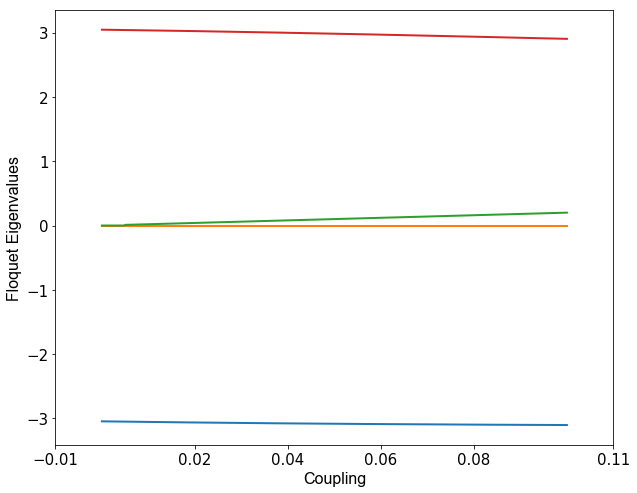

In [104]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

for i in np.linspace(0,2**nSites-1,2**nSites):

    p = axes.plot(g, Fl_eig.T[int(i)], linewidth=2.0)

axes.set_xlabel(r'Coupling', fontsize=16, **hfont)
axes.set_ylabel(r'Floquet Eigenvalues', fontsize=16, **hfont)

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(xmin, xmax, 6), 2))

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in true_divide
  after removing the cwd from sys.path.


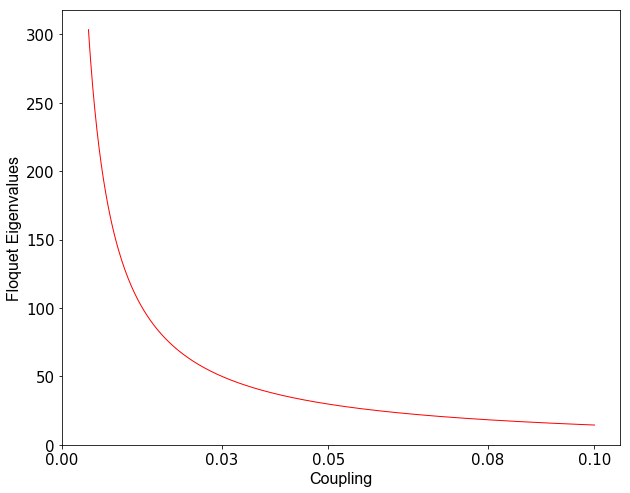

In [105]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

p = axes.plot(g, Fl_eig.T[3]/Fl_eig.T[2], 'r', linewidth=1.0)

axes.set_xlabel(r'Coupling', fontsize=16, **hfont)
axes.set_ylabel(r'Floquet Eigenvalues', fontsize=16, **hfont)

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(xmin, xmax, 5), 2))

In [111]:
RAT = Fl_eig.T[3]/Fl_eig.T[2]
for ratio_id, ratio_value in enumerate(RAT):
    if abs(ratio_value - 100) < 0.05:
        print (ratio_id)
        print (eps, g[ratio_id])

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.


In [193]:
number1 =   55     #214
number2 =   109     #110
number3 =   154     #309

In [60]:
154/500*0.2

0.0616

In [61]:
nSites = 2

eps=0.0616         #0.0436                 #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                   #disorder
delta = deltaF(w, nSites)
g = 0.05                  #Interaction
T = 1                     # Period

timess=150
times = np.linspace(1, timess, timess)

In [62]:
sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)

U=Ufunc_all_to_all(nSites,alpha,g, T, delta)

evals, evecs = la.eig(U)
           
#Fl_eig = Floquet_eigenvalues(U)[1]
#Fl_eig = sort(chop(real(-1j*log(evals))))
Fl_eig = chop(real(-1j*log(evals)))
#print (Fl_eig)
Fl_vec = evecs.T
#print (Fl_vec)

phiInitFull = np.full((2**nSites), 0)         ##initial state1
phiInitFull[0] = 1

Final = states(phiInitFull,timess)                ## Evolution of states

observables1 = []
for i in Final:
    observables1.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    
    
    
observables2=np.zeros((2**nSites,timess), dtype=np.complex)
entropy_vec=np.zeros((2**nSites,timess), dtype=np.float)
for i in arange(0,4):
    #phiInitFull = evecs[i]         ##initial state2
    phiInitFull = Fl_vec[i]

    Final = states(phiInitFull,timess)            ## Evolution of states
    for j in arange(0,timess):
        observables2[i][j] = np.dot(np.dot(np.conjugate(Final[j]).T,sigZOp),Final[j]).real
        entropy_vec[i][j] = Partial_Entropy(Final[j])

In [63]:
Fl_eig

[0, -3.059, 2.959, 0.1]

In [64]:
for i in arange(0,4):
    print (Partial_Entropy(Fl_vec[i]))
    print (Fl_vec[i])

0.6931471805599453
[ 7.07106781e-01+0.00000000e+00j  1.71821872e-17+5.06677034e-17j
  1.43519419e-17-1.18416109e-17j -7.07106781e-01+1.55810456e-16j]
0.158036286358719
[0.58614912+0.00000000e+00j 0.39501705+1.97673278e-02j
 0.39501705+1.97673278e-02j 0.58614912+2.15608638e-16j]
0.15803628635871775
[-0.39501705+1.97673278e-02j  0.58614912+0.00000000e+00j
  0.58614912-5.57632800e-18j -0.39501705+1.97673278e-02j]
0.6931471805599454
[-2.52875307e-16+8.41417564e-17j  7.07106781e-01+0.00000000e+00j
 -7.07106781e-01+2.65488735e-16j  2.40855843e-16-1.13417476e-16j]


C:\Anaconda3\lib\site-packages\numpy\core\numeric.py:492: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


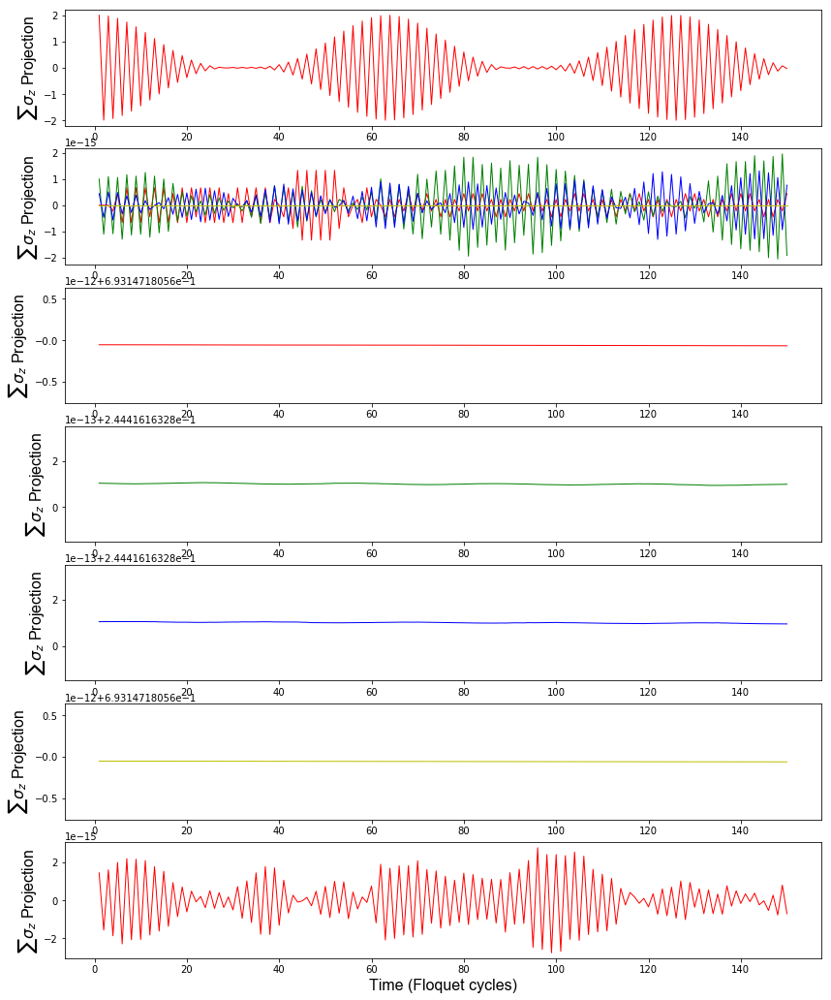

In [548]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(7,1,figsize=(14, 18))

p = axes[0].plot(times,observables1, 'r', linewidth=1.0)
p = axes[1].plot(times,observables2[0], 'r', linewidth=1.0)
p = axes[1].plot(times,observables2[1], 'g', linewidth=1.0)
p = axes[1].plot(times,observables2[2], 'b', linewidth=1.0)
p = axes[1].plot(times,observables2[3], 'y', linewidth=1.0)

p = axes[2].plot(times,entropy_vec[0], 'r', linewidth=1.0)
p = axes[3].plot(times,entropy_vec[1], 'g', linewidth=1.0)
p = axes[4].plot(times,entropy_vec[2], 'b', linewidth=1.0)
p = axes[5].plot(times,entropy_vec[3], 'y', linewidth=1.0)

p = axes[6].plot(times,observables2[0]+observables2[1]+observables2[2]+observables2[3], 'r', linewidth=1.0)




#axes[0].axis('tight')
#axes[0].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)
axes[0].set_ylabel(r'$\sum\sigma_z$ Projection', fontsize=16, **hfont)
axes[1].set_ylabel(r'$\sum\sigma_z$ Projection', fontsize=16, **hfont)
axes[2].set_ylabel(r'$\sum\sigma_z$ Projection', fontsize=16, **hfont)
axes[3].set_ylabel(r'$\sum\sigma_z$ Projection', fontsize=16, **hfont)
axes[4].set_ylabel(r'$\sum\sigma_z$ Projection', fontsize=16, **hfont)
axes[5].set_ylabel(r'$\sum\sigma_z$ Projection', fontsize=16, **hfont)
axes[6].set_ylabel(r'$\sum\sigma_z$ Projection', fontsize=16, **hfont)
axes[6].set_xlabel(r'Time (Floquet cycles)', fontsize=16, **hfont)



#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)

#plt.gcf().set_size_inches(15,5)
#plt.savefig("C:/neon/Simulated TC.pdf", bbox_inches="tight")

In [439]:
print(Fl_eig)
matrix_chop(evecs)

[-0.05, 3.041, -3.041, 0.05]


[[-0.707, 0.612, 0.354, 0],
 [0, -0.354, 0.612, -0.707],
 [0, -0.354, 0.612, 0.707],
 [0.707, 0.612, 0.354, 0]]

# Eigenvectors Entropy

In [36]:
nSites = 2

eps_steps = 500
eps=np.linspace(-np.pi, np.pi, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                        #disorder
delta = deltaS(w, nSites)
g = 0.05                            #Interaction
T = 1  

In [37]:
Fl_eig = np.zeros((eps_steps,2**nSites), dtype=np.float)
Fl_vec = np.zeros((eps_steps,2**nSites,2**nSites), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar
    
for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    evals, evecs = la.eig(U)
           
    f.value += 1
    #Fl_eig[alpha_id] = Floquet_eigenvalues(U)[1]
    Fl_eig[alpha_id] = sort(chop(real(-1j*log(evals))))
    Fl_vec[alpha_id] = matrix_chop(evecs)

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  


In [137]:
Ent_Vec1 = []
Ent_Vec2 = []
Ent_Vec3 = []
Ent_Vec4 = []

for i in Fl_vec:
    Ent_Vec1.append(Partial_Entropy(i[0]))
    Ent_Vec2.append(entropy(i[1]))
    Ent_Vec3.append(Partial_Entropy(i[2]))
    Ent_Vec4.append(Partial_Entropy(i[3]))

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log
  
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in multiply
  
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in log
  


In [ ]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(14, 4))

p = axes.plot(eps, Ent_Vec2, 'r', linewidth=1.0)

axes.set_ylabel(r'Patrial Entropy Eigenstate', fontsize=16, **hfont)

#p = axes[1].plot(eps, Ent_Vec2, 'r', linewidth=1.0)

#axes[1].set_ylabel(r'2 Floq. Eigenvalue', fontsize=16, **hfont)

#p = axes[2].plot(eps, Ent_Vec3, 'r', linewidth=1.0)

#axes[2].set_ylabel(r'3 Floq. Eigenvalue', fontsize=16, **hfont)

#p = axes[3].plot(eps, Ent_Vec4, 'r', linewidth=1.0)

axes.set_xlabel(r'$\epsilon$', fontsize=16, **hfont)
#axes[3].set_ylabel(r'4 Floq. Eigenvalue', fontsize=16, **hfont)

xmin, xmax = axes.get_xlim()
axes.set_xticks(np.round(np.linspace(xmin, xmax, 5), 2))
#xmin, xmax = axes[1].get_xlim()
#axes[1].set_xticks(np.round(np.linspace(xmin, xmax, 5), 2))
#xmin, xmax = axes[2].get_xlim()
#axes[2].set_xticks(np.round(np.linspace(xmin, xmax, 5), 2))
#xmin, xmax = axes[3].get_xlim()
#axes[3].set_xticks(np.round(np.linspace(xmin, xmax, 5), 2))

# Eigenvectors Patrial entropy for epsilon and g 

In [130]:
nSites = 2

eps_steps = 500
eps=np.linspace(-np.pi, np.pi, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.0                                        #disorder
delta = deltaS(w, nSites)
T = 1  

g_steps = 500
g = np.linspace(0.0, np.pi, g_steps)                     #Interaction

In [131]:
Fl_eig = np.zeros((eps_steps,g_steps,2**nSites), dtype=np.float)
Fl_vec = np.zeros((eps_steps,g_steps,2**nSites,2**nSites), dtype=np.float)
Fl_Ent = np.zeros((eps_steps,g_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar

for g_id, g_value in enumerate(g):
    for alpha_id, alpha_value in enumerate(alpha): 
        U=Ufunc_all_to_all(nSites,alpha_value,g_value,T,delta)
        evals, evecs = la.eig(U)
           
        Fl_eig[alpha_id][g_id] = sort(chop(real(-1j*log(evals))))
        Fl_vec[alpha_id][g_id] = matrix_chop(evecs)
        Fl_Ent[alpha_id][g_id] = Partial_Entropy(Fl_vec[alpha_id][g_id][0])
        
    f.value += 1

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  


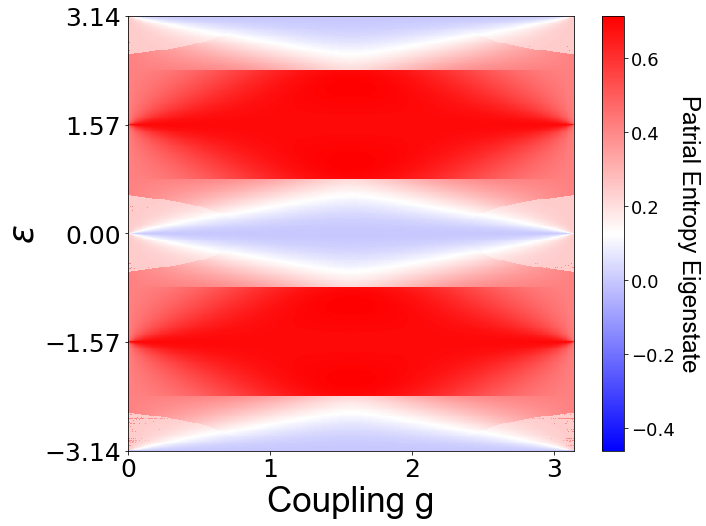

In [132]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,1,figsize=(10, 8))

p = axes.pcolor(g, eps, Fl_Ent, cmap=cm.bwr)

axes.axis('tight')
axes.set_xlabel(r'Coupling g', fontsize=35, **hfont)
axes.set_ylabel(r'$\epsilon$', fontsize=35, **hfont)

axes.tick_params(axis='x', labelsize=25)
axes.tick_params(axis='y', labelsize=25)

cb = fig.colorbar(p, ax=axes)
cb.set_label(r'Patrial Entropy Eigenstate', labelpad=25, rotation=270, fontsize=24, **hfont)
cb.ax.tick_params(labelsize=18) 

ymin, ymax = axes.get_ylim()
axes.set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))

#plt.gcf().set_size_inches(10, 8)
#plt.savefig("C:/neon/TM_WTF.pdf", bbox_inches="tight")

# Substraction

In [312]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaF(w, nSites)
g = 0.0                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [313]:
delta

[-0.0, -0.0]

In [314]:
Observables1 = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar

sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
        sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states

    observables = []
      
    for i in Final:        
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    f.value += 1
    Observables1[alpha_id] = observables

In [315]:
nSites = 2

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)        #unperfection of pulses
alpha = np.pi/2-eps
w = 0.00                                        #disorder
delta = deltaS(w, nSites)
g = 0.05                             #Interaction
T = 1  
time_steps = 150
times = np.linspace(1, time_steps, time_steps)

In [316]:
delta

[0, 0.0]

In [317]:
Observables2 = np.zeros((eps_steps,time_steps), dtype=np.float)

f = IntProgress(min=0, max=eps_steps) # instantiate the bar
display(f) # display the bar

sigZOp = tensorize1SiteMatrixKroneker(nSites, 1, 3)
for i in range(2, nSites+1,1):
    sigZOp = sigZOp + tensorize1SiteMatrixKroneker(nSites, i, 3)
    
for alpha_id, alpha_value in enumerate(alpha): 
    U=Ufunc_all_to_all(nSites,alpha_value,g,T,delta)
    phiInitFull = np.full((2**nSites), 0)
    phiInitFull[0] = 1                             ##initial state

    Final = states(phiInitFull,time_steps)                ## Evolution of states
    observables = [] 
    for i in Final:
        observables.append(np.dot(np.dot(np.conjugate(i).T,sigZOp),i).real)
    f.value += 1
    Observables2[alpha_id] = observables

In [318]:
x1=times

x2=np.pi/(x1)/4
x3=np.pi/(x1)/4*3
x4=np.pi/(x1)/4*5
x5=np.pi/(x1)/4*7
x6=np.pi/(x1)/4*9
x7=np.pi/(x1)/4*11
x8=np.pi/(x1)/4*13
x9=np.pi/(x1)/4*15
x10=np.pi/(x1)/4*17
x11=np.pi/(x1)/4*19
x12=np.pi/(x1)/4*21
x13=np.pi/(x1)/4*23
x14=np.pi/(x1)/4*25
x15=np.pi/(x1)/4*27
x16=np.pi/(x1)/4*29
x17=np.pi/(x1)/4*31
x18=np.pi/(x1)/4*33
x19=np.pi/(x1)/4*35
x20=np.pi/(x1)/4*37

XX = [x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20]

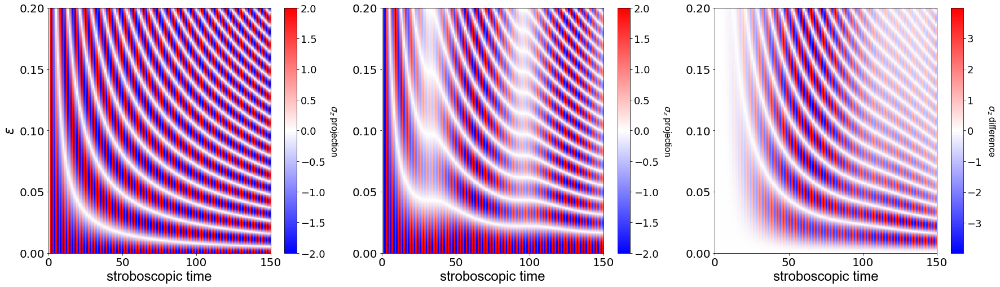

In [319]:
hfont = {'fontname':'Arial'}
fig, axes = plt.subplots(1,3,figsize=(30, 8))

p = axes[0].pcolor(times, eps, Observables1, cmap=cm.bwr)

axes[0].axis('tight')
axes[0].set_xlabel(r'stroboscopic time', fontsize=24, **hfont)
axes[0].set_ylabel(r'$\epsilon$', fontsize=24, **hfont)


axes[0].tick_params(axis='x', labelsize=20)
axes[0].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[0])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 

#for i in arange(0,19,1):
#    axes[0].plot(x1,XX[i], '--b' , linewidth=2.0)

#------------------------------------------------------------

p = axes[1].pcolor(times, eps, Observables2, cmap=cm.bwr)

axes[1].axis('tight')
axes[1].set_xlabel(r'stroboscopic time', fontsize=24, **hfont)

axes[1].tick_params(axis='x', labelsize=20)
axes[1].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[1])
cb.set_label(r'$\sigma_z$ projection', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


#for i in arange(0,19,1):
#    axes[1].plot(x1,XX[i], '--b' , linewidth=2.0)

#--------------------------------------------------------------

p = axes[2].pcolor(times, eps, Observables2-Observables1, cmap=cm.bwr)

axes[2].axis('tight')
axes[2].set_xlabel(r'stroboscopic time', fontsize=24, **hfont)


axes[2].tick_params(axis='x', labelsize=20)
axes[2].tick_params(axis='y', labelsize=20)

cb = fig.colorbar(p, ax=axes[2])
cb.set_label(r'$\sigma_z$ difference', labelpad=25, rotation=270, fontsize=16, **hfont)
cb.ax.tick_params(labelsize=18) 


#for i in arange(0,19,1):
#    axes[2].plot(x1,XX[i], '--b' , linewidth=2.0)

    
ymin, ymax = axes[0].get_ylim()
axes[0].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))
axes[1].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))
axes[2].set_yticks(np.round(np.linspace(ymin, ymax, 5), 2))
xmin, xmax = axes[0].get_xlim()
axes[0].set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))
axes[1].set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))
axes[2].set_xticks(np.round(np.linspace(xmin-1, xmax, 4), 2))


#matplotlib.pyplot.text(0.91, 0.91,'b', fontsize=24, weight="black",  verticalalignment='center', transform=axes.transAxes)
#plt.gcf().set_size_inches(20,8)
#plt.savefig("C:/neon/Simulated Tm_ substraction.pdf", bbox_inches="tight")

# Mikhail Fistul plot

In [23]:
from scipy import *
from scipy.constants import e, h, hbar
#from qutip import *
from IPython.display import HTML
import matplotlib as mpl
import matplotlib.pyplot as plt
from numpy import *
import random
import scipy.linalg as la
from scipy.linalg import expm, sinm, cosm
import pandas
import numpy
from mpl_toolkits.mplot3d.axes3d import Axes3D
import numpy as np
import matplotlib

In [30]:
import numpy as np
import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
from IPython.display import HTML
from mpl_toolkits.mplot3d.axes3d import Axes3D
from numpy import *
import random
import scipy.linalg as la
from scipy.linalg import expm, sinm, cosm
import pandas
matplotlib.colors
matplotlib.colors.rgb_to_hsv
matplotlib.colors.to_rgba
matplotlib.figure.Figure.get_size_inches
matplotlib.figure.Figure.subplots_adjust
matplotlib.axes.Axes.text
matplotlib.axes.Axes.hlines
%pylab inline

Populating the interactive namespace from numpy and matplotlib


C:\Anaconda3\lib\site-packages\IPython\core\magics\pylab.py:160: UserWarning: pylab import has clobbered these variables: ['random', 'f', 'test', 'axes']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [31]:
plt.style.use('seaborn-white')

In [32]:
import re

In [27]:
with open("Data1.TXT", "r+") as f:
    data=re.split('[,\n ]', f.read())
    
epsilllon = [] 
Blue = []
Red = []

for y in range(1, int(size(data)/5)+1,1):
    epsilllon.append(double(data[5*y-5]))
    Blue.append(double(data[5*y-3]))
    Red.append(double(data[5*y-2]))
    
lines = np.zeros((10,size(epsilllon)), dtype=np.float)
for i in arange(0,size(epsilllon)):
    for j in arange(0,10):
        lines[j][i] = j*2+2

In [33]:
Blue = []
Red = []

eps_steps = 500
eps=np.linspace(0.00, 0.2, eps_steps)       
g = 0.05                          

Blue = (2*1-1)*(np.sqrt(g**2+4*eps**2)/g)
Red = (2*2-1)*(np.sqrt(g**2+4*eps**2)/g)


lines = np.zeros((10,size(eps)), dtype=np.float)
for i in arange(0,size(eps)):
    for j in arange(0,10):
        lines[j][i] = j*2+2

In [36]:
from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
## for Palatino and other serif fonts use:
#rc('font',**{'family':'serif','serif':['Palatino']})
rc('text', usetex=True)

In [37]:
#hfont = {'fontname':'Arial'}
hfont = {'fontname':'Tahoma'}

#plt.rcParams["text.usetex"] =True

fig, axes = plt.subplots(1,1,figsize=(8, 6))

p = axes.plot(eps, Blue, 'b', linewidth=2.0)
p = axes.plot(eps,  Red, 'r', linewidth=2.0)

for i in arange(0,10):
    if i > 2:
        p = axes.plot(eps,  lines[i], 'k--', linewidth=2.0)
    if i < 5:
        p = axes.plot(eps,  lines[i], 'k--', linewidth=2.0)
    

axes.set_xlabel(r'$\epsilon$', fontsize=35, **hfont)
#axes.set_ylabel(r'$M(\pi-E^{(1)}_\mathrm{fl})/g$', fontsize=35, **hfont)
axes.set_ylabel(r'$\xi_k$', fontsize=35, **hfont)

xmin, xmax = axes.get_xlim()

axes.set_xlim(0.0,0.2)
axes.set_ylim(0.0,20)
axes.set_xticks(np.round(np.linspace(0.0, 0.2, 5), 2))
axes.set_yticks(np.round(np.linspace(0.0, 20, 5), 2))

matplotlib.pyplot.text(0.03, 0.91,'(c)', fontsize=40, verticalalignment='center', transform=axes.transAxes)

axes.tick_params(axis='y', labelsize=30)
axes.tick_params(axis='x', labelsize=30)

axes.set_xlim(0.0,0.2)

x = [0.022,0.043,0.062,0.08,0.098,0.114,0.1313,0.1487]
y = [   4,   6,  8,  10,  12,  14,  16, 18]

axes.scatter(x, y, s=70, facecolors='none', edgecolors='r', linewidth=2.0)

x = [0.045,0.097,0.147]
y = [    2,    4,    6]

axes.scatter(x, y, s=70, facecolors='none', edgecolors='b', linewidth=2.0)


#plt.gcf().set_size_inches(7.8,6)
#plt.savefig("C:/Users/Kirill Shulga/Desktop/Eigenstates_3.pdf", bbox_inches="tight")

FileNotFoundError: [WinError 2] The system cannot find the file specified